In [1]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LassoCV
from sklearn.model_selection import RepeatedKFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
from sklearn.linear_model import Lasso
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import loguniform
from sklearn.impute import SimpleImputer

In [2]:
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_clinical_without_harmonization.pkl")
print(r"Training samples:", X_train.shape)
print(r"Testing samples:", X_test.shape)
print(X_train.columns.tolist())
# Count missing values in one column
missing_count = X_train["Age"].isna().sum()
print("Missing values in Followup FVC Volume L:", missing_count)


Training samples: (448, 2659)
Testing samples: (112, 2659)
['original_shape_Elongation_right_lung', 'original_shape_Flatness_right_lung', 'original_shape_LeastAxisLength_right_lung', 'original_shape_MajorAxisLength_right_lung', 'original_shape_Maximum2DDiameterColumn_right_lung', 'original_shape_Maximum2DDiameterRow_right_lung', 'original_shape_Maximum2DDiameterSlice_right_lung', 'original_shape_Maximum3DDiameter_right_lung', 'original_shape_MeshVolume_right_lung', 'original_shape_MinorAxisLength_right_lung', 'original_shape_Sphericity_right_lung', 'original_shape_SurfaceArea_right_lung', 'original_shape_SurfaceVolumeRatio_right_lung', 'original_shape_VoxelVolume_right_lung', 'original_firstorder_10Percentile_right_lung', 'original_firstorder_90Percentile_right_lung', 'original_firstorder_Energy_right_lung', 'original_firstorder_Entropy_right_lung', 'original_firstorder_InterquartileRange_right_lung', 'original_firstorder_Kurtosis_right_lung', 'original_firstorder_Maximum_right_lung', 

In [ ]:
Clinical_Contineous_data = [ 
     'Baseline FVC Volume L',  
    'FEV1 Volume L', 
                            'Age'
       ]

Clinical_Categorical_data = [
        'Primary Diagnosis_CHP', 
       'Primary Diagnosis_CTD-ILD',
       'Primary Diagnosis_Emphysema', 'Primary Diagnosis_Exposure-related',
       'Primary Diagnosis_Fibrotic HP (FHP)', 'Primary Diagnosis_INSIP',
       'Primary Diagnosis_IPF', 'Primary Diagnosis_Idiopathic OP',
       'Primary Diagnosis_Idiopathic pleuroparenchymal fibroelastosis (IPPFE)',
       'Primary Diagnosis_Miscellaneous', 'Primary Diagnosis_NSIP',
       'Primary Diagnosis_No information',
       'Primary Diagnosis_Occupational-related ILD',
       'Primary Diagnosis_Sarcoidosis',
       'Primary Diagnosis_Smoking Related ILD (DIP / RB / RB-ILD)',
       'Primary Diagnosis_UILD', 'Sex_Female', 'Sex_Male',
       'Smoking History_Active Smoker', 'Smoking History_Ex Smoker',
       'Smoking History_Never Smoker', 'Smoking History_No Knowledge']

#Clinical_Categorical_data = ['Sex_Male', 'Primary Diagnosis_CTD-ILD', 'Primary Diagnosis_Exposure-related', 'Primary Diagnosis_Fibrotic HP (FHP)', 'Primary Diagnosis_INSIP', 'Primary Diagnosis_IPF', 'Primary Diagnosis_Idiopathic OP', 'Primary Diagnosis_Miscellaneous', 'Primary Diagnosis_No information', 'Primary Diagnosis_Occupational-related ILD', 'Primary Diagnosis_Other', 'Primary Diagnosis_Sarcoidosis', 'Primary Diagnosis_Smoking Related ILD (DIP / RB / RB-ILD)', 'Primary Diagnosis_UILD', 'Smoking History_Ex Smoker', 'Smoking History_Never Smoker', 'Smoking History_No Knowledge']


In [46]:

def compute_mll(y_true, y_pred, sigma):
    """
    Compute Modified Laplace Log-likelihood (MLL) score for FVC prediction in liters.
    """
    sigma_clipped = np.maximum(sigma, 0.07)  # 70 mL = 0.07 L
    delta = np.minimum(np.abs(y_true - y_pred), 1.0)  # 1000 mL = 1.0 L
    mll_scores = - (np.sqrt(2) * delta / sigma_clipped) - np.log(np.sqrt(2) * sigma_clipped)
    return mll_scores, np.mean(mll_scores)

def estimate_sigma_from_cv(X, y, pipeline, rkf):
    """
    Estimate per-sample uncertainty (σ) using residuals from repeated CV.
    Returns: array of σ values aligned with y
    """
    n_samples = len(y)
    sigma_matrix = np.zeros((n_samples, rkf.get_n_splits()))

    for fold_idx, (train_idx, val_idx) in enumerate(rkf.split(X)):
        pipeline.fit(X.iloc[train_idx], y.iloc[train_idx])
        y_val_pred = pipeline.predict(X.iloc[val_idx])
        residuals = np.abs(y.iloc[val_idx] - y_val_pred)
        sigma_matrix[val_idx, fold_idx] = residuals

    # Average residuals across folds per sample
    sigma_estimates = np.mean(sigma_matrix, axis=1)
    return sigma_estimates



def train_and_evaluate_lasso(X_train, X_test, y_train, y_test,
                             feature_list, numeric_features, onehot_features,
                             model_name="lasso_regression_pipeline.pkl"):

    print("Numeric features:", numeric_features)
    print("One-hot features:", onehot_features)
    print("number of features given as input:", len(numeric_features) + len(onehot_features))

    # ------------------------------
    # Preprocessor
    # ------------------------------
    preprocessor = ColumnTransformer(
        transformers=[
            # ("num", StandardScaler(), numeric_features),
            ("num", StandardScaler(), numeric_features),
            ("onehot", "passthrough", onehot_features)
        ]
    )

    # Repeated 5-fold CV (15 folds total) for alpha selection
    rkf_alpha = RepeatedKFold(n_splits=5, n_repeats=3, random_state=42)


    # # Base Lasso model
    # lasso = Lasso(max_iter=10000, random_state=42)

    # # RandomizedSearchCV for alpha
    # random_search = RandomizedSearchCV(
    #     estimator=lasso,
    #     param_distributions={"alpha": loguniform(1e-4, 1)},  # search space
    #     n_iter=50,                  # number of random samples
    #     cv=rkf_alpha,               # 15-fold CV
    #     scoring="neg_mean_squared_error",
    #     random_state=42,
    #     n_jobs=-1
    # )

    # # Define grid of alpha values (log-spaced between 1e-4 and 1)
    # alpha_grid = {"alpha": np.logspace(-4, 0, 20)}
    # # GridSearchCV for alpha tuning
    # grid_search = GridSearchCV(
    #     estimator=lasso,
    #     param_grid=alpha_grid,
    #     cv=rkf_alpha,
    #     scoring="neg_mean_squared_error",
    #     n_jobs=-1
    # )

    # pipeline = Pipeline([
    #     ("scaler", preprocessor),
    #     ("lasso", grid_search)
    # ])



    pipeline = Pipeline([
        ("scaler", preprocessor),
        ("lasso", LassoCV(
            alphas=np.logspace(-3.5, -1, 30),  # grid for alpha
            cv=rkf_alpha,                   # 15-fold CV for alpha
            random_state=42,
            n_jobs=-1,
            max_iter=100000
        ))
    ])

    mae_scores, mse_scores, rmse_scores, r2_scores = [], [], [], []
    fold_ids = []

    for repeat_idx, (train_idx, val_idx) in enumerate(rkf_alpha.split(X_train), start=1):
        pipeline.fit(X_train.iloc[train_idx], y_train.iloc[train_idx])
        y_val_pred = pipeline.predict(X_train.iloc[val_idx])
        y_val_true = y_train.iloc[val_idx]

        mae_scores.append(mean_absolute_error(y_val_true, y_val_pred))
        mse_scores.append(mean_squared_error(y_val_true, y_val_pred))
        rmse_scores.append(np.sqrt(mean_squared_error(y_val_true, y_val_pred)))
        r2_scores.append(r2_score(y_val_true, y_val_pred))
        fold_ids.append(repeat_idx)

    cv_results = pd.DataFrame({
        "RepeatFold": fold_ids,
        "MAE": mae_scores,
        "MSE": mse_scores,
        "RMSE": rmse_scores,
        "R2": r2_scores
    })

    print(f"MAE: {mae_scores}")
    print(f"MSE: {mse_scores}")
    # Convert each np.float64 to a normal float
    rmse = [float(x) for x in rmse_scores]
    print(f"RMSE: {rmse}")
    print(f"R2: {r2_scores}")
    print(cv_results)

    print("\nRepeated 5-Fold CV Results (15 runs):")
    print(cv_results.describe())

    # ------------------------------
    # Fit final model
    # ------------------------------
    pipeline.fit(X_train, y_train)
    y_test_pred = pipeline.predict(X_test)

    # best_alpha = pipeline.named_steps["lasso"].best_params_["alpha"]
    # print(f"\nBest alpha chosen by RandomizedSearchCV: {best_alpha:.6f}")

    # Best alpha from LassoCV
    best_alpha = pipeline.named_steps["lasso"].alpha_
    print(f"\nBest alpha chosen by LassoCV: {best_alpha:.6f}")

    # ------------------------------
    # Plot Training and Test R² vs alpha
    # ------------------------------

    alphas = np.logspace(-3.5, -1, 30)  # range of alpha values
    r2_train_scores = []
    r2_test_scores = []

    # Scale training and test data using the fitted preprocessor
    X_train_scaled = pipeline.named_steps["scaler"].transform(X_train)
    X_test_scaled = pipeline.named_steps["scaler"].transform(X_test)

    for a in alphas:
        lasso = Lasso(alpha=a, max_iter=10000, random_state=42)
        lasso.fit(X_train_scaled, y_train)

        # R² on training set
        y_train_pred1 = lasso.predict(X_train_scaled)
        r2_train_scores.append(r2_score(y_train, y_train_pred1))

        # R² on test set
        y_test_pred1 = lasso.predict(X_test_scaled)
        r2_test_scores.append(r2_score(y_test, y_test_pred1))

    # Best alpha from your fitted pipeline
    best_alpha = pipeline.named_steps["lasso"].alpha_

    plt.figure(figsize=(8, 6))
    plt.plot(np.log10(alphas), r2_train_scores, marker="o", label="Training R²")
    plt.plot(np.log10(alphas), r2_test_scores, marker="s", label="Test R²")
    plt.axvline(np.log10(best_alpha), color="red", linestyle="--",
                label=f"Best alpha = {best_alpha:.4f}")
    plt.xlabel("log10(alpha)")
    plt.ylabel("R² Score")
    plt.title("LASSO Regression: Training vs Test R² across alpha")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()



    # ---------------------------------------------------------
    # CORRECTED: MSE vs Lambda (alpha) using LassoCV.mse_path_
    # ---------------------------------------------------------
    lasso_cv = pipeline.named_steps["lasso"]

    alphas = lasso_cv.alphas_          # exact alphas used during CV
    mse_path = lasso_cv.mse_path_      # shape: (n_alphas, n_folds)

    mse_mean = mse_path.mean(axis=1)
    mse_std = mse_path.std(axis=1)

    plt.figure(figsize=(8, 6))
    plt.errorbar(
        alphas,
        mse_mean,
        yerr=mse_std,
        fmt='o',
        color='red',
        ecolor='lightblue',
        capsize=3,
        label='MSE ± std'
    )

    plt.axvline(best_alpha, color='black', linestyle='--',
                label=f'Best alpha = {best_alpha:.4f}')

    plt.xscale('log')
    plt.xlabel('Lambda (alpha)')
    plt.ylabel('Mean Squared Error')
    plt.title('LASSO: MSE vs Lambda')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


    test_mae = mean_absolute_error(y_test, y_test_pred)
    test_mse = mean_squared_error(y_test, y_test_pred)
    test_rmse = np.sqrt(test_mse)
    test_r2 = r2_score(y_test, y_test_pred)

    # ------------------------------
    # Compute MLL on test set
    # ------------------------------
    # Estimate σ from CV on training set
    sigma_train = estimate_sigma_from_cv(X_train, y_train, pipeline, rkf_alpha)

    # Use mean σ from training CV as proxy for test set
    sigma_test = np.full_like(y_test_pred, sigma_train.mean())

    # Compute MLL
    mll_scores, mean_mll = compute_mll(y_test.values, y_test_pred, sigma_test)
    print(f"- MLL (adaptive σ): {mean_mll:.4f}")


    print("\nTest set performance:")
    print(f"- MAE:  {test_mae:.2f} L")
    print(f"- MSE:  {test_mse:.2f} L²")
    print(f"- RMSE: {test_rmse:.2f} L")
    print(f"- R²:   {test_r2:.3f}")

    # Training set performance
    y_train_pred = pipeline.predict(X_train)
    train_mae = mean_absolute_error(y_train, y_train_pred)
    train_mse = mean_squared_error(y_train, y_train_pred)
    train_rmse = np.sqrt(train_mse)
    train_r2 = r2_score(y_train, y_train_pred)

    print("\nTraining set performance:")
    print(f"- MAE:  {train_mae:.2f} L")
    print(f"- MSE:  {train_mse:.2f} L²")
    print(f"- RMSE: {train_rmse:.2f} L")
    print(f"- R²:   {train_r2:.3f}")

    # ------------------------------
    # Inspect coefficients
    # ------------------------------
    # coefs = pipeline.named_steps["lasso"].best_estimator_.coef_

    coefs = pipeline.named_steps["lasso"].coef_   #for LASSOCV
    feature_names = pipeline.named_steps["scaler"].get_feature_names_out()
    # Strip transformer prefixes
    clean_feature_names = [name.split("__")[-1] for name in feature_names]
    coef_df = pd.DataFrame({
        "Feature": clean_feature_names,
        "Coefficient": coefs,
        "AbsCoefficient": np.abs(coefs)
    }).sort_values(by="AbsCoefficient", ascending=False)

    print("\nModel coefficients (sorted by |coef|):")
    print(coef_df[["Feature", "Coefficient"]])

    # Selected features (non-zero coefficients)
    selected_features = coef_df[coef_df["Coefficient"] != 0]["Feature"].tolist()
    print(f"\nSelected features (non-zero): {selected_features}")
    print(f"\nSelected features (non-zero): {len(selected_features)}")
    plt.figure(figsize=(8, 6))
    sns.barplot(
        data=coef_df.sort_values(by="AbsCoefficient", ascending=True),
        x="Coefficient", y="Feature", palette="viridis"
    )
    plt.title("LASSO Regression Coefficients")
    plt.xlabel("Coefficient")
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.show()

    # ------------------------------
    # Save model
    # ------------------------------
    joblib.dump(pipeline, model_name)

    # ------------------------------
    # Predicted vs Actual Plot
    # ------------------------------
    plt.figure(figsize=(7, 6))
    sns.scatterplot(x=y_test, y=y_test_pred, alpha=0.7)
    plt.plot([y_test.min(), y_test.max()],
             [y_test.min(), y_test.max()],
             color="red", linestyle="--", label="Perfect Prediction")
    plt.xlabel("Actual Values (L)")
    plt.ylabel("Predicted Values (L)")
    plt.title("Predicted vs Actual (Test Set)")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # ------------------------------
    # Residual Plot
    # ------------------------------
    residuals = y_test - y_test_pred
    plt.figure(figsize=(7, 6))
    sns.scatterplot(x=y_test_pred, y=residuals, alpha=0.7)
    plt.axhline(0, color="red", linestyle="--")
    plt.xlabel("Predicted Values (L)")
    plt.ylabel("Residuals (L)")
    plt.title("Residual Plot (Test Set)")
    plt.tight_layout()
    plt.show()

    # ------------------------------
    # Worst 5 patients (largest errors)
    # ------------------------------
    errors = np.abs(y_test - y_test_pred)
    error_df = pd.DataFrame({
        "Baseline_FVC": X_test["Baseline FVC Volume L"].values if "Baseline FVC Volume L" in X_test.columns else np.nan,
        "Target_FVC": y_test.values,
        "Predicted_FVC": y_test_pred,
        "Abs_Error": errors,
        "Baseline_FVC_Week": X_test["Baseline FVC Week"].values if "Baseline FVC Week" in X_test.columns else np.nan,
        "Followup_FVC_Week": X_test["Followup FVC Week"].values if "Followup FVC Week" in X_test.columns else np.nan,
    })

    worst5 = error_df.sort_values(by="Abs_Error", ascending=False).head(5)
    print("\nTop 5 patients with largest errors:")
    print(worst5)

    for idx, row in worst5.iterrows():
        patient_df = pd.DataFrame({
            "Week": [row["Baseline_FVC_Week"], row["Followup_FVC_Week"]],
            "Actual_FVC": [row["Baseline_FVC"], row["Target_FVC"]],
            "Predicted_FVC": [row["Baseline_FVC"], row["Predicted_FVC"]]
        })
        plot_df = patient_df.melt(id_vars="Week",
                                  value_vars=["Actual_FVC", "Predicted_FVC"],
                                  var_name="Type", value_name="FVC")
        plt.figure(figsize=(7, 5))
        sns.lineplot(data=plot_df, x="Week", y="FVC", hue="Type", marker="o")
        plt.title(f"Patient {idx}: Actual vs Predicted FVC (Worst Error)")
        plt.xlabel("Week")
        plt.ylabel("FVC (Liters)")
        plt.tight_layout()
        plt.show()

    # ------------------------------
    # Best 5 patients (increasing FVC + lowest error)
    # ------------------------------
    increasing = error_df["Target_FVC"] > error_df["Baseline_FVC"]
    best_patients = error_df[increasing].sort_values(by="Abs_Error", ascending=True).head(5)

    print("\nTop 5 patients with increasing FVC and lowest error:")
    print(best_patients)

    for idx, row in best_patients.iterrows():
        patient_df = pd.DataFrame({
            "Week": [row["Baseline_FVC_Week"], row["Followup_FVC_Week"]],
            "Actual_FVC": [row["Baseline_FVC"], row["Target_FVC"]],
            "Predicted_FVC": [row["Baseline_FVC"], row["Predicted_FVC"]]
        })

        plot_df = patient_df.melt(id_vars="Week",
                                value_vars=["Actual_FVC", "Predicted_FVC"],
                                var_name="Type", value_name="FVC")

        plt.figure(figsize=(7, 5))
        sns.lineplot(data=plot_df, x="Week", y="FVC", hue="Type", marker="o")
        plt.title(f"Patient {idx}: Actual vs Predicted FVC (Low Error, Increasing FVC)")
        plt.xlabel("Week")
        plt.ylabel("FVC (Liters)")
        plt.legend(title="Measurement")
        plt.tight_layout()
        plt.show()
        
    import shap

    # Extract model and preprocessor
    lasso_model = pipeline.named_steps["lasso"]
    preprocessor = pipeline.named_steps["scaler"]

    # Transform data
    X_train_scaled = preprocessor.transform(X_train)
    X_test_scaled = preprocessor.transform(X_test)

    # Get feature names
    feature_names = preprocessor.get_feature_names_out()

    # Create explainer
    explainer = shap.LinearExplainer(lasso_model, X_train_scaled, feature_perturbation="interventional")

    # First compute shap_values
    raw_shap_values = explainer(X_test_scaled)

    # Now wrap into Explanation object with feature names
    shap_values = shap.Explanation(values=raw_shap_values.values,
                                base_values=raw_shap_values.base_values,
                                data=X_test_scaled,
                                feature_names=feature_names)

    # Example: waterfall plot for one patient
    patient_index = 0
    shap.plots.waterfall(shap_values[patient_index])

    shap.summary_plot(shap_values, X_test_scaled, max_display=5)
    shap.plots.beeswarm(shap_values)

    shap.summary_plot(shap_values, X_test_scaled, plot_type="bar", max_display=5)


    return {
        "cv_results": cv_results,
        "test_results": {
            "MAE": test_mae,
            "MSE": test_mse,
            "RMSE": test_rmse,
            "R2": test_r2
        },
        "coef_df": coef_df,
        "worst5": worst5,
        "best_patients": best_patients
    }

['original_shape_MinorAxisLength_left_lung', 'wavelet-HLH_gldm_DependenceNonUniformityNormalized_right_lung', 'log-sigma-2-0-mm-3D_firstorder_10Percentile_right_lung', 'original_shape_MinorAxisLength_right_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'original_shape_SurfaceArea_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glcm_InverseVariance_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Kurtosis_left_lung', 'log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung', 'wavelet-LHL_glcm_Idmn_left_lung', 'log-sigma-1-0-mm-3D_firstorder_Skewness_left_lung', 'wavelet-HLL_firstorder_Kurtosis_left_lung']
Training samples: ['original_shape_Elongation_right_lung', 'original_shape_Flatness_right_lung', 'original_shape_LeastAxisLength_right_lu

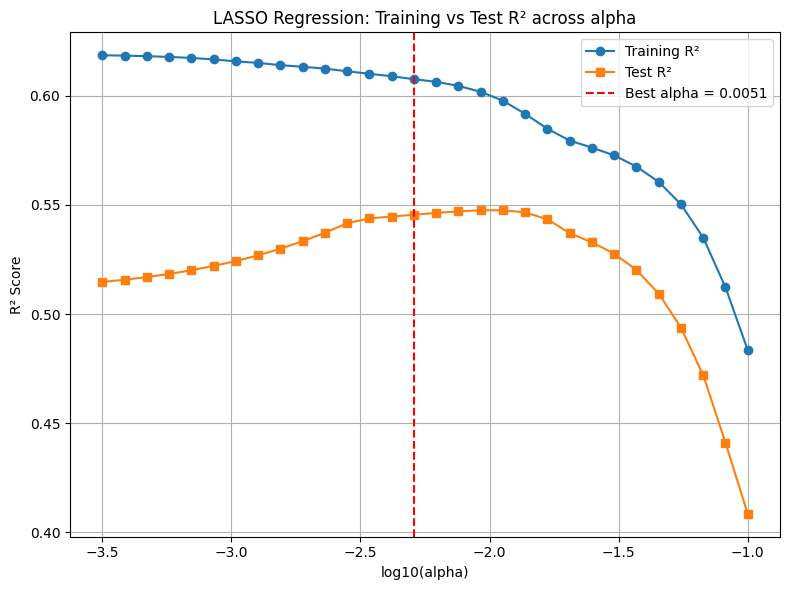

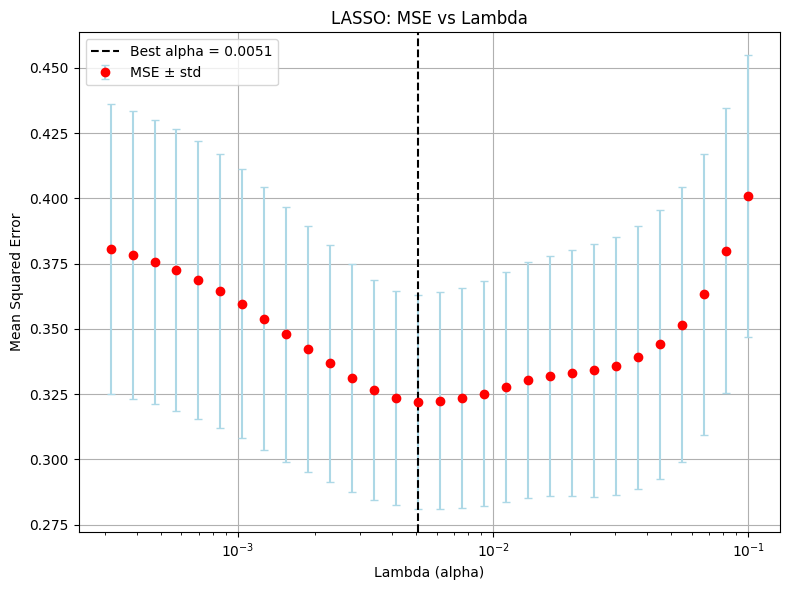

- MLL (adaptive σ): -5.1256

Test set performance:
- MAE:  0.49 L
- MSE:  0.39 L²
- RMSE: 0.63 L
- R²:   0.546

Training set performance:
- MAE:  0.44 L
- MSE:  0.31 L²
- RMSE: 0.56 L
- R²:   0.578

Model coefficients (sorted by |coef|):
                                              Feature   Coefficient
33                                         Sex_Female -5.454500e-01
3   log-sigma-2-0-mm-3D_firstorder_10Percentile_ri...  1.896831e-01
1            original_shape_MinorAxisLength_left_lung  1.446048e-01
0                                                 Age -1.111811e-01
4           original_shape_MinorAxisLength_right_lung  9.864034e-02
14                    wavelet-LHL_glcm_Idmn_left_lung  9.245332e-02
6               original_shape_SurfaceArea_right_lung  6.124261e-02
12  log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGra... -5.714015e-02
23                              Primary Diagnosis_IPF  5.475533e-02
7   original_gldm_LargeDependenceLowGrayLevelEmpha...  2.976631e-02
15  log-sigma-

/tmp/ipykernel_965824/2937061212.py:281: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


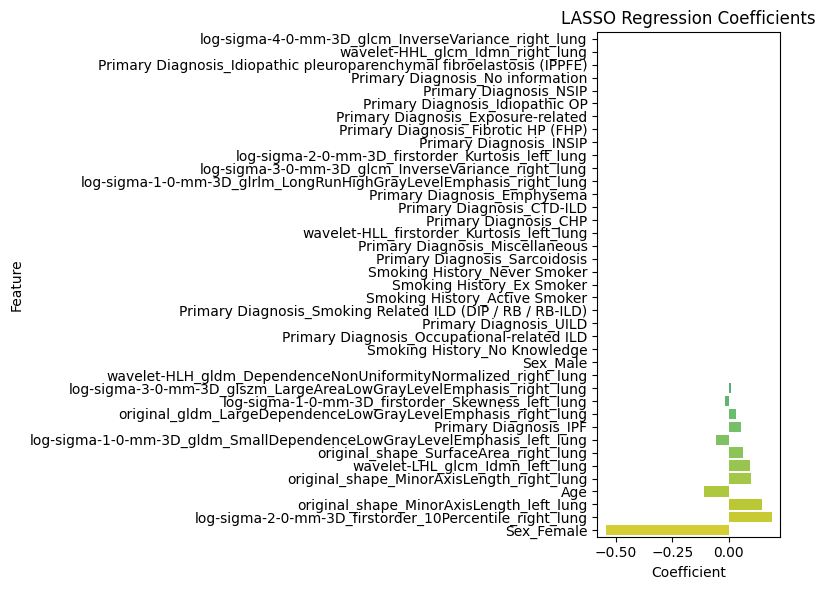

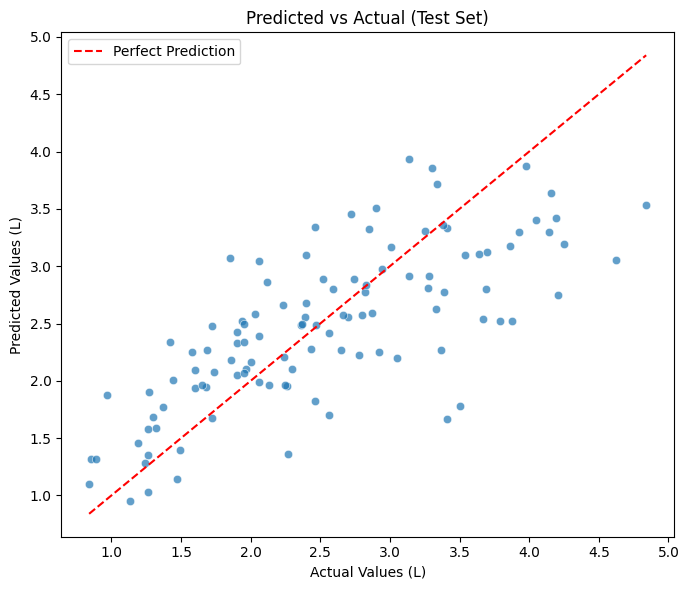

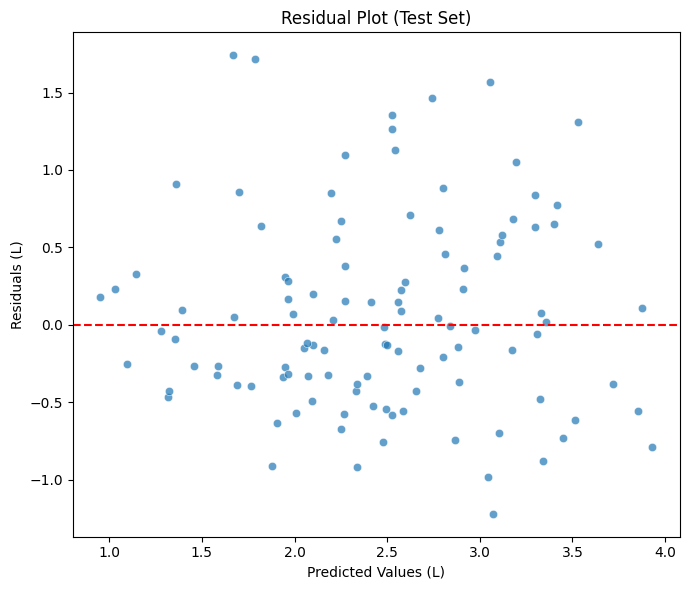


Top 5 patients with largest errors:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
367          3.66        3.41       1.669291   1.740709                0.0   
176          3.33        3.50       1.783876   1.716124                0.0   
268          4.76        4.62       3.054239   1.565761                0.0   
210          4.29        4.21       2.744444   1.465556                0.0   
81           3.59        3.88       2.525491   1.354509                0.0   

     Followup_FVC_Week  
367               54.0  
176               48.0  
268               53.0  
210               52.0  
81                52.0  


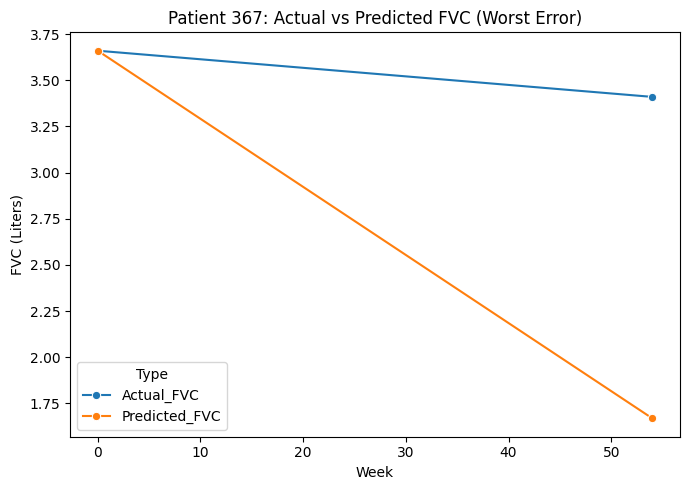

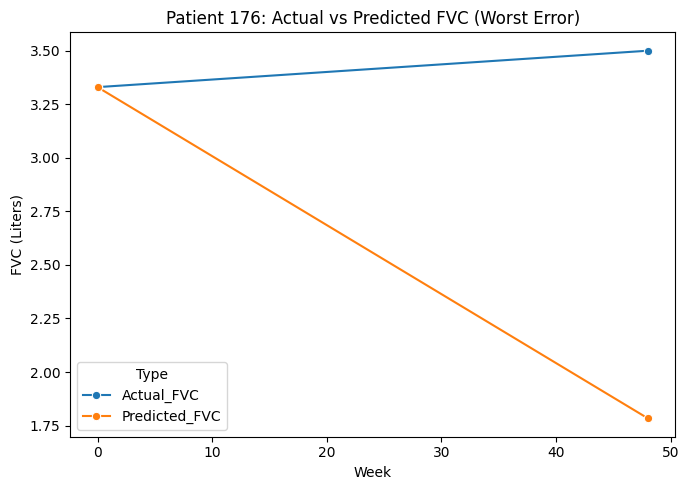

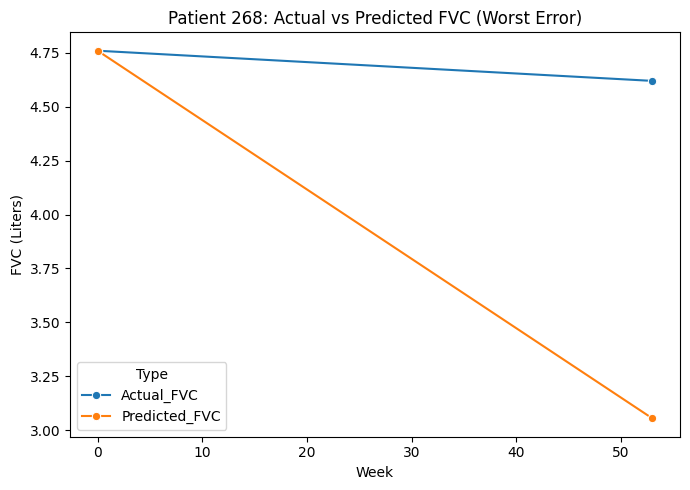

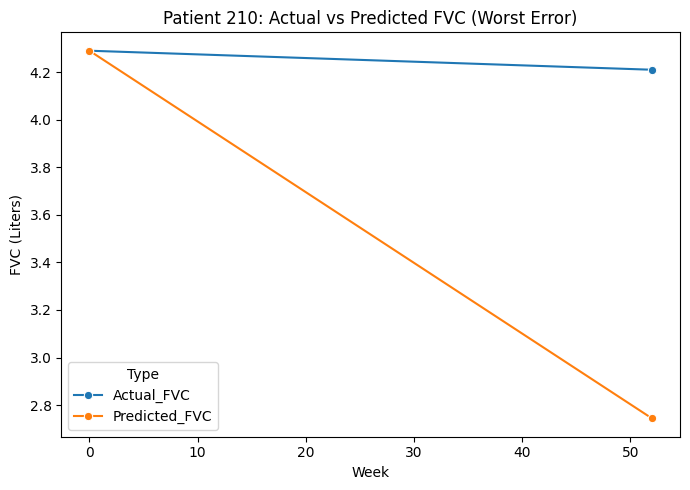

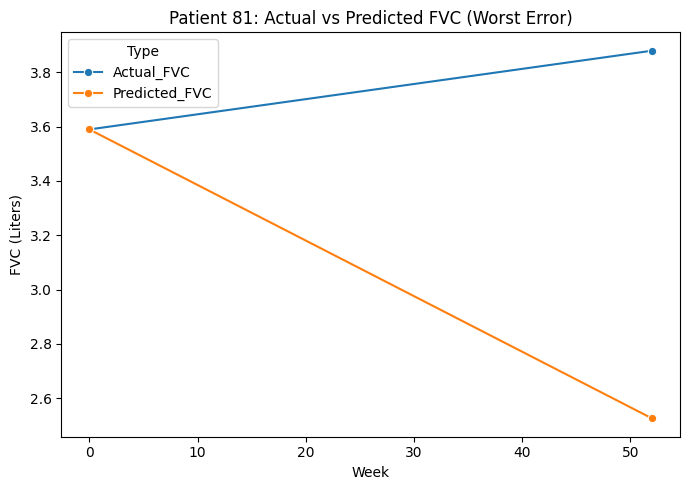


Top 5 patients with increasing FVC and lowest error:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
72           2.42        2.47       2.483646   0.013646                0.0   
412          2.09        2.24       2.206853   0.033147                0.0   
512          2.76        2.82       2.775456   0.044544                0.0   
352          3.20        3.25       3.306176   0.056176                0.0   
440          1.98        2.06       1.992044   0.067956                0.0   

     Followup_FVC_Week  
72                53.0  
412               55.0  
512               55.0  
352               48.0  
440               53.0  


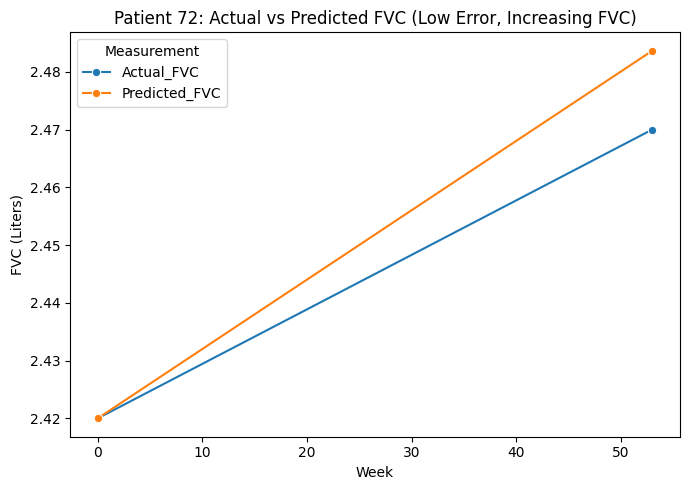

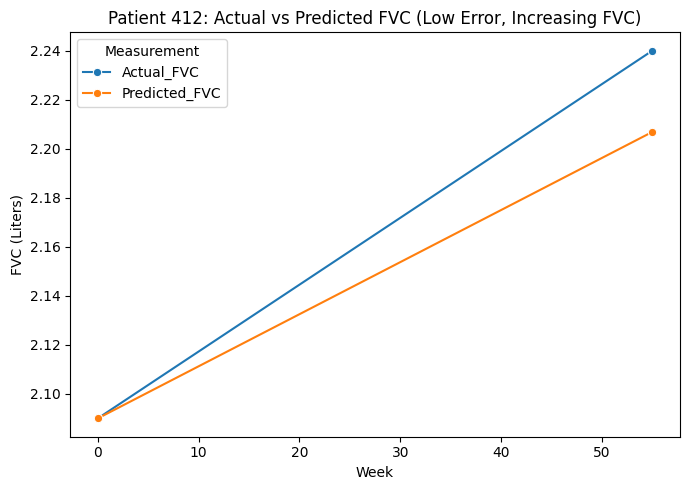

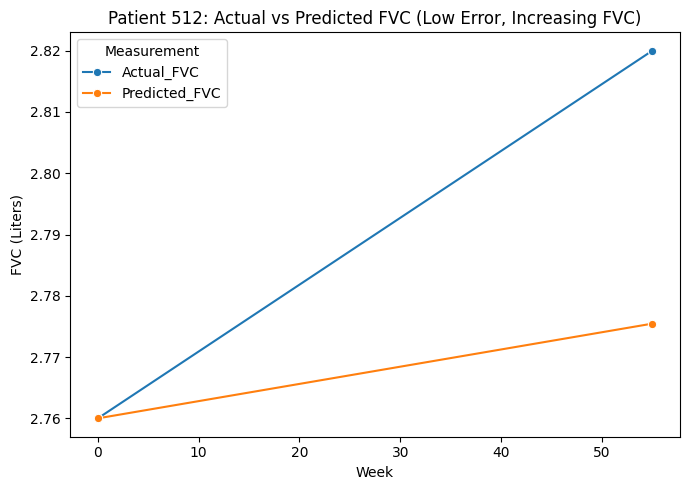

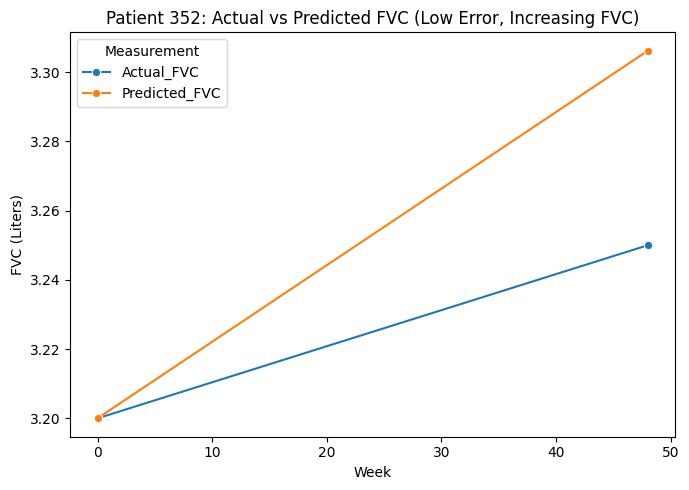

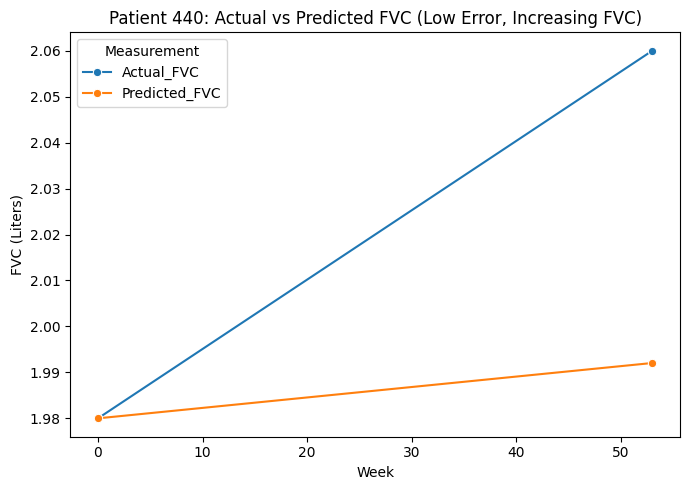

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


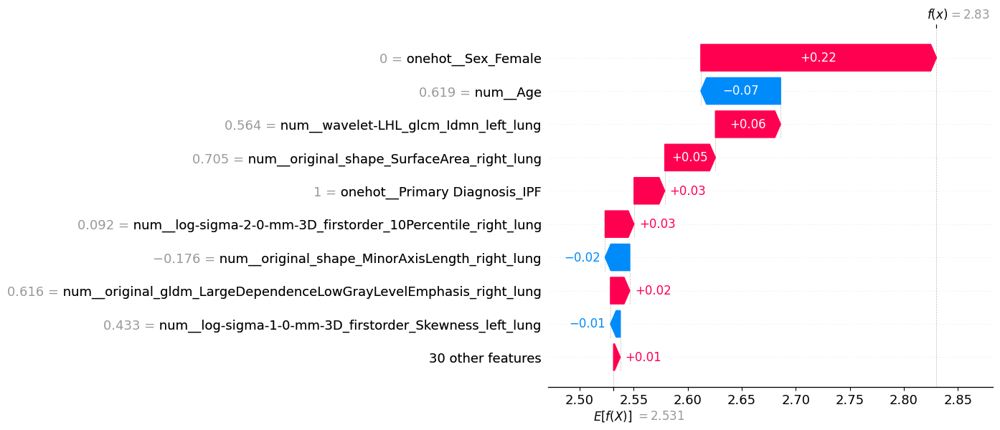

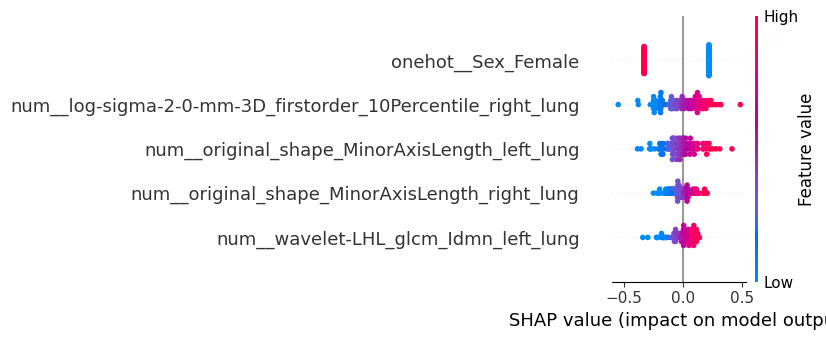

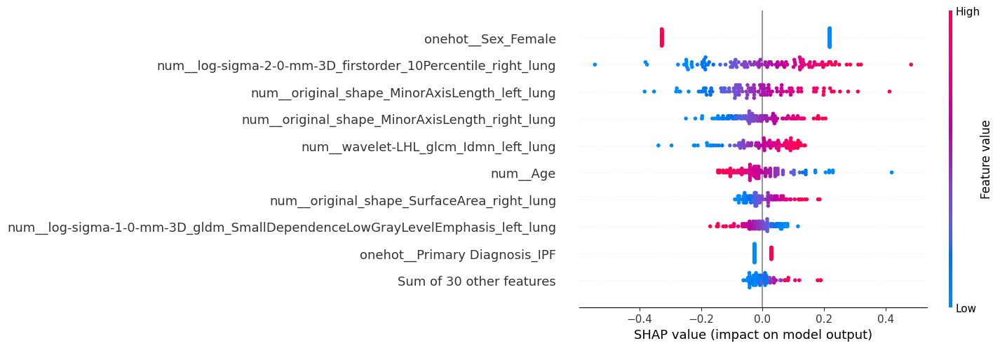

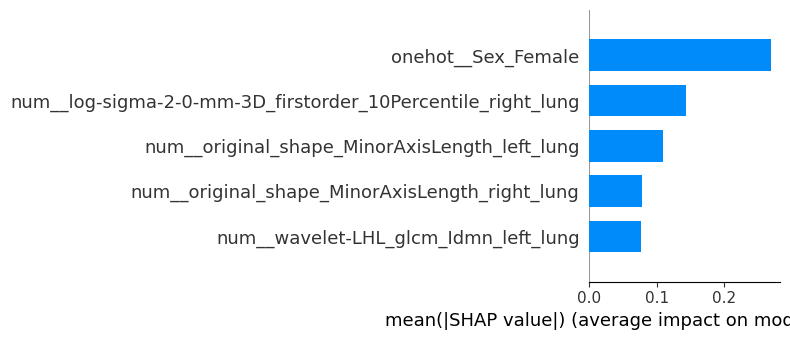

In [47]:
#tested
#selected_features =[]
selected_features = ['original_shape_MinorAxisLength_left_lung', 'wavelet-HLH_gldm_DependenceNonUniformityNormalized_right_lung', 'log-sigma-2-0-mm-3D_firstorder_10Percentile_right_lung', 'original_shape_MinorAxisLength_right_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'original_shape_SurfaceArea_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glcm_InverseVariance_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Kurtosis_left_lung', 'log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung', 'wavelet-LHL_glcm_Idmn_left_lung', 'log-sigma-1-0-mm-3D_firstorder_Skewness_left_lung', 'wavelet-HLL_firstorder_Kurtosis_left_lung']
#selected_features = ['original_shape_MinorAxisLength_lung', 'wavelet-HLH_gldm_DependenceNonUniformityNormalized_lung', 'log-sigma-2-0-mm-3D_firstorder_10Percentile_lung', 'original_shape_MinorAxisLength_lung', 'wavelet-HHL_glcm_Idmn_lung', 'original_shape_SurfaceArea_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_lung', 'log-sigma-3-0-mm-3D_glcm_InverseVariance_lung', 'log-sigma-2-0-mm-3D_firstorder_Kurtosis_lung', 'log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_lung', 'wavelet-LHL_glcm_Idmn_lung', 'log-sigma-1-0-mm-3D_firstorder_Skewness_lung', 'wavelet-HLL_firstorder_Kurtosis_lung']

Clinical_Contineous_data_ext = Clinical_Contineous_data + selected_features
print(selected_features)
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_clinical_without_harmonization.pkl")

print("Training samples:", X_train.columns.tolist())
## Copy train/test
X_train_clini_log = X_train.copy()
X_test_clini_log  = X_test.copy()

# Transform Age
for col in ['Age']:
    X_train_clini_log[col] = np.log(X_train_clini_log[col])
    X_test_clini_log[col] = np.log(X_test_clini_log[col])

# Median imputation (only needed if missing values exist)
imp_median = SimpleImputer(strategy='median')
imp_median.fit(X_train_clini_log)

X_train_median_filled = pd.DataFrame(
    imp_median.transform(X_train_clini_log),
    columns=X_train_clini_log.columns,
    index=X_train_clini_log.index
)

X_test_median_filled = pd.DataFrame(
    imp_median.transform(X_test_clini_log),
    columns=X_test_clini_log.columns,
    index=X_test_clini_log.index
)

# Run experiments
results1 = train_and_evaluate_lasso(X_train_median_filled, X_test_median_filled, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data, model_name="/home/pansurya/OSIC_thesis/Linear_model/Correlation_.pkl")
# print("Running LOOCV experiment...")
# results1 = train_and_evaluate_with_LOOCV(X_train, X_test, y_train, y_test, selected_features, model_name="/home/pansurya/OSIC_thesis/Linear_model/PAM_ANOVA_VIF_LOOCV.pkl")


['original_shape_MinorAxisLength_lung', 'wavelet-HLH_gldm_DependenceNonUniformityNormalized_lung', 'log-sigma-2-0-mm-3D_firstorder_10Percentile_lung', 'original_shape_MinorAxisLength_lung', 'wavelet-HHL_glcm_Idmn_lung', 'original_shape_SurfaceArea_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_lung', 'log-sigma-3-0-mm-3D_glcm_InverseVariance_lung', 'log-sigma-2-0-mm-3D_firstorder_Kurtosis_lung', 'log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_lung', 'wavelet-LHL_glcm_Idmn_lung', 'log-sigma-1-0-mm-3D_firstorder_Skewness_lung', 'wavelet-HLL_firstorder_Kurtosis_lung']
(448, 16)
(112, 16)
Numeric features: ['original_shape_MinorAxisLength_lung', 'wavelet-HLH_gldm_DependenceNonUniformityNormalized_lung', 'log-sigma-2-0-mm-3D_firstorder_10Percentile_lung', 'original_shape_MinorAxisLength_lung',

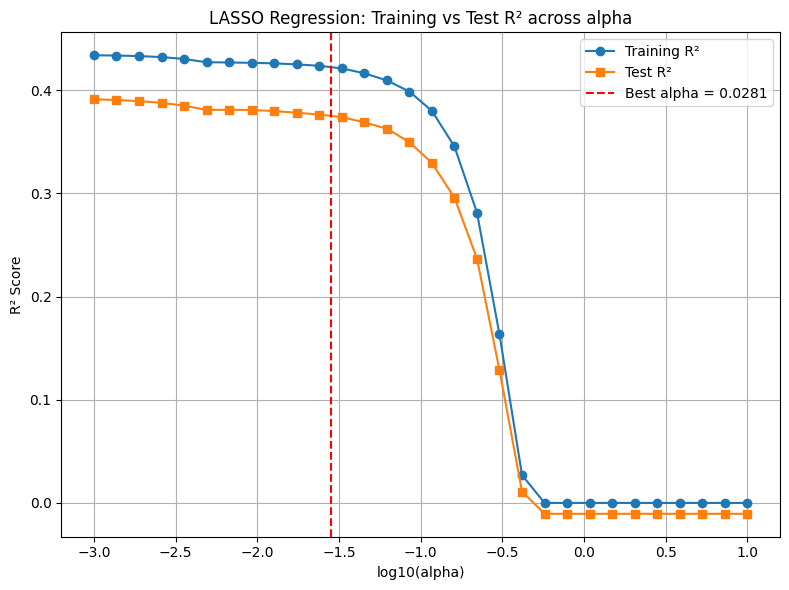

- MLL (adaptive σ): -5.0652

Test set performance:
- MAE:  0.57 L
- MSE:  0.48 L²
- RMSE: 0.70 L
- R²:   0.375

Training set performance:
- MAE:  0.53 L
- MSE:  0.44 L²
- RMSE: 0.67 L
- R²:   0.417

Model coefficients (sorted by |coef|):
                                              Feature  Coefficient
5                     original_shape_SurfaceArea_lung     0.252107
8        log-sigma-2-0-mm-3D_firstorder_Kurtosis_lung     0.126049
10  log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLeve...     0.117260
13                         wavelet-LHL_glcm_Idmn_lung     0.096072
15               wavelet-HLL_firstorder_Kurtosis_lung     0.048805
11  log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGra...    -0.035906
2    log-sigma-2-0-mm-3D_firstorder_10Percentile_lung     0.034383
6   original_gldm_LargeDependenceLowGrayLevelEmpha...     0.028762
14       log-sigma-1-0-mm-3D_firstorder_Skewness_lung    -0.024626
7       log-sigma-3-0-mm-3D_glcm_InverseVariance_lung    -0.000000
1   wavelet-HLH_gldm_Depe

/tmp/ipykernel_3538301/714975100.py:245: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


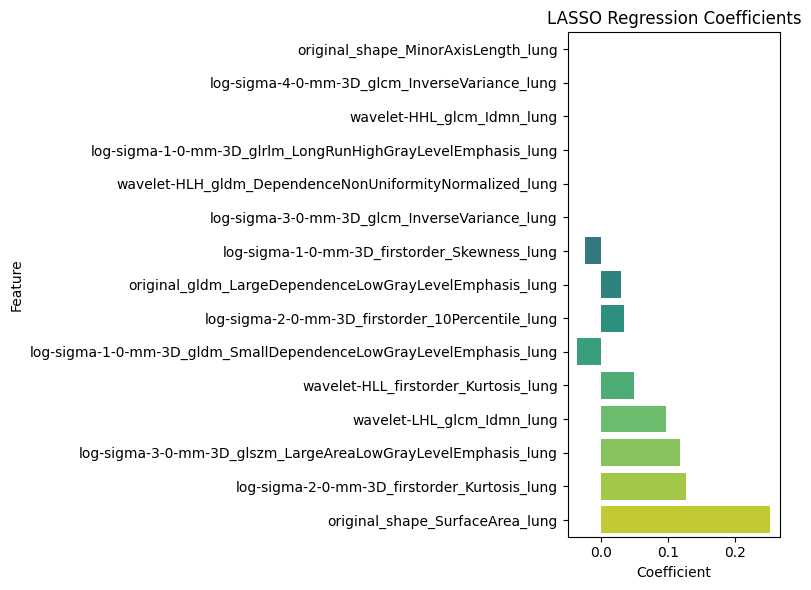

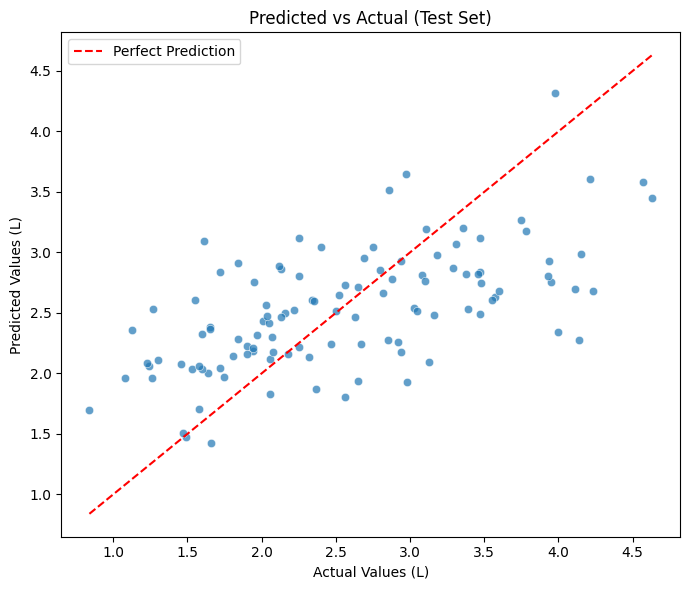

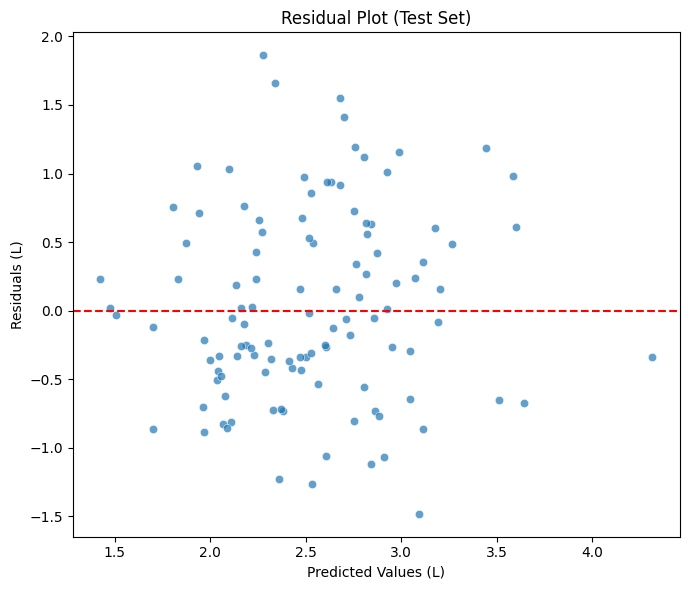


Top 5 patients with largest errors:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
104          3.37        4.14       2.277518   1.862482                  0   
460          3.85        4.00       2.340181   1.659819                  0   
410          4.31        4.23       2.680799   1.549201                  0   
479          2.11        1.61       3.092071   1.482071                  0   
368          4.00        4.11       2.699191   1.410809                  0   

     Followup_FVC_Week  
104               52.0  
460               56.0  
410               53.0  
479               48.0  
368               53.0  


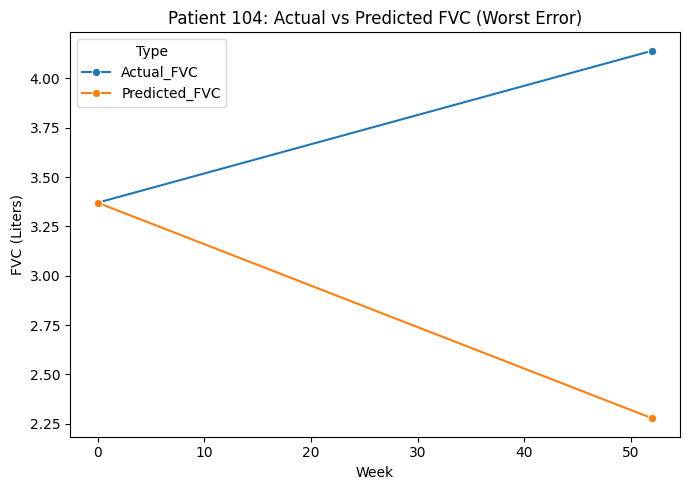

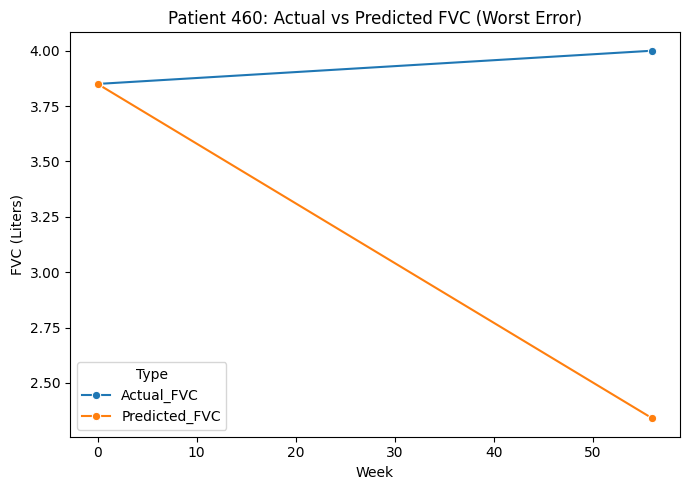

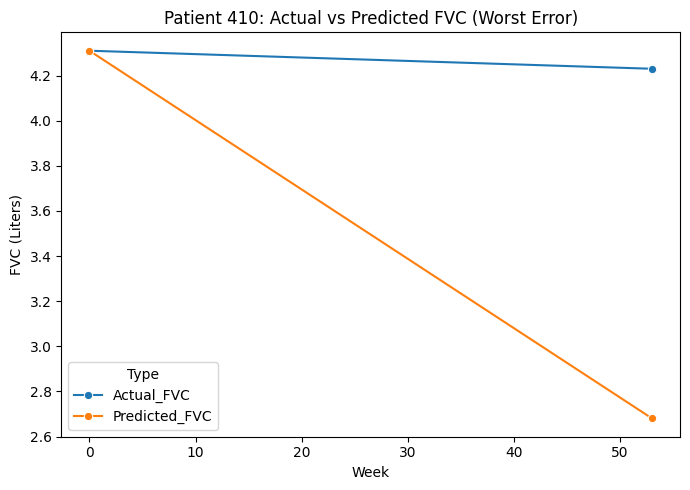

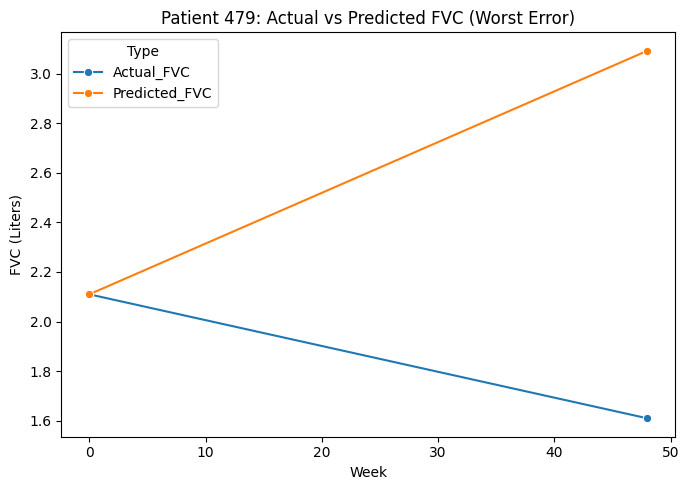

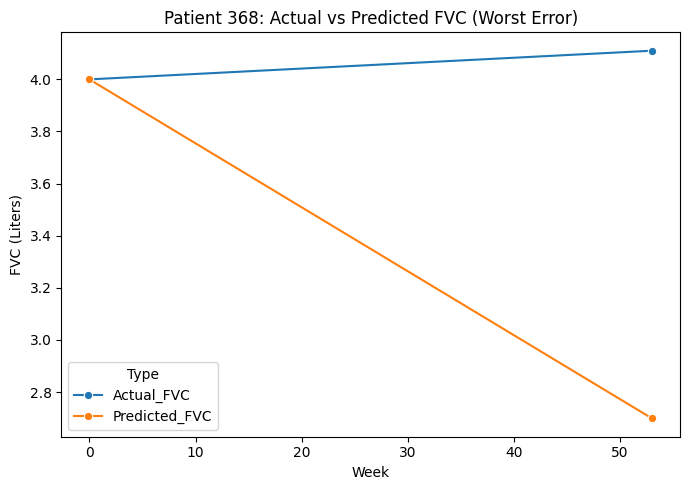


Top 5 patients with increasing FVC and lowest error:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
86           1.43        1.49       1.474567   0.015433                  0   
482          2.20        2.50       2.519732   0.019732                  0   
39           2.59        2.65       2.712040   0.062040                  0   
332          3.04        3.11       3.193122   0.083122                  0   
546          2.81        2.88       2.779537   0.100463                  0   

     Followup_FVC_Week  
86                54.0  
482               52.0  
39                55.0  
332               51.0  
546               54.0  


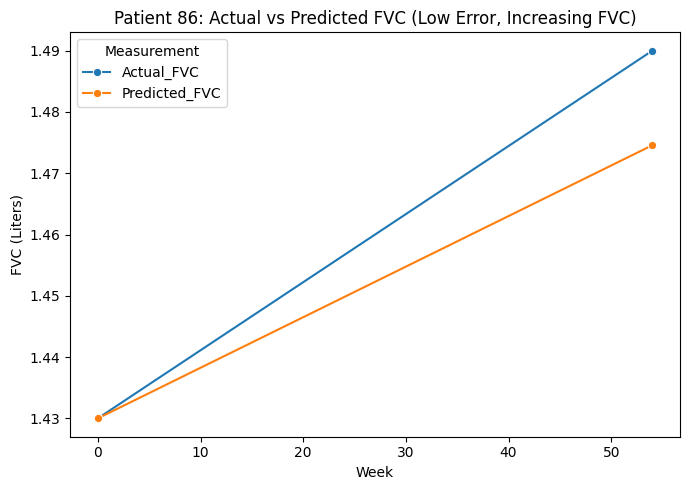

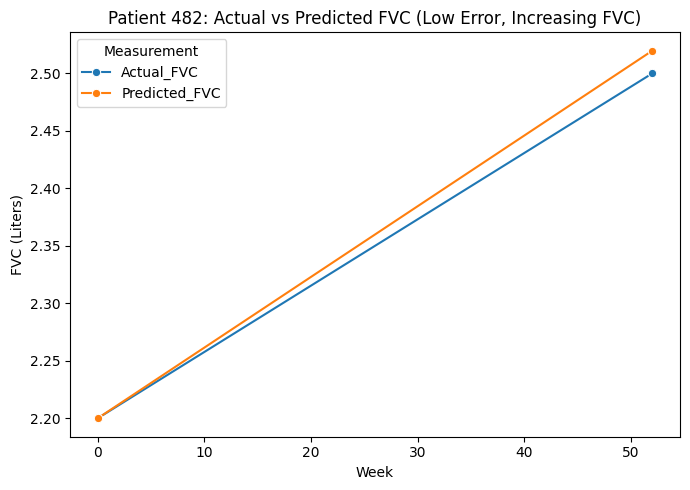

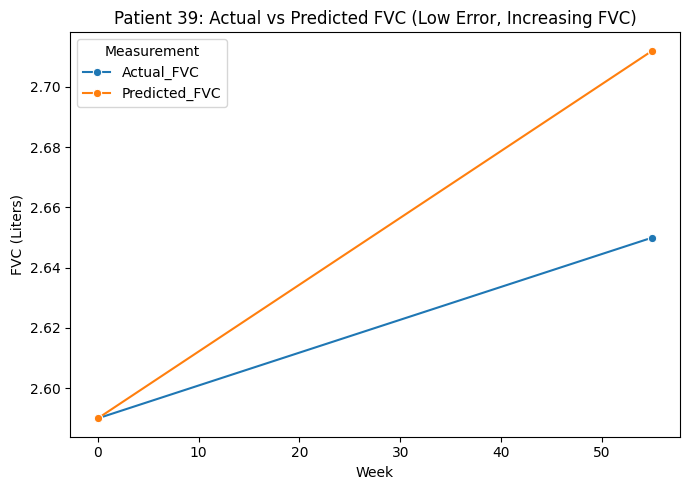

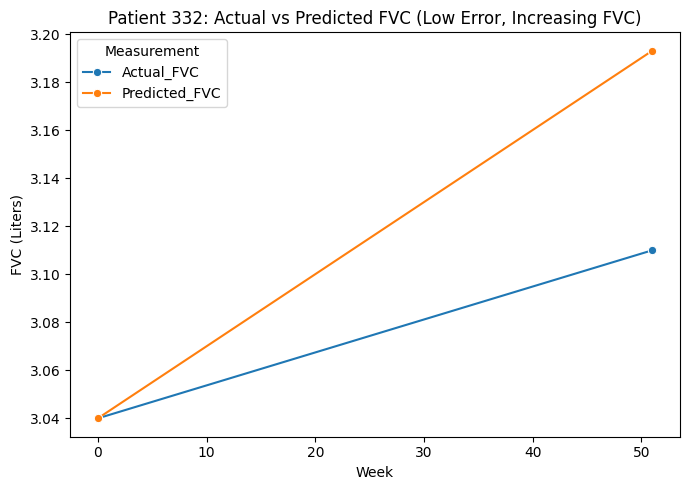

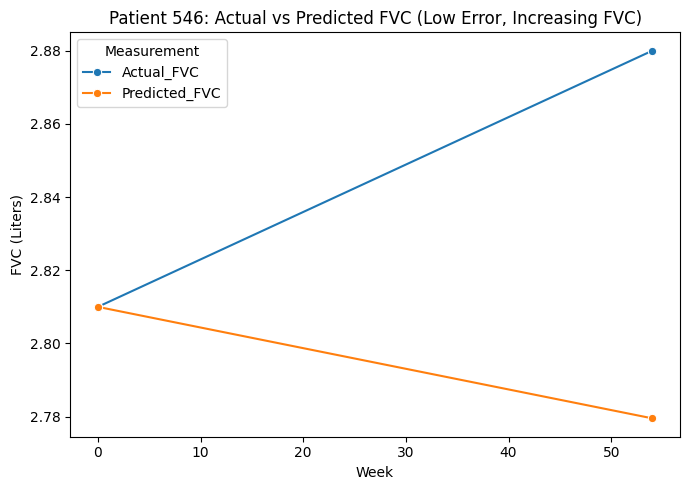

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


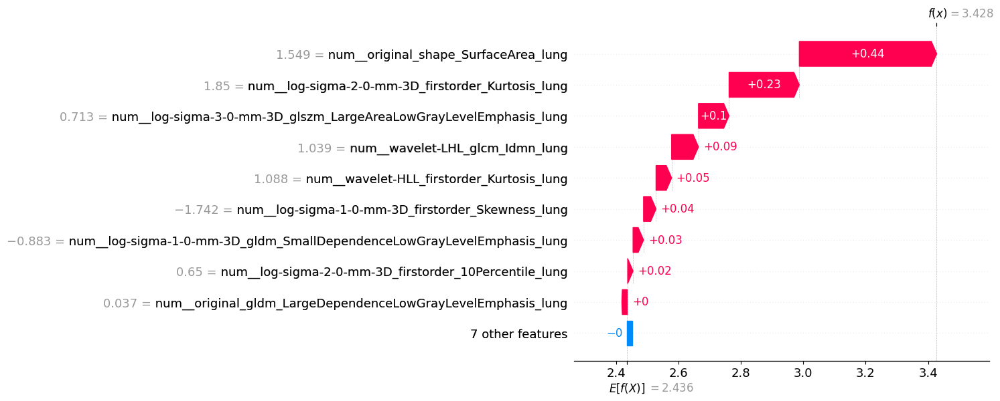

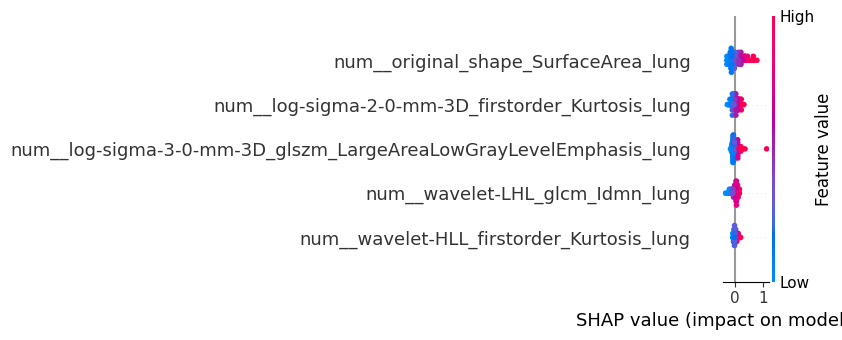

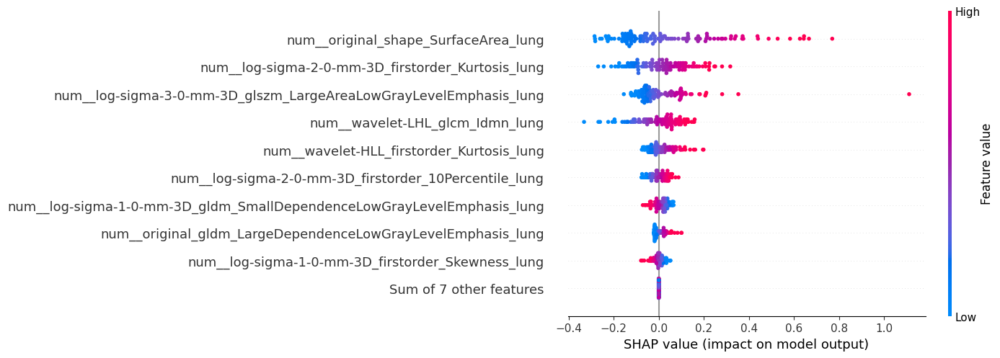

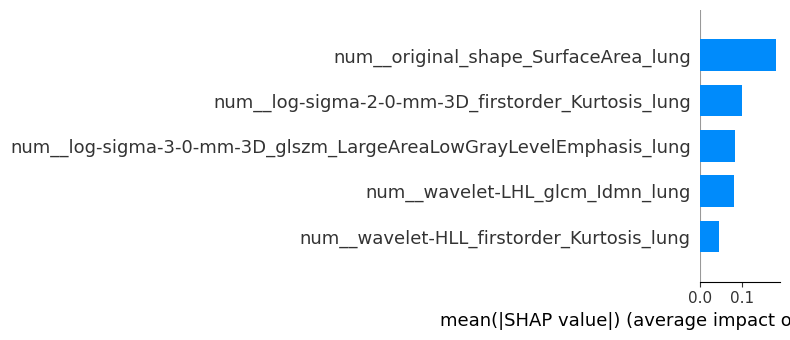

In [6]:
#tested, not good method only using radiomics
selected_features = ['original_shape_MinorAxisLength_lung', 'wavelet-HLH_gldm_DependenceNonUniformityNormalized_lung', 'log-sigma-2-0-mm-3D_firstorder_10Percentile_lung', 'original_shape_MinorAxisLength_lung', 'wavelet-HHL_glcm_Idmn_lung', 'original_shape_SurfaceArea_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_lung', 'log-sigma-3-0-mm-3D_glcm_InverseVariance_lung', 'log-sigma-2-0-mm-3D_firstorder_Kurtosis_lung', 'log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_lung', 'wavelet-LHL_glcm_Idmn_lung', 'log-sigma-1-0-mm-3D_firstorder_Skewness_lung', 'wavelet-HLL_firstorder_Kurtosis_lung']
Clinical_Contineous_data_ext = selected_features 
print(selected_features)
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_clinical_without_harmonization.pkl")
# Subset features
X_train_sel = X_train[selected_features]
X_test_sel = X_test[selected_features]
print(X_train_sel.shape)
print(X_test_sel.shape)
Clinical_Categorical_data1 = []




# Run experiments
results1 = train_and_evaluate_lasso(X_train, X_test, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data1, model_name="/home/pansurya/OSIC_thesis/Linear_model/PAM_.pkl")

In [ ]:
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_clinical_without_harmonization.pkl")
# Radiomics: automatically grab all columns with certain prefixes
Radiomics_data = [col for col in X_train.columns 
                  if col.startswith(("wavelet", "original", "log-sigma"))]
all_features = Clinical_Contineous_data + Radiomics_data


X_train_clini_log = X_train.copy()
X_test_clini_log  = X_test.copy()

# Transform Age
for col in ['Age']:
    X_train_clini_log[col] = np.log(X_train_clini_log[col])
    X_test_clini_log[col] = np.log(X_test_clini_log[col])

# Median imputation (only needed if missing values exist)
imp_median = SimpleImputer(strategy='median')
imp_median.fit(X_train_clini_log)

X_train_median_filled = pd.DataFrame(
    imp_median.transform(X_train_clini_log),
    columns=X_train_clini_log.columns,
    index=X_train_clini_log.index
)

X_test_median_filled = pd.DataFrame(
    imp_median.transform(X_test_clini_log),
    columns=X_test_clini_log.columns,
    index=X_test_clini_log.index
)

results1 = train_and_evaluate_lasso(X_train_median_filled, X_test_median_filled, y_train, y_test, all_features, all_features, Clinical_Categorical_data, model_name="/home/pansurya/OSIC_thesis/LASSO_model/LASSO_With_All_Clinical_Radiomics_without_harmonization.pkl")

['wavelet-LLL_glszm_GrayLevelVariance_left_lung', 'original_shape_MinorAxisLength_left_lung', 'original_gldm_SmallDependenceHighGrayLevelEmphasis_right_lung', 'original_glszm_LargeAreaLowGrayLevelEmphasis_left_lung', 'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'Baseline FVC Volume L', 'FEV1 Volume L', 'Age']
Numeric features: ['wavelet-LLL_glszm_GrayLevelVariance_left_lung', 'original_shape_MinorAxisLength_left_lung', 'original_gldm_SmallDependenceHighGrayLevelEmphasis_right_lung', 'original_glszm_LargeAreaLowGrayLevelEmphasis_left_lung', 'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'Baseline FVC Volume L', 'FEV1 Volume L', 'Age']
One-hot features: ['Sex_Male', 'Primary Diagnosis_CTD-ILD', 'Primary Diagnosis_Exposure-related', 'Primary Diagnosis_Fibrotic HP (FHP)', 'Primary Diagnosis_INSIP', 'Primary Diagnosis_IPF

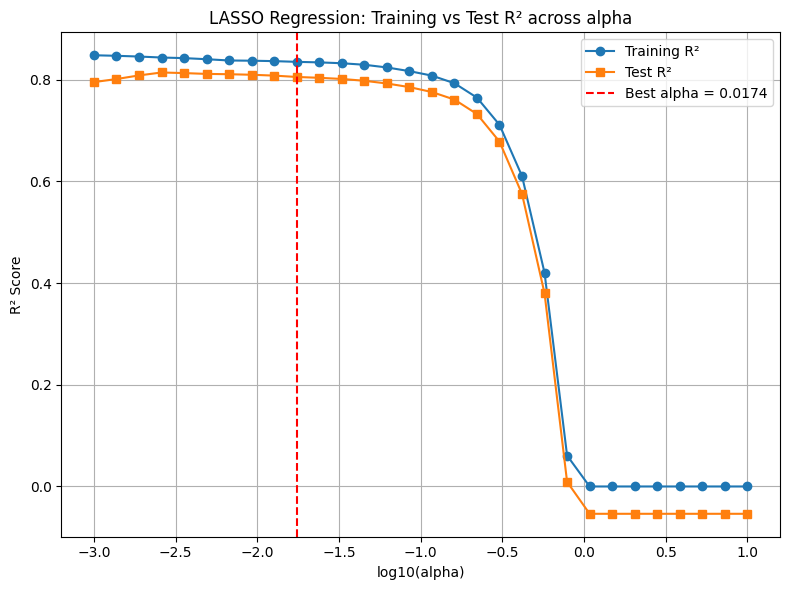

- MLL (adaptive σ): -2.2414

Test set performance:
- MAE:  0.23 L
- MSE:  0.11 L²
- RMSE: 0.33 L
- R²:   0.805

Training set performance:
- MAE:  0.25 L
- MSE:  0.13 L²
- RMSE: 0.37 L
- R²:   0.835

Model coefficients (sorted by |coef|):
                                              Feature  Coefficient
6                               Baseline FVC Volume L     0.719149
1            original_shape_MinorAxisLength_left_lung     0.064554
8                                                 Age    -0.058268
2   original_gldm_SmallDependenceHighGrayLevelEmph...    -0.027805
0       wavelet-LLL_glszm_GrayLevelVariance_left_lung    -0.014197
3   original_glszm_LargeAreaLowGrayLevelEmphasis_l...     0.005466
4   log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_lef...    -0.002587
5   log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGr...     0.000000
7                                       FEV1 Volume L     0.000000
9                                            Sex_Male     0.000000
10                       

/tmp/ipykernel_921250/714975100.py:245: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


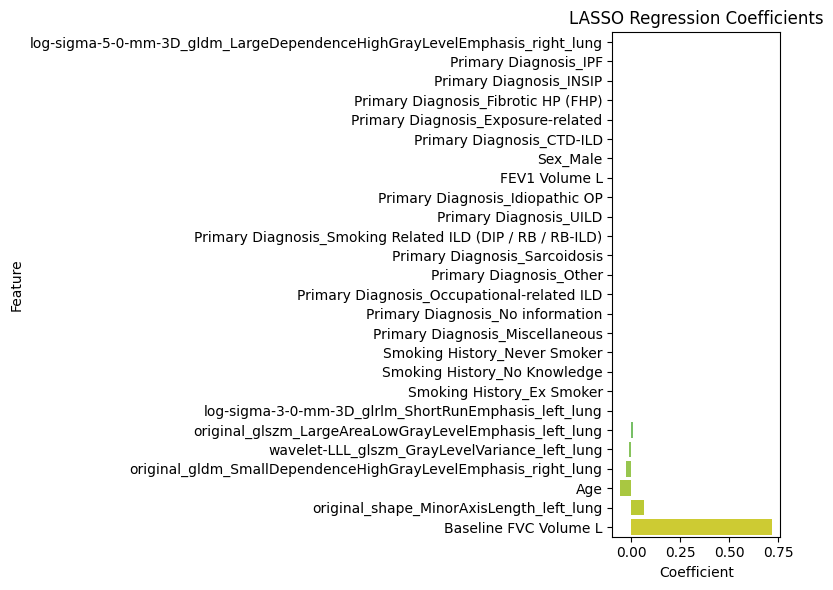

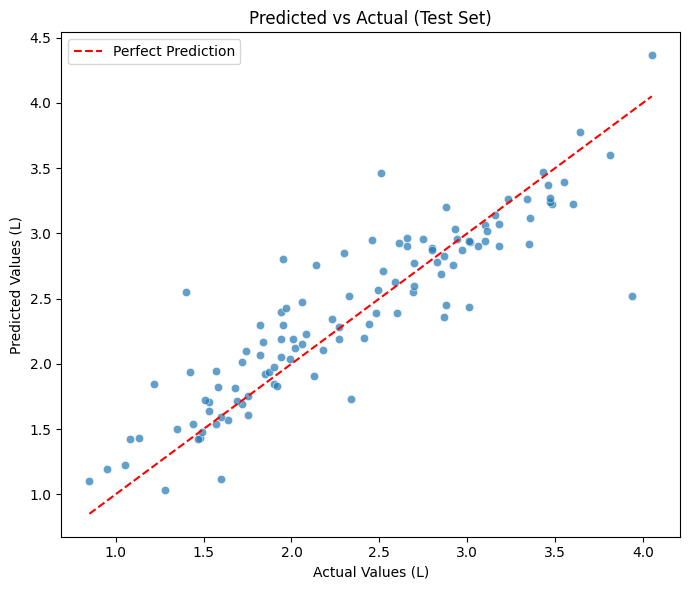

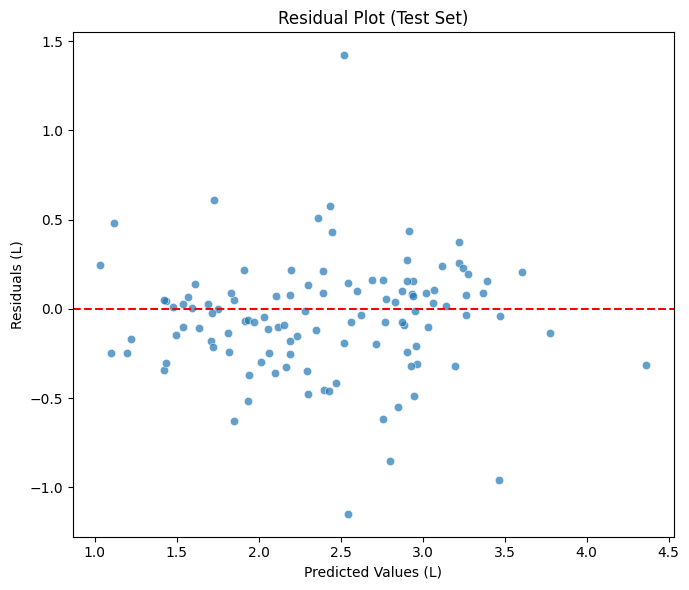


Top 5 patients with largest errors:
         Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  \
1001085          2.50        3.94       2.519439   1.420561   
1000875          2.81        1.40       2.547991   1.147991   
545418           3.63        2.51       3.466088   0.956088   
1000900          2.98        1.95       2.804024   0.854024   
1001175          1.98        1.22       1.847800   0.627800   

         Baseline_FVC_Week  Followup_FVC_Week  
1001085                0.0               48.0  
1000875                0.0               54.0  
545418                 0.0               53.0  
1000900                0.0               52.0  
1001175                0.0               54.0  


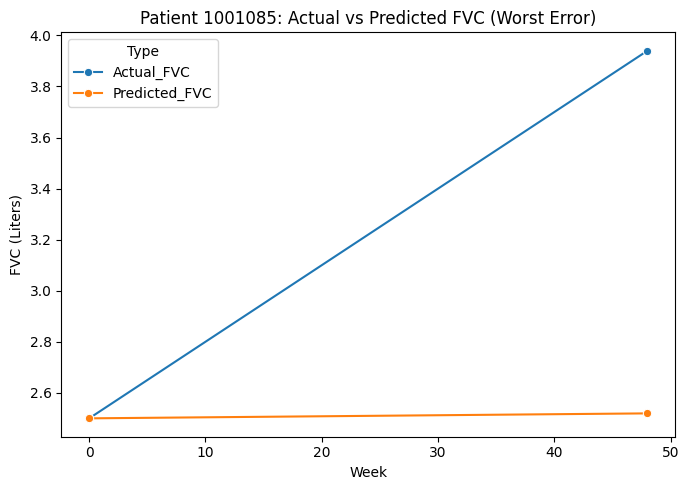

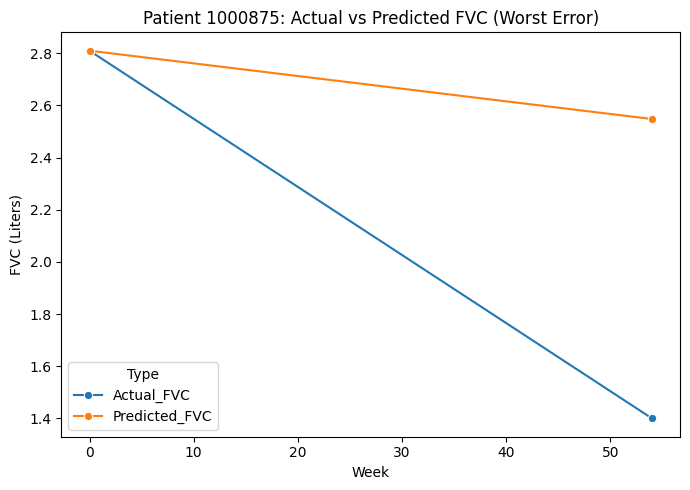

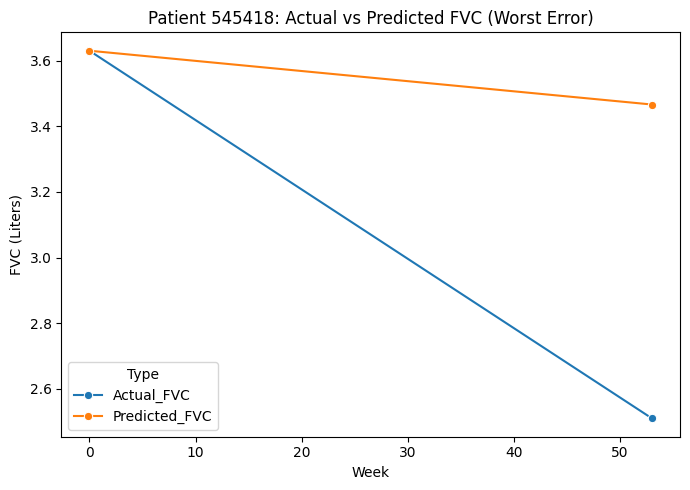

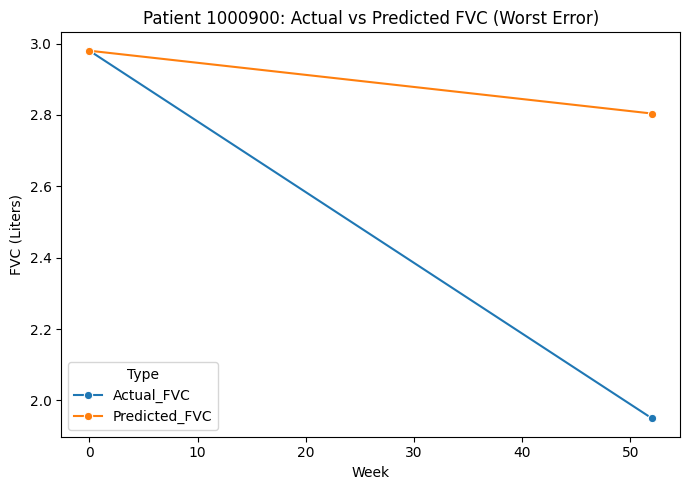

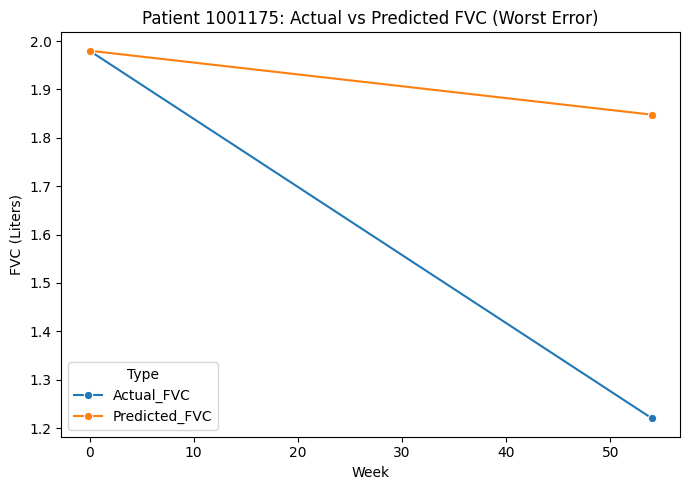


Top 5 patients with increasing FVC and lowest error:
         Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  \
1000616          1.73        1.75       1.750785   0.000785   
1001371          1.59        1.60       1.593778   0.006222   
1001253          1.43        1.49       1.477919   0.012081   
142332           1.67        1.69       1.713966   0.023966   
1000769          1.56        1.57       1.541414   0.028586   

         Baseline_FVC_Week  Followup_FVC_Week  
1000616                0.0               48.0  
1001371                0.0               50.0  
1001253                0.0               54.0  
142332                 0.0               50.0  
1000769                0.0               52.0  


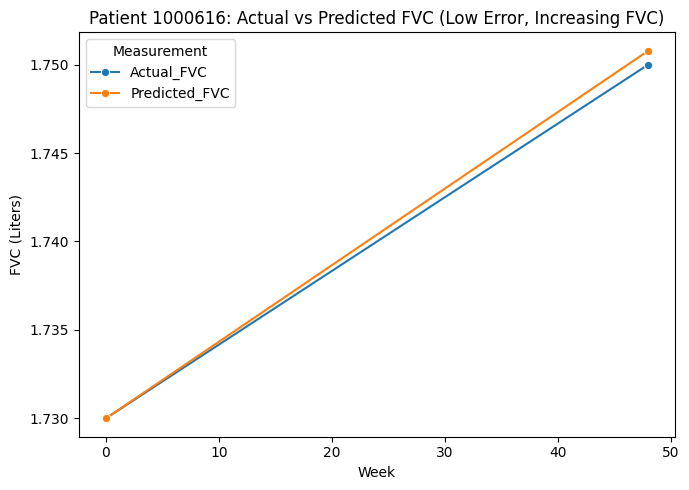

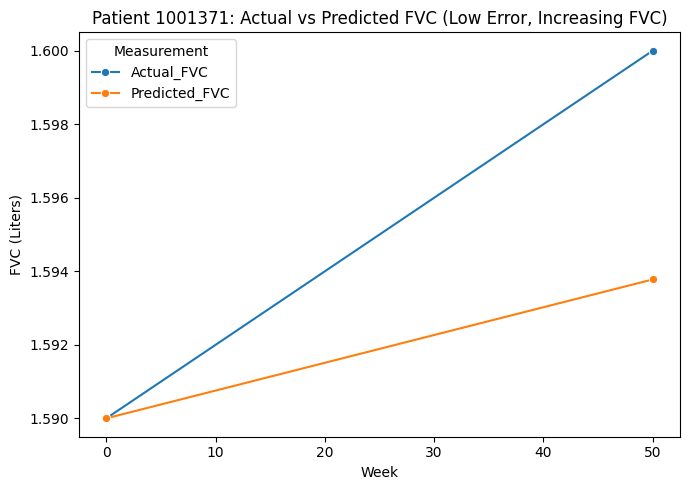

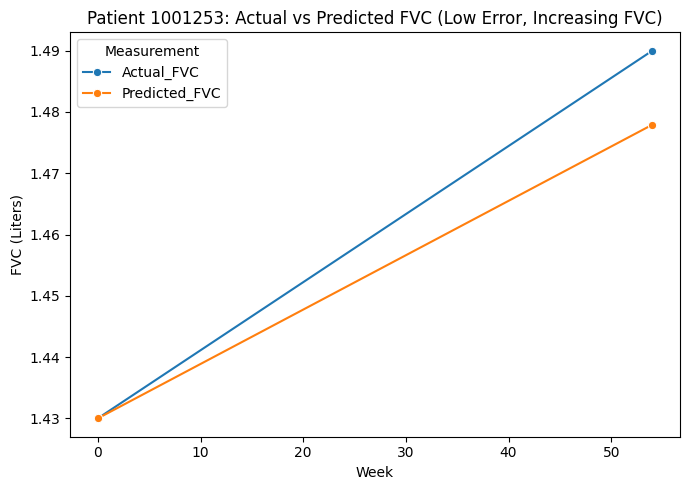

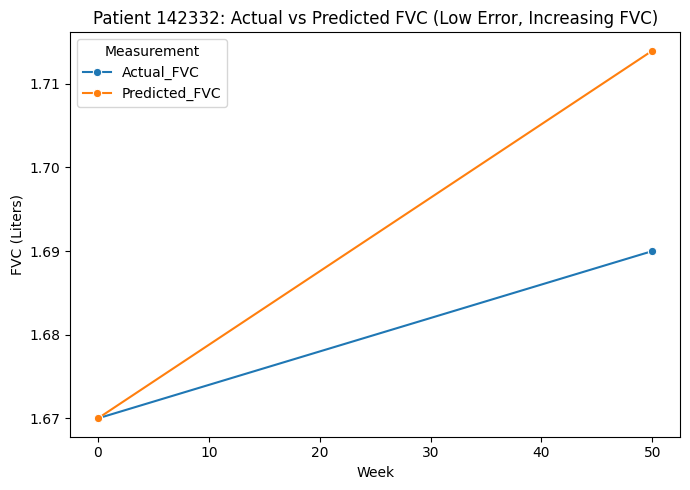

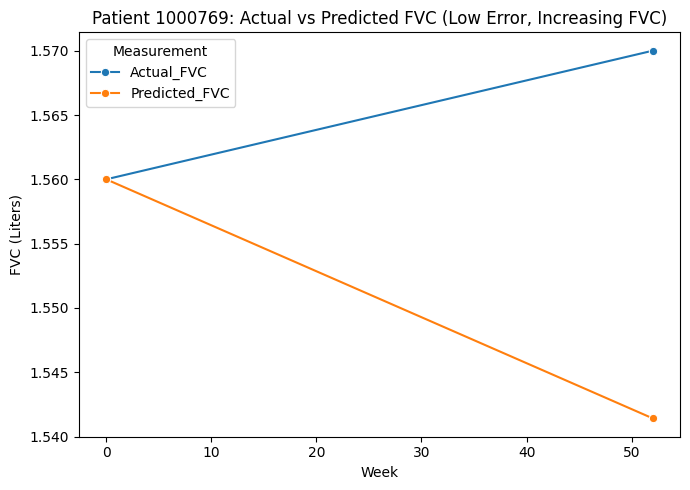

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


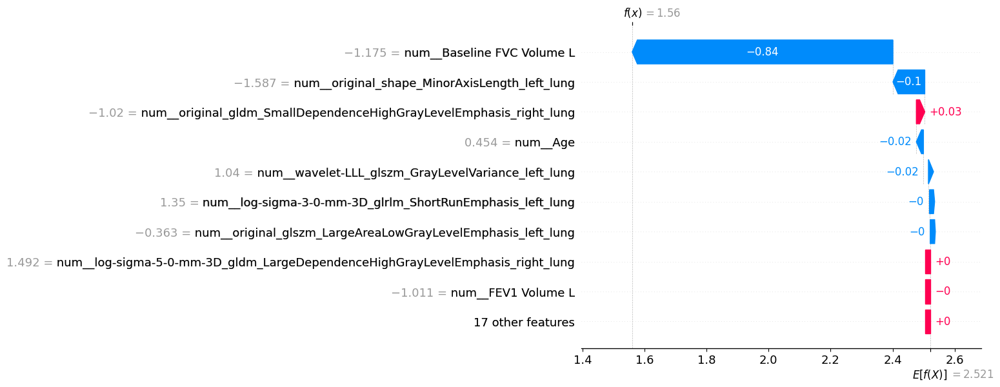

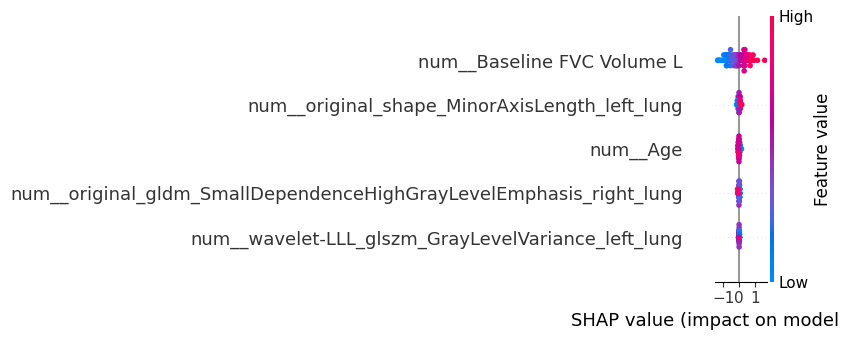

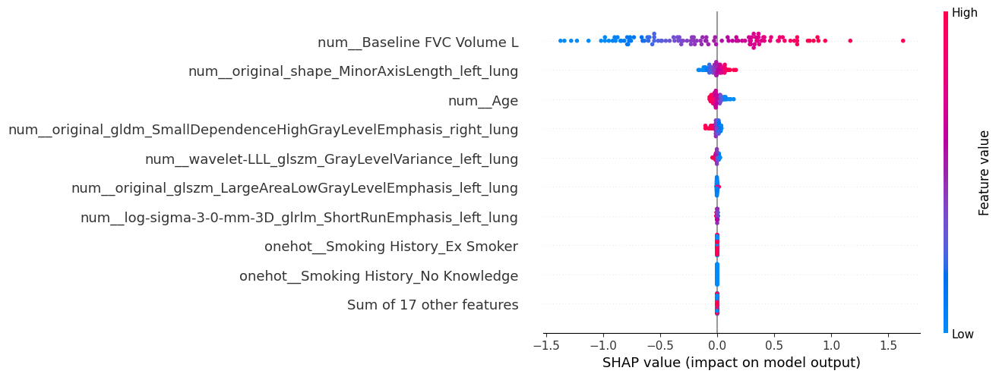

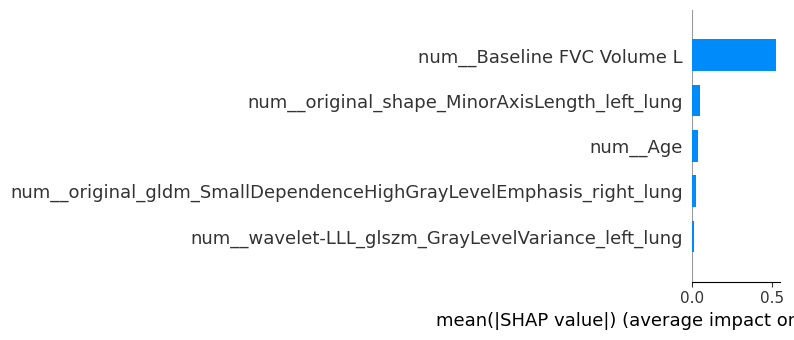

,Baseline FVC Week,Followup FVC Week
1001412,0,48.0
666514,0,53.0
1001024,0,48.0
261883,0,52.0
256868,0,53.0
...,...,...
1001082,0,53.0
1000561,0,48.0
311937,0,51.0
1000721,0,50.0


In [26]:
selected_features = ['wavelet-LLL_glszm_GrayLevelVariance_left_lung', 'original_shape_MinorAxisLength_left_lung', 'original_gldm_SmallDependenceHighGrayLevelEmphasis_right_lung', 'original_glszm_LargeAreaLowGrayLevelEmphasis_left_lung', 'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung']

Clinical_Contineous_data_ext = selected_features + Clinical_Contineous_data
print(Clinical_Contineous_data_ext)
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_with_clinical_harmonization.pkl")
X_train_clini_log = X_train.copy()
X_test_clini_log  = X_test.copy()

# Transform Age
for col in ['Age']:
    X_train_clini_log[col] = np.log(X_train_clini_log[col])
    X_test_clini_log[col] = np.log(X_test_clini_log[col])

# Median imputation (only needed if missing values exist)
imp_median = SimpleImputer(strategy='median')
imp_median.fit(X_train_clini_log)

X_train_median_filled = pd.DataFrame(
    imp_median.transform(X_train_clini_log),
    columns=X_train_clini_log.columns,
    index=X_train_clini_log.index
)

X_test_median_filled = pd.DataFrame(
    imp_median.transform(X_test_clini_log),
    columns=X_test_clini_log.columns,
    index=X_test_clini_log.index
)
# Run experiments
results1 = train_and_evaluate_lasso(X_train_median_filled, X_test_median_filled, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data, model_name="/home/pansurya/OSIC_thesis/LASSO_model/PAM_mrmr_VIF_LASSO_with_harmonizationPycombat.pkl")
# print("Running LOOCV experiment...")
# results1 = train_and_evaluate_with_LOOCV(X_train, X_test, y_train, y_test, selected_features, model_name="/home/pansurya/OSIC_thesis/Linear_model/PAM_ANOVA_VIF_LOOCV.pkl")
X_train[['Baseline FVC Week', 'Followup FVC Week']]

['original_firstorder_Kurtosis_right_lung', 'log-sigma-4-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_left_lung', 'wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung', 'wavelet-LLL_glrlm_RunLengthNonUniformity_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Busyness_left_lung', 'log-sigma-1-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_lung', 'log-sigma-3-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_glrlm_GrayLevelNonUniformity_left_lung', 'original_firstorder_MeanAbsoluteDeviation_right_lung', 'wavelet-LHL_glrlm_GrayLevelNonUniformity_left_lung', 'log-sigma-4-0-mm-3D_glszm_GrayLevelNonUniformity_right_lung', 'log-sigma-2-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung', 'original_glrlm_GrayLevelNonUniformity_right_lung', 'original_firstorder_90Percentile_right_lung', 'log-sigma-5-0-mm-3D_firstorder_Energy_left_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung

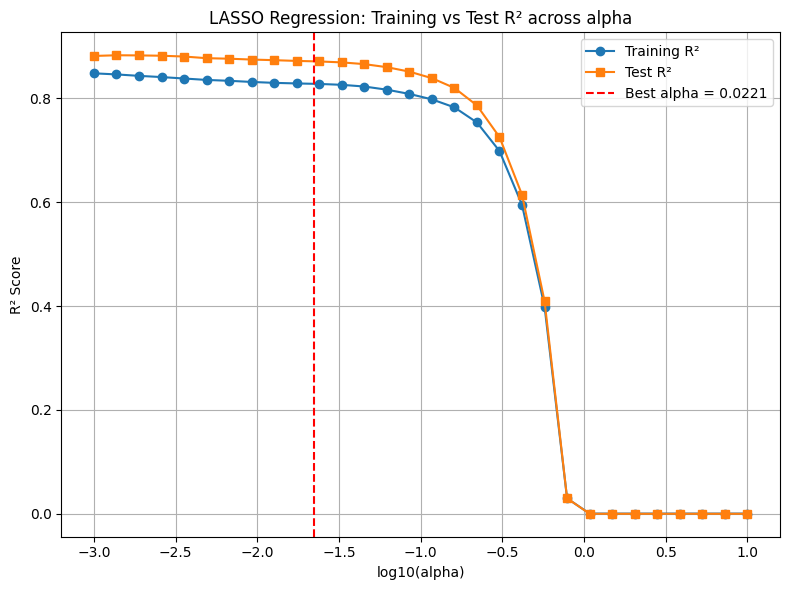

- MLL (adaptive σ): -1.9525

Test set performance:
- MAE:  0.21 L
- MSE:  0.09 L²
- RMSE: 0.30 L
- R²:   0.872

Training set performance:
- MAE:  0.25 L
- MSE:  0.14 L²
- RMSE: 0.37 L
- R²:   0.828

Model coefficients (sorted by |coef|):
                                              Feature  Coefficient
30                              Baseline FVC Volume L     0.704271
22           original_shape_MinorAxisLength_left_lung     0.059981
31                                                Age    -0.052929
12  log-sigma-2-0-mm-3D_glrlm_LongRunHighGrayLevel...     0.021666
23      log-sigma-2-0-mm-3D_ngtdm_Busyness_right_lung     0.012625
9   original_firstorder_MeanAbsoluteDeviation_righ...    -0.011163
4        log-sigma-2-0-mm-3D_ngtdm_Busyness_left_lung     0.010806
0             original_firstorder_Kurtosis_right_lung     0.000000
1   log-sigma-4-0-mm-3D_glszm_LargeAreaHighGrayLev...    -0.000000
3   wavelet-LLL_glrlm_RunLengthNonUniformity_right...    -0.000000
8   log-sigma-1-0-mm-3D_g

/tmp/ipykernel_3849327/1886070794.py:244: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


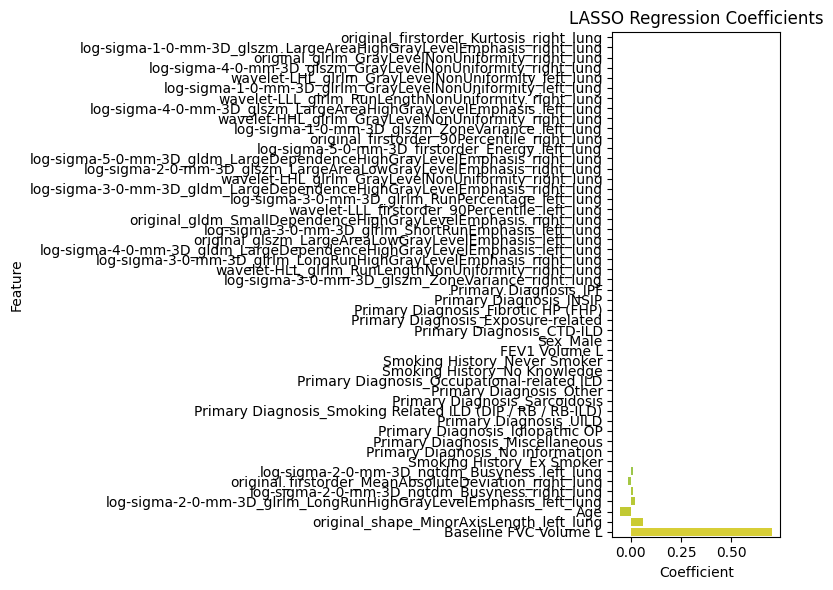

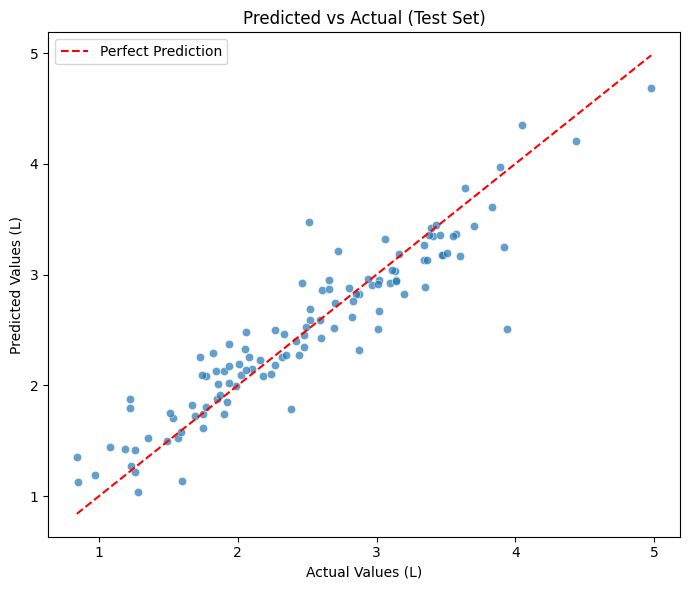

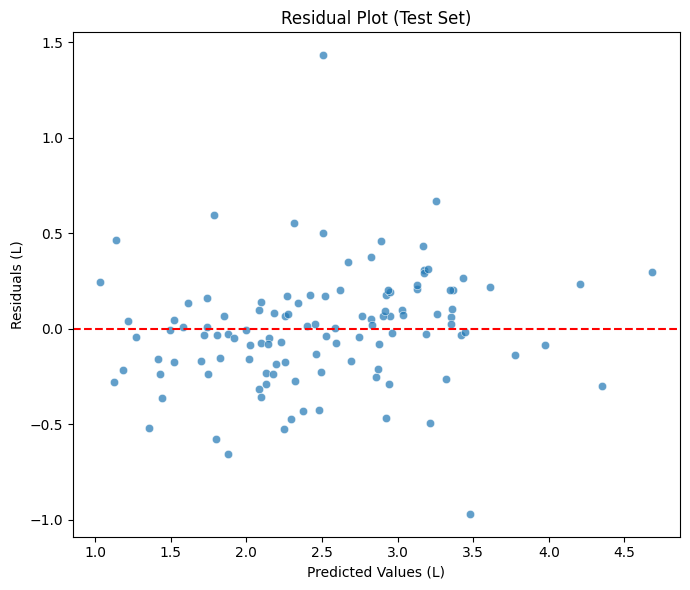


Top 5 patients with largest errors:
         Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  \
1000934          2.50        3.94       2.509114   1.430886   
545418           3.63        2.51       3.477855   0.967855   
1001223          3.46        3.92       3.251483   0.668517   
1001175          1.98        1.22       1.876545   0.656545   
1001225          1.80        2.38       1.785018   0.594982   

         Baseline_FVC_Week  Followup_FVC_Week  
1000934                0.0               52.0  
545418                 0.0               53.0  
1001223                0.0               48.0  
1001175                0.0               54.0  
1001225                0.0               50.0  


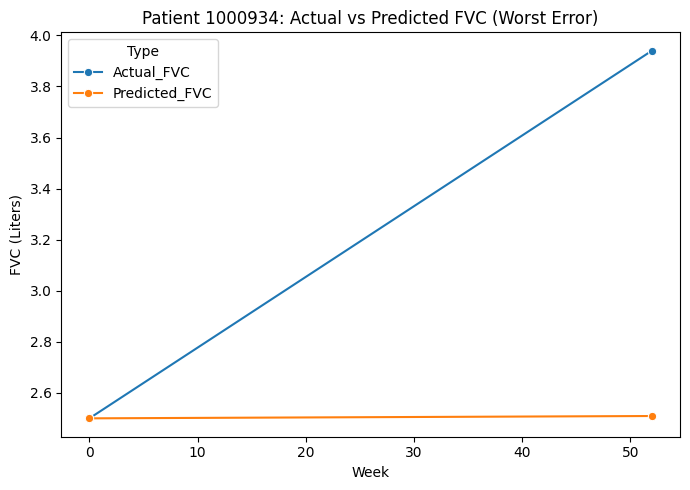

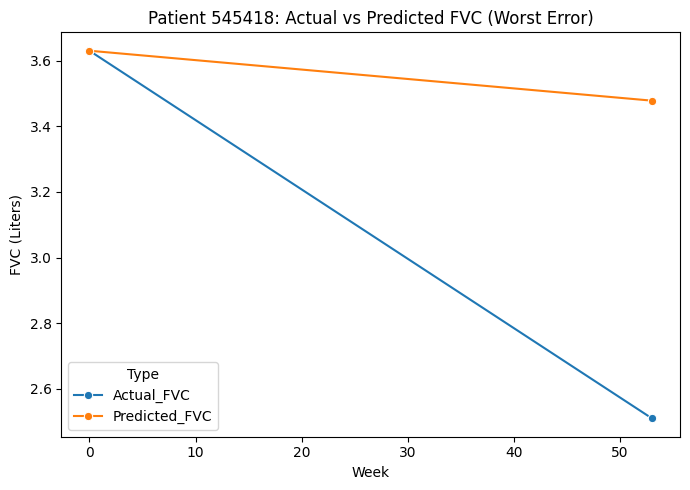

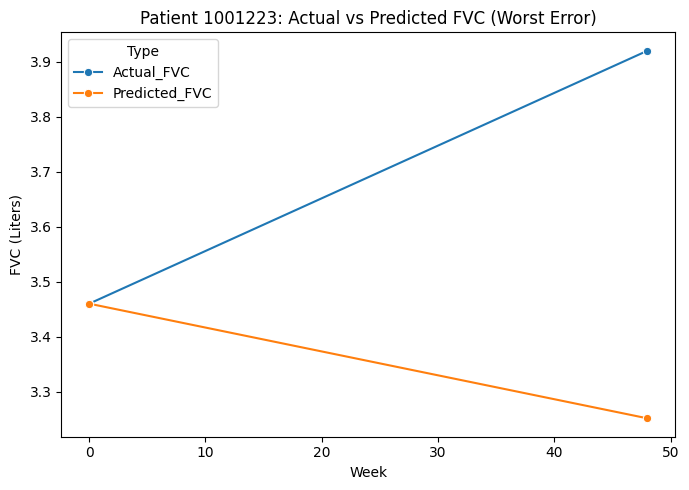

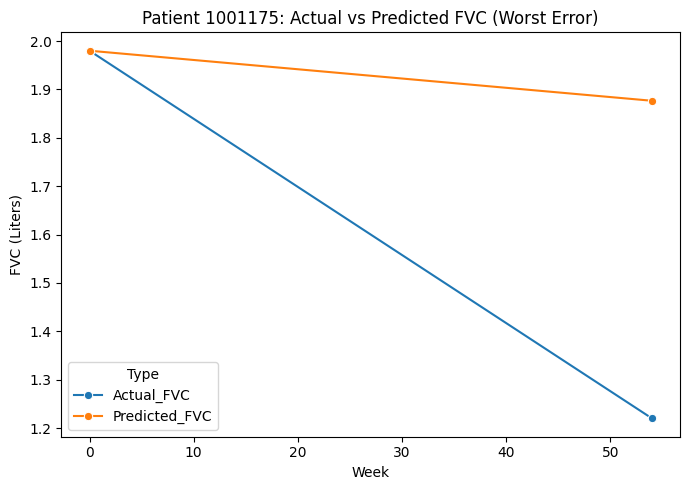

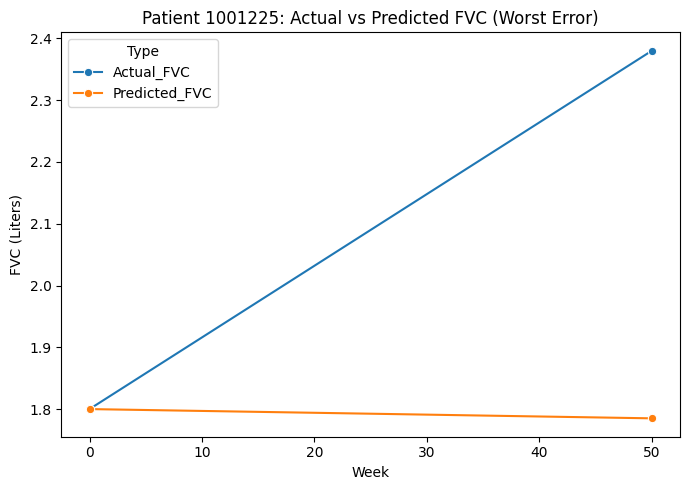


Top 5 patients with increasing FVC and lowest error:
         Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  \
1001253          1.43        1.49       1.494980   0.004980   
1000616          1.73        1.75       1.738971   0.011029   
1001370          2.32        2.42       2.404490   0.015510   
241232           2.79        2.85       2.828198   0.021802   
142332           1.67        1.69       1.722537   0.032537   

         Baseline_FVC_Week  Followup_FVC_Week  
1001253                0.0               54.0  
1000616                0.0               48.0  
1001370                0.0               49.0  
241232                 0.0               49.0  
142332                 0.0               50.0  


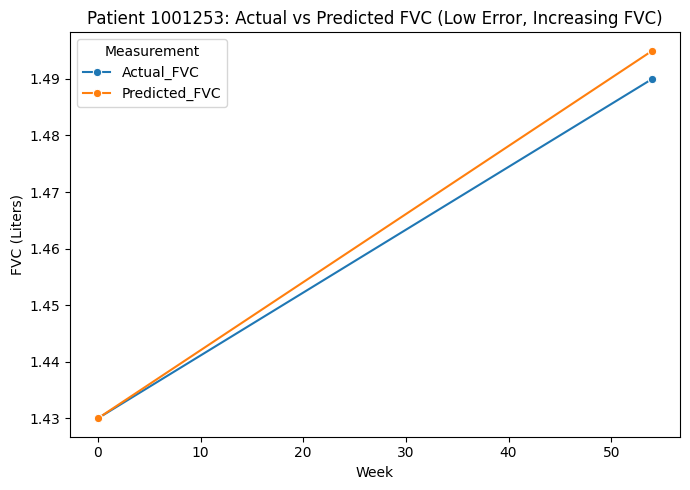

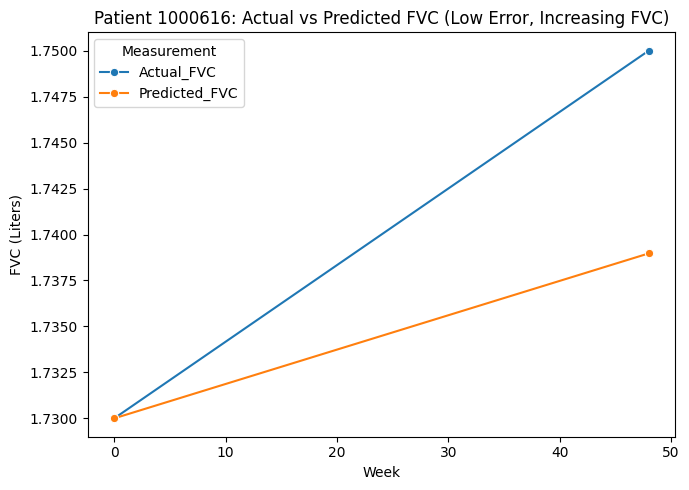

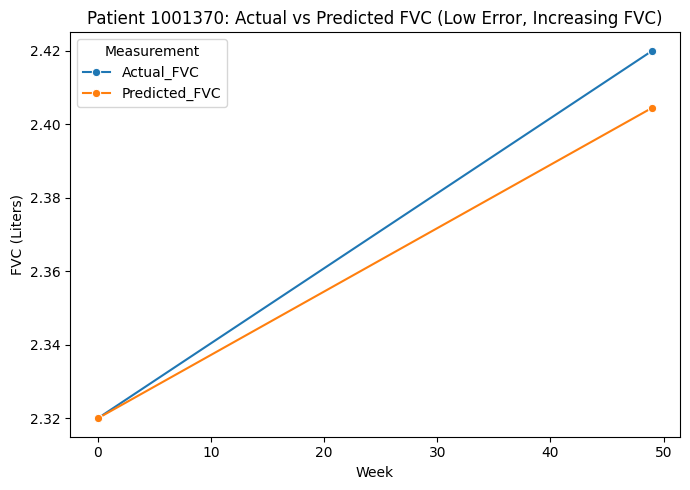

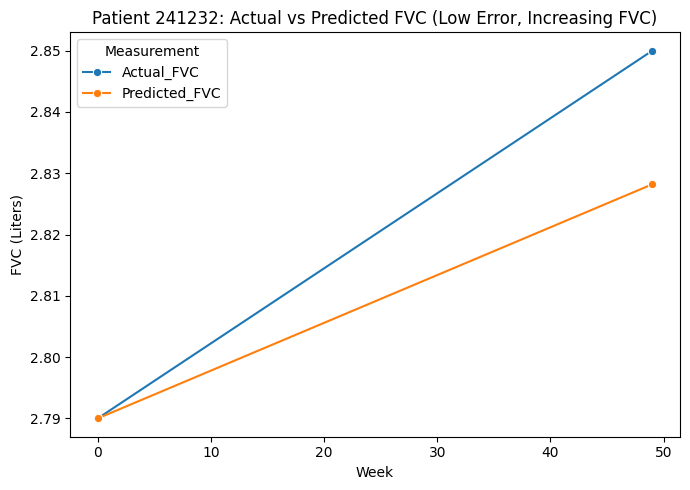

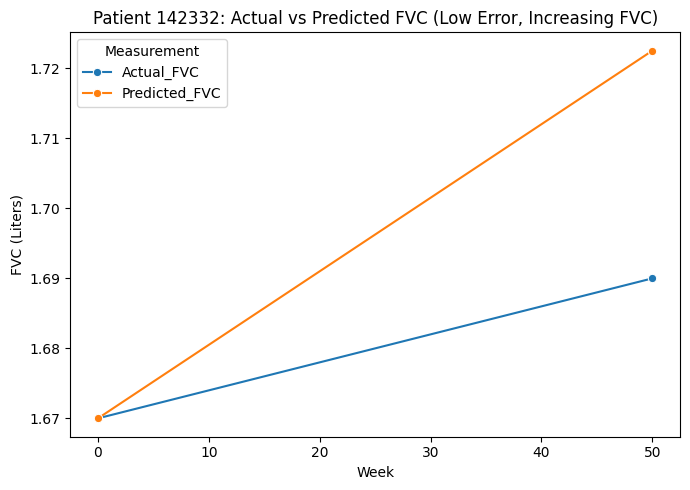

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


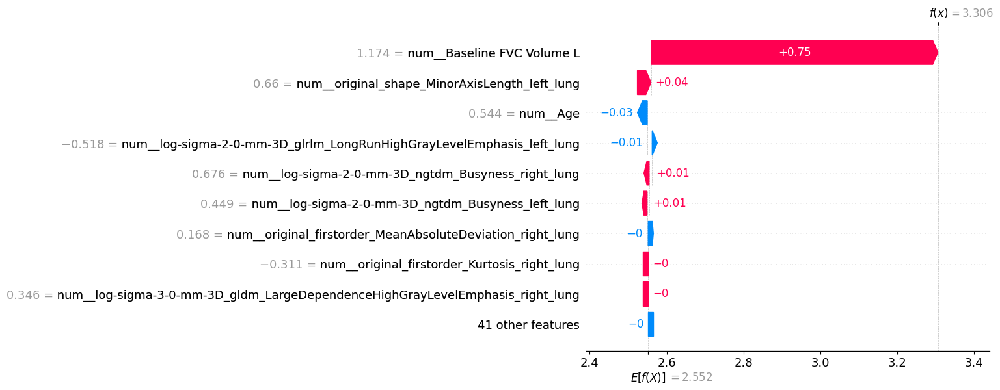

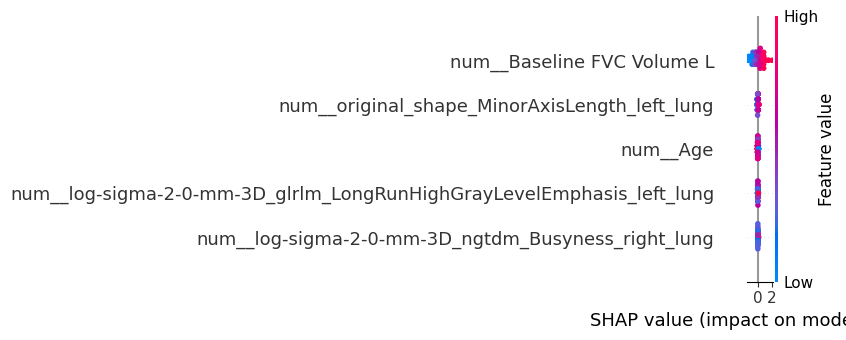

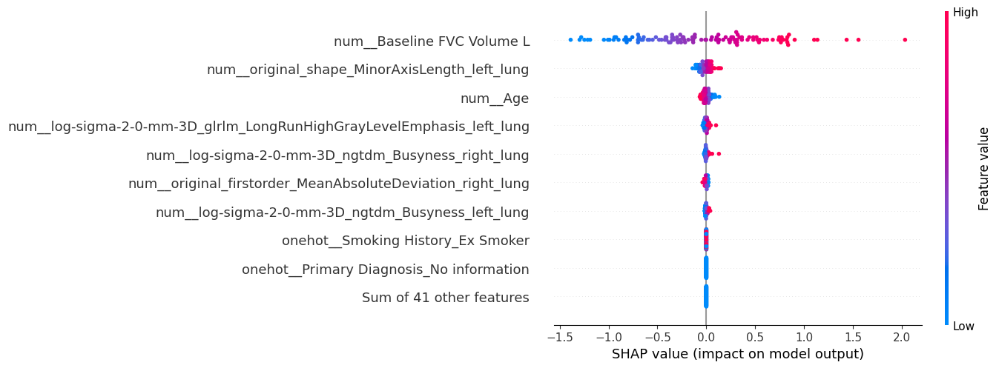

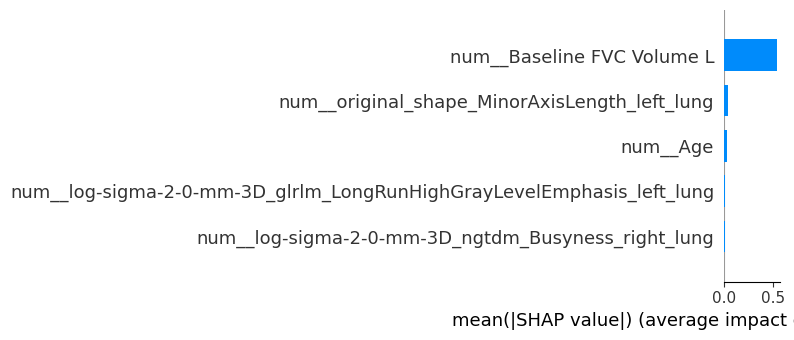

In [5]:
#tested, not good method
selected_features = ['original_firstorder_Kurtosis_right_lung',
       'log-sigma-4-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_left_lung',
       'wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung',
       'wavelet-LLL_glrlm_RunLengthNonUniformity_right_lung',
       'log-sigma-2-0-mm-3D_ngtdm_Busyness_left_lung',
       'log-sigma-1-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_right_lung',
       'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_lung',
       'log-sigma-3-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung',
       'log-sigma-1-0-mm-3D_glrlm_GrayLevelNonUniformity_left_lung',
       'original_firstorder_MeanAbsoluteDeviation_right_lung',
       'wavelet-LHL_glrlm_GrayLevelNonUniformity_left_lung',
       'log-sigma-4-0-mm-3D_glszm_GrayLevelNonUniformity_right_lung',
       'log-sigma-2-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung',
       'original_glrlm_GrayLevelNonUniformity_right_lung',
       'original_firstorder_90Percentile_right_lung',
       'log-sigma-5-0-mm-3D_firstorder_Energy_left_lung',
       'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung',
       'log-sigma-2-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung',
       'log-sigma-3-0-mm-3D_glrlm_RunPercentage_left_lung',
       'wavelet-LLL_firstorder_90Percentile_left_lung',
       'wavelet-HLL_glrlm_RunLengthNonUniformity_right_lung',
       'log-sigma-1-0-mm-3D_glszm_ZoneVariance_left_lung',
       'original_shape_MinorAxisLength_left_lung',
       'log-sigma-2-0-mm-3D_ngtdm_Busyness_right_lung',
       'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung',
       'original_gldm_SmallDependenceHighGrayLevelEmphasis_right_lung',
       'original_glszm_LargeAreaLowGrayLevelEmphasis_left_lung',
       'log-sigma-4-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung',
       'log-sigma-3-0-mm-3D_glszm_ZoneVariance_right_lung',
       'log-sigma-3-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung']
Clinical_Contineous_data_ext = selected_features + Clinical_Contineous_data
print(Clinical_Contineous_data_ext)
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_with_clinical_harmonization.pkl")
X_train_clini_log = X_train.copy()
X_test_clini_log  = X_test.copy()

# Transform Age
for col in ['Age']:
    X_train_clini_log[col] = np.log(X_train_clini_log[col])
    X_test_clini_log[col] = np.log(X_test_clini_log[col])

# Median imputation (only needed if missing values exist)
imp_median = SimpleImputer(strategy='median')
imp_median.fit(X_train_clini_log)

X_train_median_filled = pd.DataFrame(
    imp_median.transform(X_train_clini_log),
    columns=X_train_clini_log.columns,
    index=X_train_clini_log.index
)

X_test_median_filled = pd.DataFrame(
    imp_median.transform(X_test_clini_log),
    columns=X_test_clini_log.columns,
    index=X_test_clini_log.index
)


# Run experiments
results1 = train_and_evaluate_lasso(X_train_median_filled, X_test_median_filled, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data, model_name="/home/pansurya/OSIC_thesis/LASSO_model/PAM_ANOVA_VIF_LASSO_with_harmonizationPycombat.pkl")


['original_shape_MinorAxisLength_right_lung', 'original_shape_SurfaceArea_left_lung', 'wavelet-LLL_ngtdm_Contrast_right_lung', 'original_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'wavelet-HLL_firstorder_Skewness_right_lung', 'wavelet-HHL_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'original_shape_MinorAxisLength_left_lung', 'log-sigma-1-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'Baseline FVC Volume L', 'Age', 'FEV1 Volume L']
Numeric features: ['original_shape_MinorAxisLength_right_lung', 'original_shape_SurfaceArea_left_lung', 'wavelet-LLL_ngtdm_Contrast_right_lung', 'original_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'wavelet-HLL_firstorder_Skewness_right_lung', 'wavelet-HHL_glszm_LargeArea

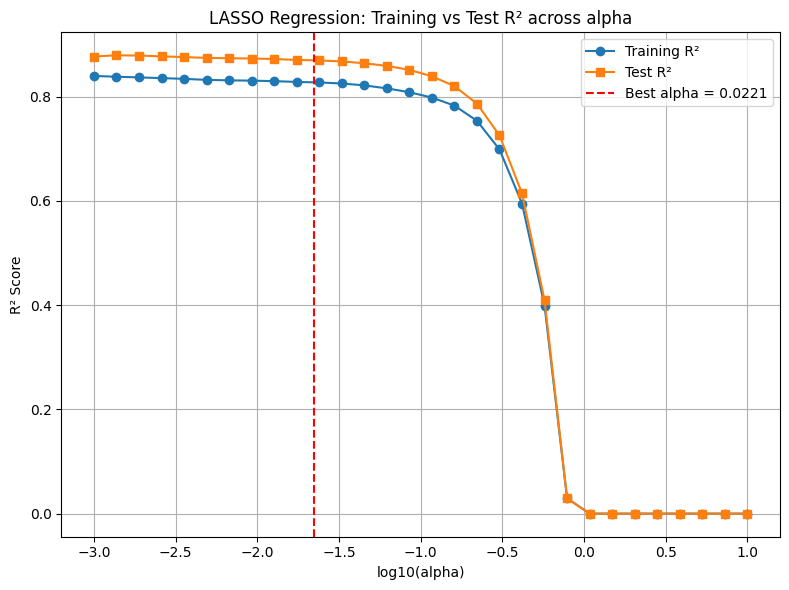

- MLL (adaptive σ): -1.9952

Test set performance:
- MAE:  0.22 L
- MSE:  0.09 L²
- RMSE: 0.30 L
- R²:   0.870

Training set performance:
- MAE:  0.25 L
- MSE:  0.14 L²
- RMSE: 0.37 L
- R²:   0.828

Model coefficients (sorted by |coef|):
                                              Feature  Coefficient
11                              Baseline FVC Volume L     0.704169
7            original_shape_MinorAxisLength_left_lung     0.061988
12                                                Age    -0.052317
2               wavelet-LLL_ngtdm_Contrast_right_lung    -0.033500
1                original_shape_SurfaceArea_left_lung     0.025298
3   original_glszm_LargeAreaLowGrayLevelEmphasis_r...     0.000000
0           original_shape_MinorAxisLength_right_lung     0.000000
6   wavelet-HHL_glszm_LargeAreaHighGrayLevelEmphas...     0.000000
5          wavelet-HLL_firstorder_Skewness_right_lung    -0.000000
4   original_gldm_LargeDependenceLowGrayLevelEmpha...     0.000000
8   log-sigma-1-0-mm-3D_g

/tmp/ipykernel_1615777/1886070794.py:244: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


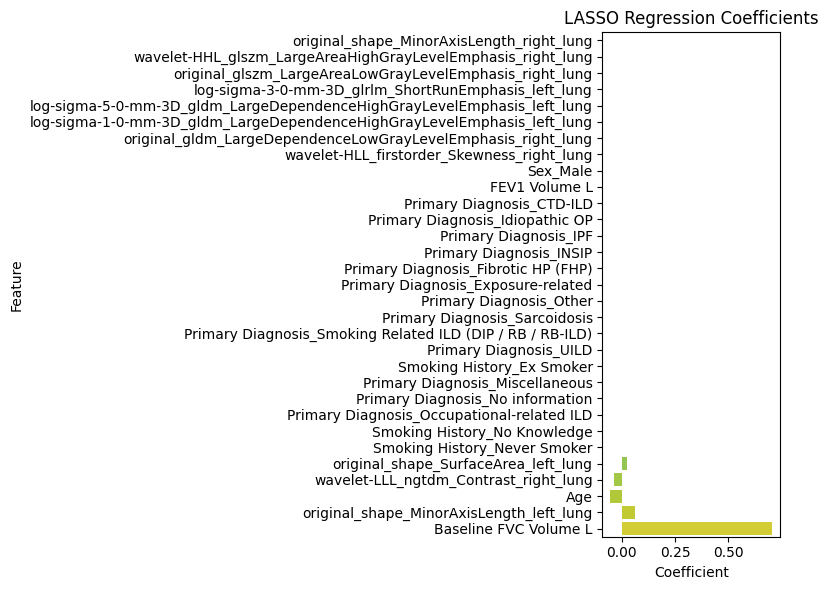

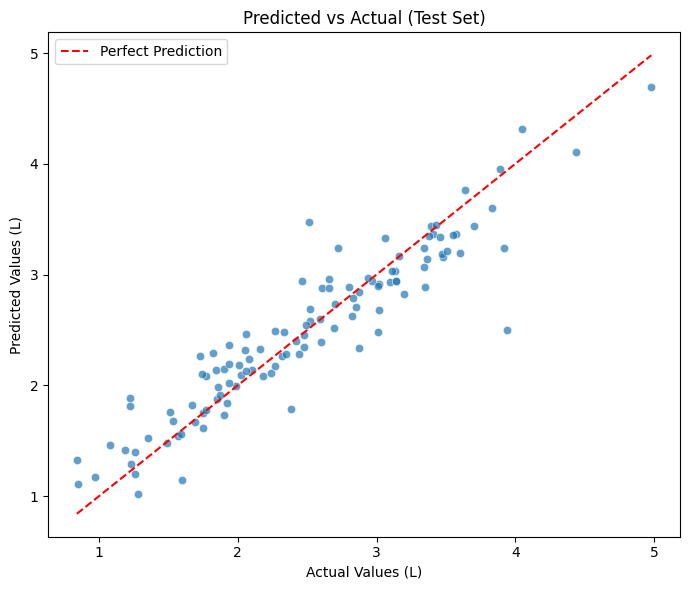

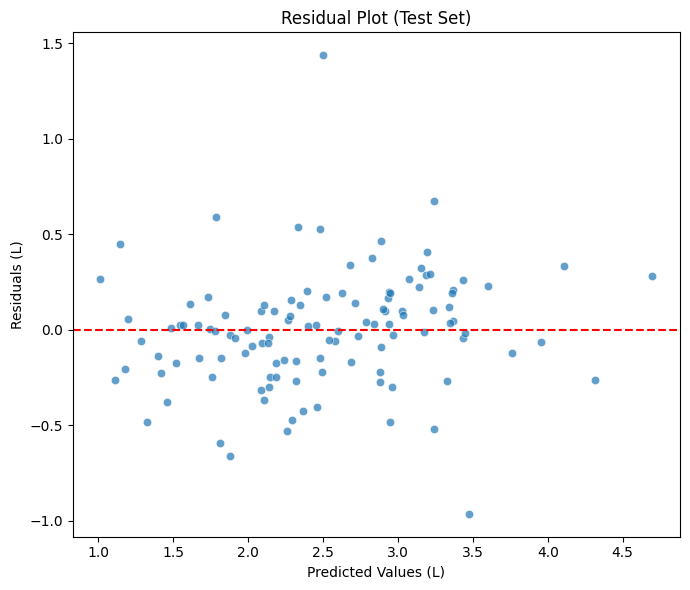


Top 5 patients with largest errors:
         Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  \
1000934          2.50        3.94       2.502020   1.437980   
545418           3.63        2.51       3.474477   0.964477   
1001223          3.46        3.92       3.243175   0.676825   
1001175          1.98        1.22       1.882686   0.662686   
347690           1.80        1.22       1.813641   0.593641   

         Baseline_FVC_Week  Followup_FVC_Week  
1000934                0.0               52.0  
545418                 0.0               53.0  
1001223                0.0               48.0  
1001175                0.0               54.0  
347690                 0.0               50.0  


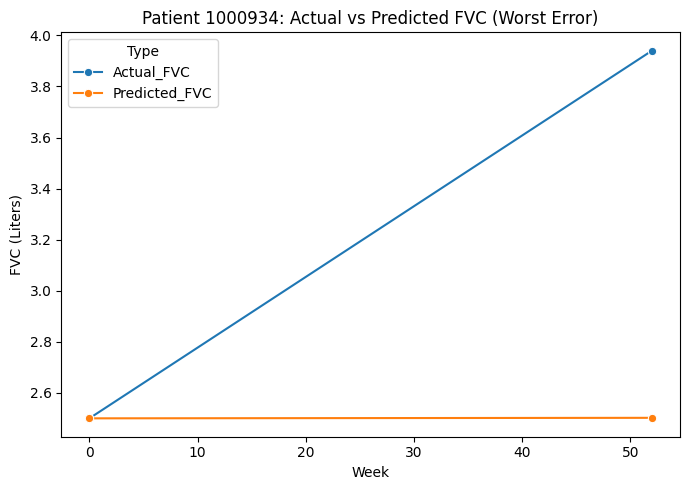

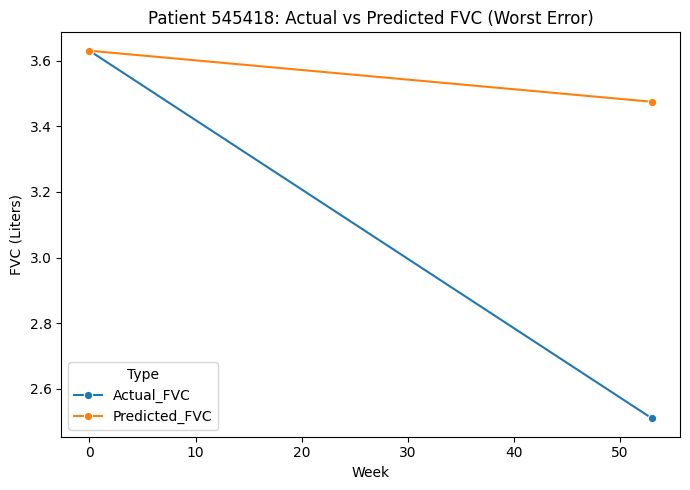

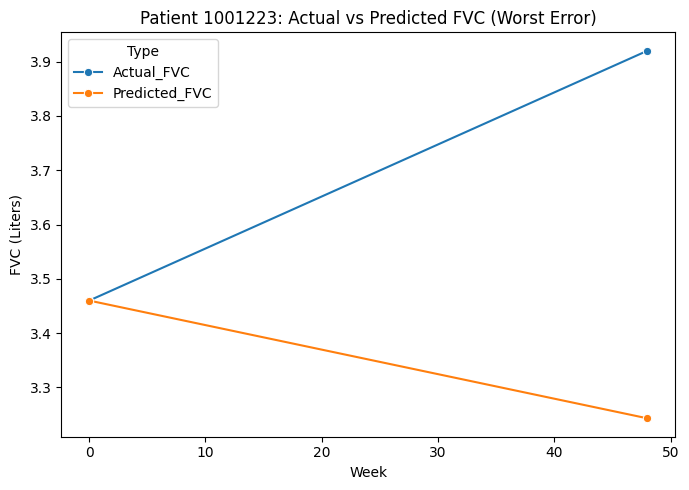

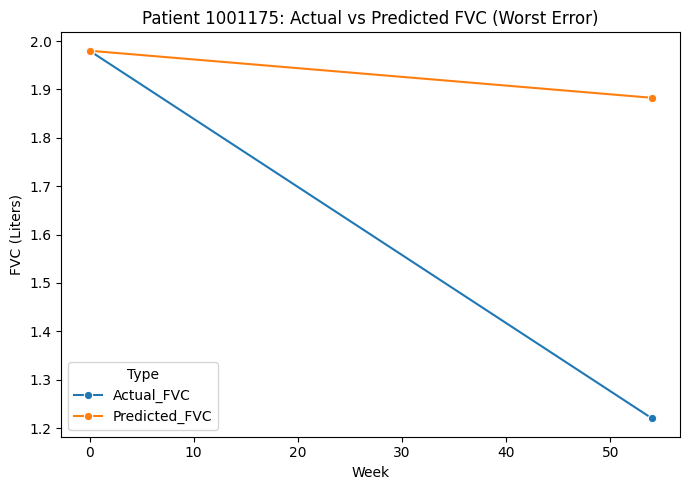

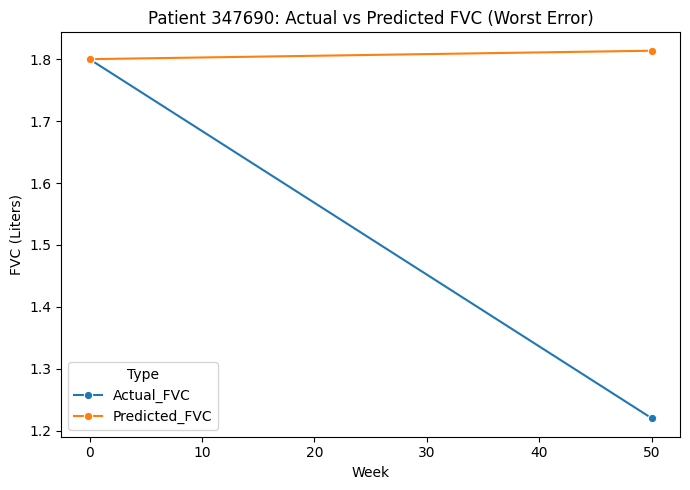


Top 5 patients with increasing FVC and lowest error:
         Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  \
1000616          1.73        1.75       1.745715   0.004285   
1001253          1.43        1.49       1.483549   0.006451   
1001370          2.32        2.42       2.401946   0.018054   
142332           1.67        1.69       1.667415   0.022585   
1000769          1.56        1.57       1.545402   0.024598   

         Baseline_FVC_Week  Followup_FVC_Week  
1000616                0.0               48.0  
1001253                0.0               54.0  
1001370                0.0               49.0  
142332                 0.0               50.0  
1000769                0.0               52.0  


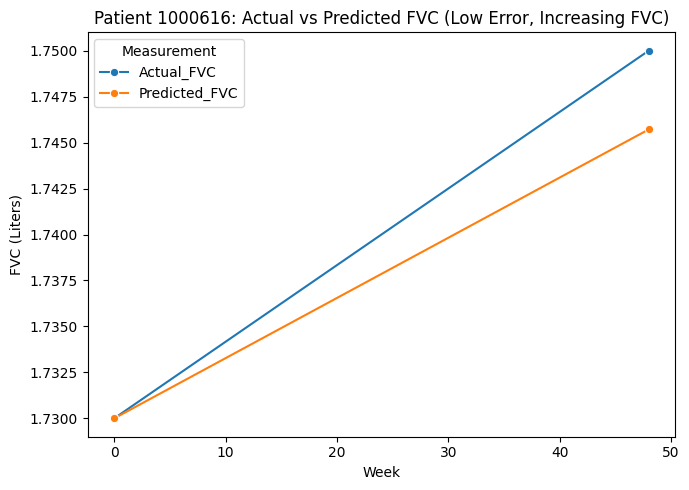

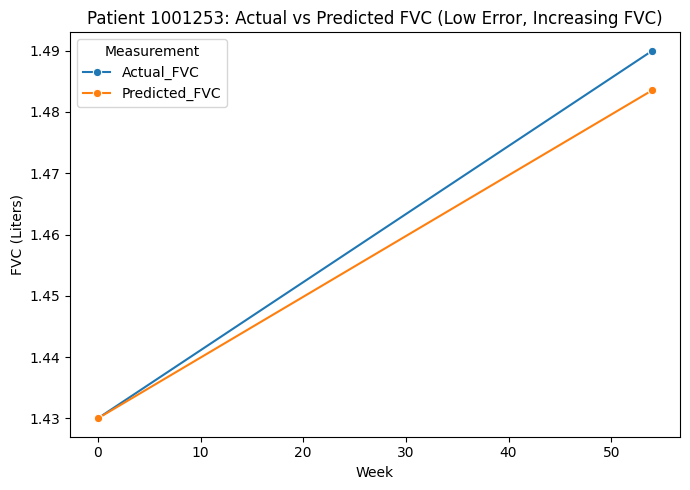

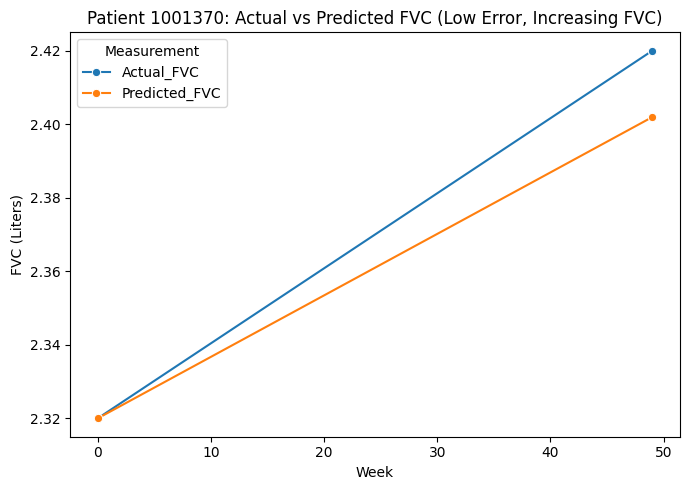

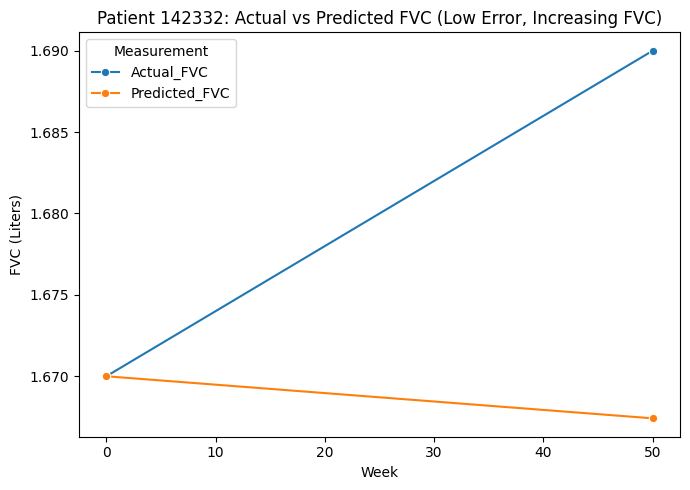

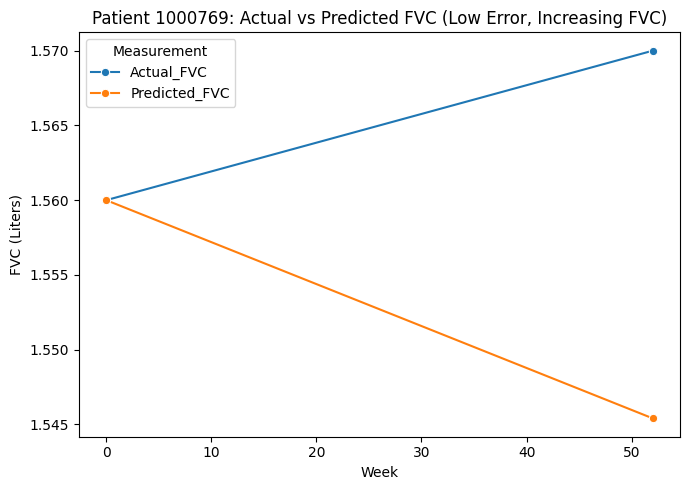

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


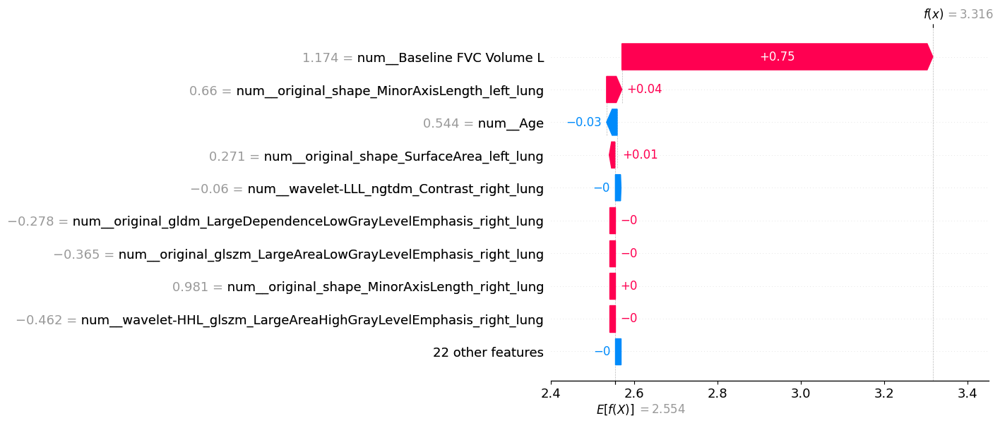

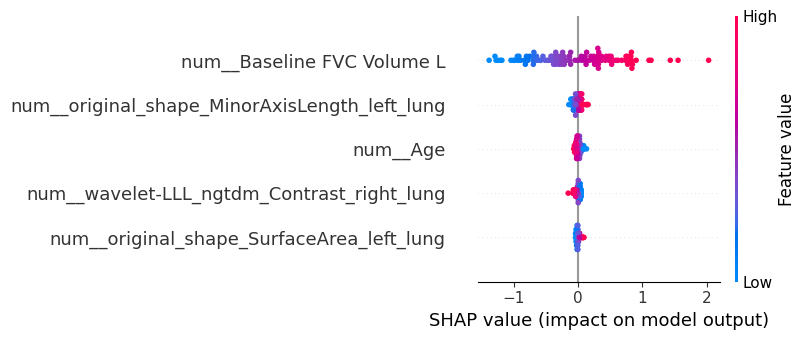

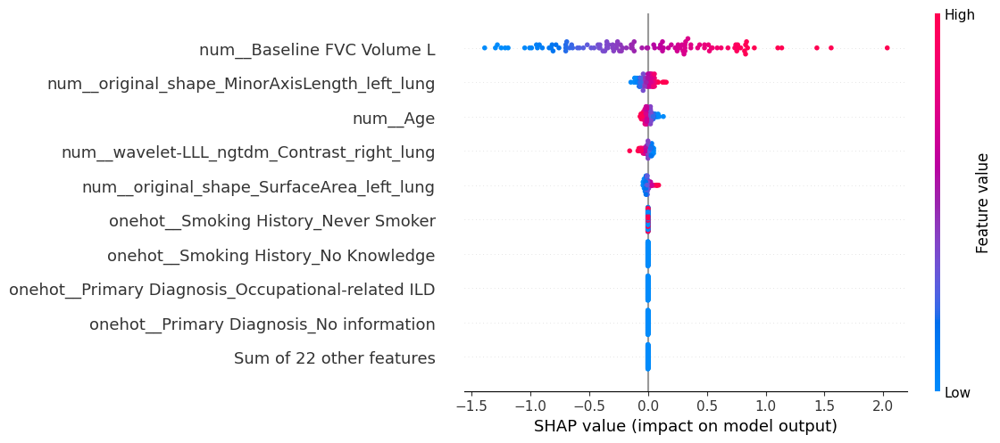

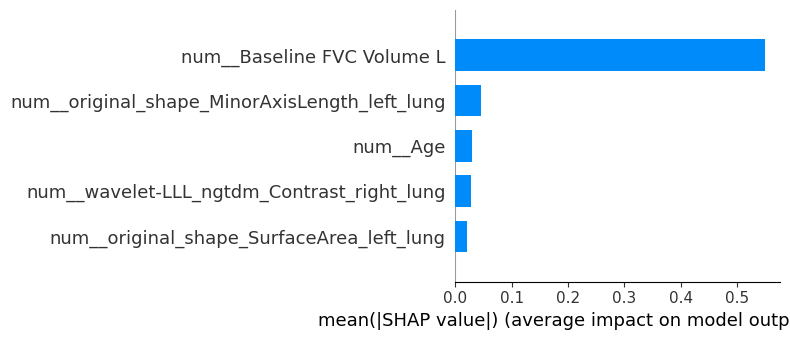

In [23]:
selected_features = ['original_shape_MinorAxisLength_right_lung', 'original_shape_SurfaceArea_left_lung', 'wavelet-LLL_ngtdm_Contrast_right_lung', 'original_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'wavelet-HLL_firstorder_Skewness_right_lung', 'wavelet-HHL_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'original_shape_MinorAxisLength_left_lung', 'log-sigma-1-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung']
Clinical_Contineous_data_ext = selected_features + Clinical_Contineous_data
print(Clinical_Contineous_data_ext)
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_with_clinical_harmonization.pkl")
X_train_clini_log = X_train.copy()
X_test_clini_log  = X_test.copy()

# Transform Age
for col in ['Age']:
    X_train_clini_log[col] = np.log(X_train_clini_log[col])
    X_test_clini_log[col] = np.log(X_test_clini_log[col])

# Median imputation (only needed if missing values exist)
imp_median = SimpleImputer(strategy='median')
imp_median.fit(X_train_clini_log)

X_train_median_filled = pd.DataFrame(
    imp_median.transform(X_train_clini_log),
    columns=X_train_clini_log.columns,
    index=X_train_clini_log.index
)

X_test_median_filled = pd.DataFrame(
    imp_median.transform(X_test_clini_log),
    columns=X_test_clini_log.columns,
    index=X_test_clini_log.index
)
results1 = train_and_evaluate_lasso(X_train_median_filled, X_test_median_filled, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data, model_name="/home/pansurya/OSIC_thesis/LASSO_model/Hierarchical_ANOVA_VIF_with_harmonizationPycombat.pkl")



['original_shape_MinorAxisLength_left_lung', 'wavelet-HHH_glcm_MCC_right_lung', 'wavelet-LLL_glszm_GrayLevelVariance_left_lung', 'original_shape_MinorAxisLength_right_lung', 'wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung', 'log-sigma-1-0-mm-3D_gldm_GrayLevelNonUniformity_left_lung', 'log-sigma-3-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Busyness_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Busyness_left_lung', 'original_firstorder_90Percentile_right_lung', 'log-sigma-3-0-mm-3D_glszm_ZoneVariance_right_lung', 'original_shape_SurfaceArea_left_lung', 'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_lung', 'original_glszm_SmallAreaHighGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_ngtdm_Busyness_right_lung', 'log-sigma-1-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'wavelet-LLH_glrlm_GrayLevelNonUniformity_right_lung', 'wavelet-LHL_firstorder_Kurtosis_right_lung', 'wavelet-LLL_glszm_GrayLevelNonUniformity_right_lung', 'original

MAE: [0.2771551299061792, 0.2743591664722955, 0.20682594482202585, 0.28140009870736127, 0.26248184837373756, 0.2996117387042534, 0.26287492684235386, 0.25084461069781083, 0.21424644916987481, 0.2620821434089108, 0.23837840115880135, 0.26074267406850615, 0.29691104711110583, 0.2950377831232046, 0.21253931764140005]
MSE: [0.15303870031825353, 0.16087007345632323, 0.08169927453823024, 0.16382779118160345, 0.16850132805363585, 0.1894093079652459, 0.1250865706296797, 0.14099414389463893, 0.11260173224919108, 0.14657379758606828, 0.09971012331401442, 0.1426529326939701, 0.22290798441368845, 0.16564950857638716, 0.09122267094197213]
RMSE: [0.3912016108328972, 0.401086117257034, 0.2858308495215837, 0.40475645909806485, 0.4104891326864036, 0.43521179667518883, 0.3536757987616338, 0.37549186927900174, 0.33556181583903594, 0.3828495756639522, 0.31576909809861764, 0.37769423174569416, 0.4721313211530119, 0.4070006247862369, 0.3020309105736897]
R2: [0.8143624758503563, 0.8176740474198212, 0.8811142

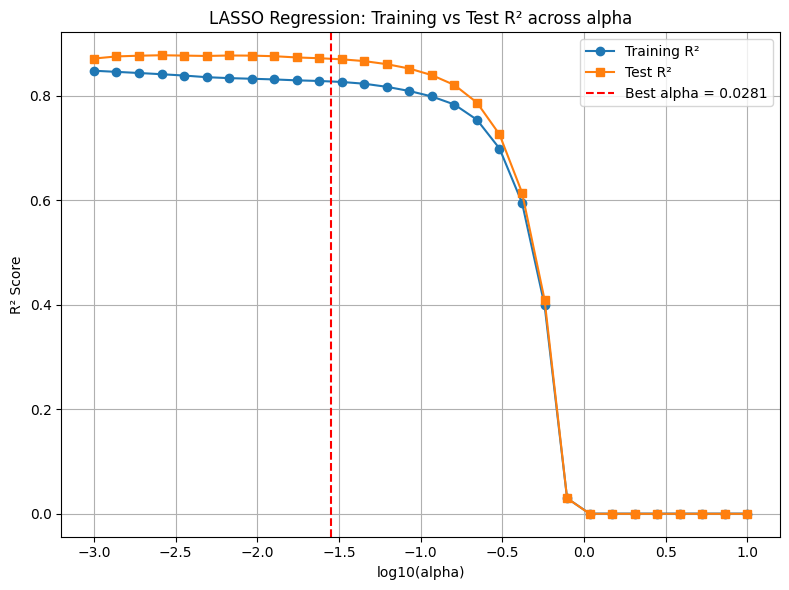

- MLL (adaptive σ): -1.9983

Test set performance:
- MAE:  0.22 L
- MSE:  0.09 L²
- RMSE: 0.30 L
- R²:   0.871

Training set performance:
- MAE:  0.25 L
- MSE:  0.14 L²
- RMSE: 0.37 L
- R²:   0.828

Model coefficients (sorted by |coef|):
                                              Feature  Coefficient
30                              Baseline FVC Volume L     0.703727
0            original_shape_MinorAxisLength_left_lung     0.061785
31                                                Age    -0.052570
28              wavelet-LLL_ngtdm_Contrast_right_lung    -0.025551
11               original_shape_SurfaceArea_left_lung     0.012038
7       log-sigma-2-0-mm-3D_ngtdm_Busyness_right_lung     0.011076
26  log-sigma-5-0-mm-3D_glrlm_LongRunHighGrayLevel...     0.006731
8        log-sigma-2-0-mm-3D_ngtdm_Busyness_left_lung     0.003276
2       wavelet-LLL_glszm_GrayLevelVariance_left_lung    -0.001116
1                     wavelet-HHH_glcm_MCC_right_lung    -0.000000
9         original_firsto

/tmp/ipykernel_1615777/1886070794.py:244: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


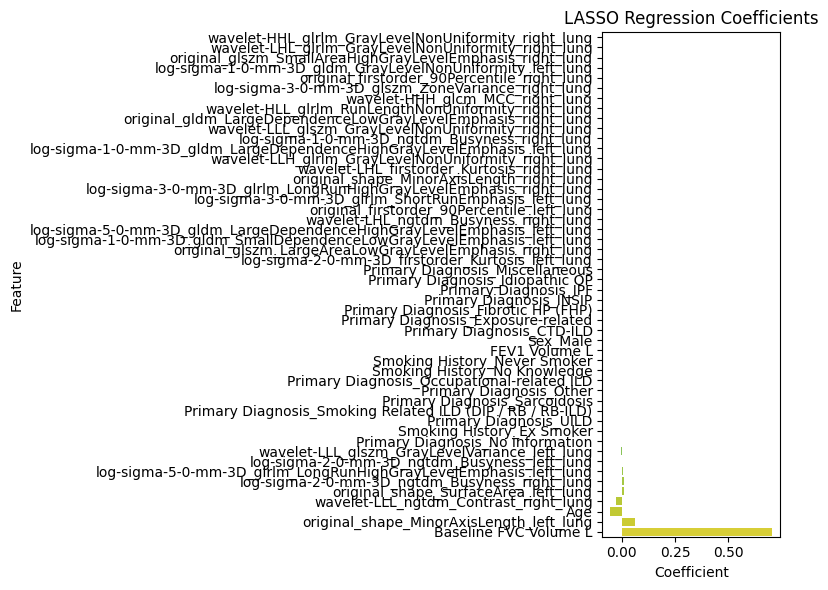

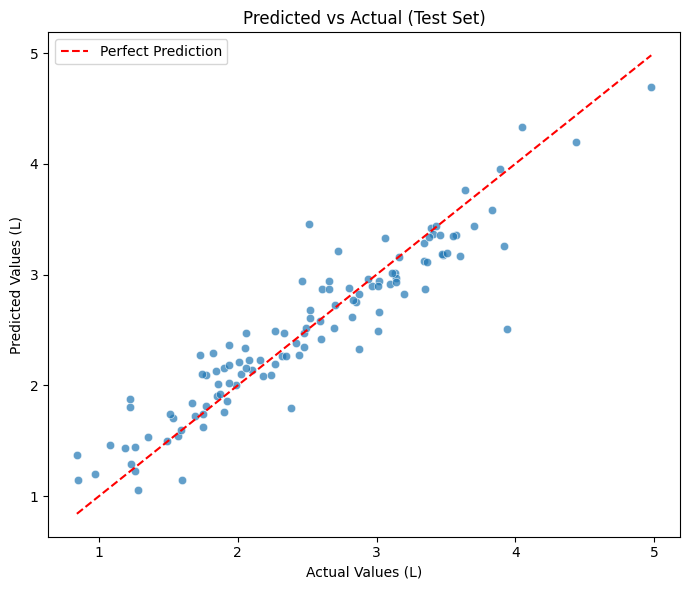

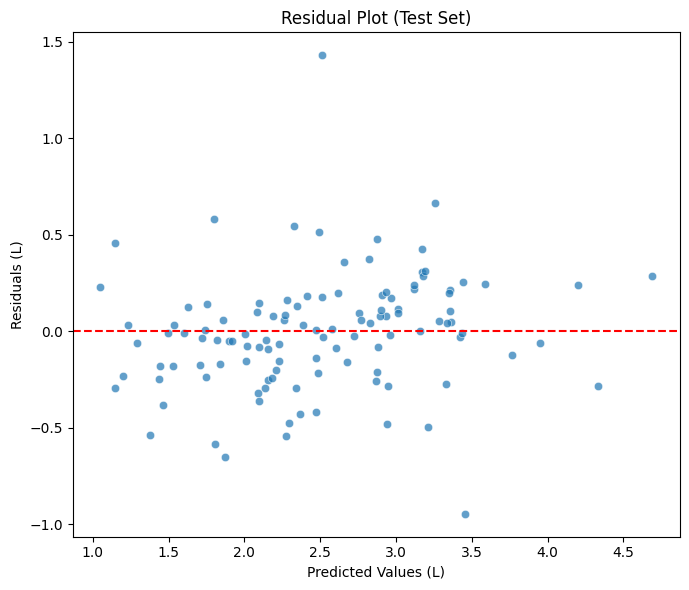


Top 5 patients with largest errors:
         Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  \
1000934          2.50        3.94       2.509106   1.430894   
545418           3.63        2.51       3.455139   0.945139   
1001223          3.46        3.92       3.257195   0.662805   
1001175          1.98        1.22       1.873309   0.653309   
347690           1.80        1.22       1.803826   0.583826   

         Baseline_FVC_Week  Followup_FVC_Week  
1000934                0.0               52.0  
545418                 0.0               53.0  
1001223                0.0               48.0  
1001175                0.0               54.0  
347690                 0.0               50.0  


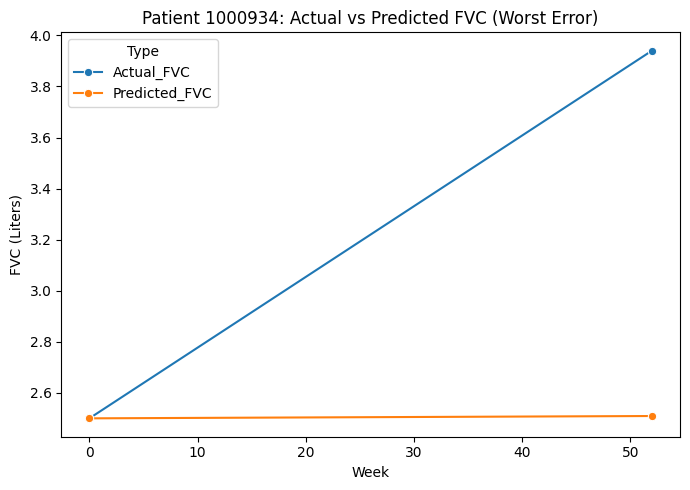

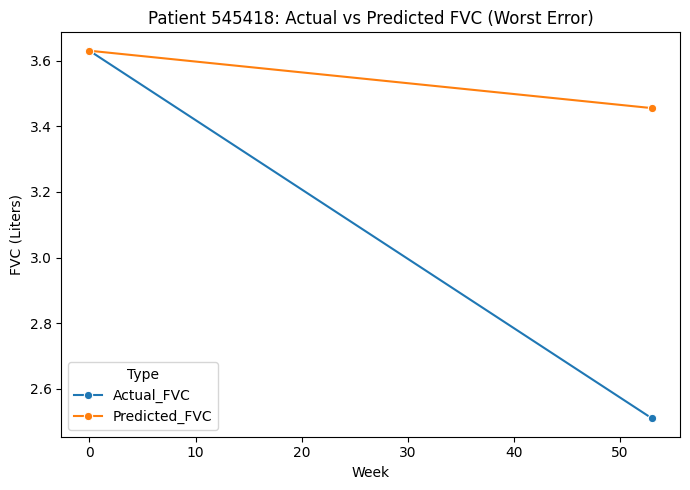

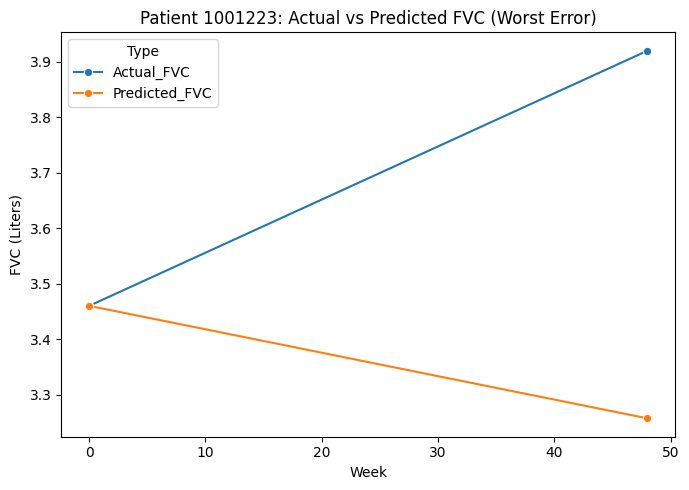

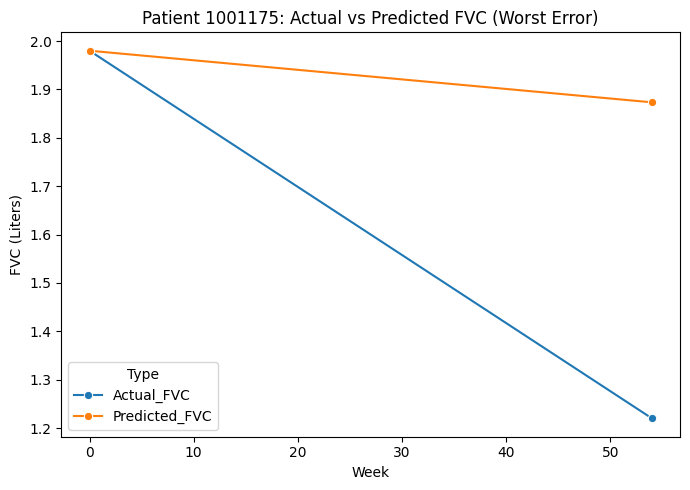

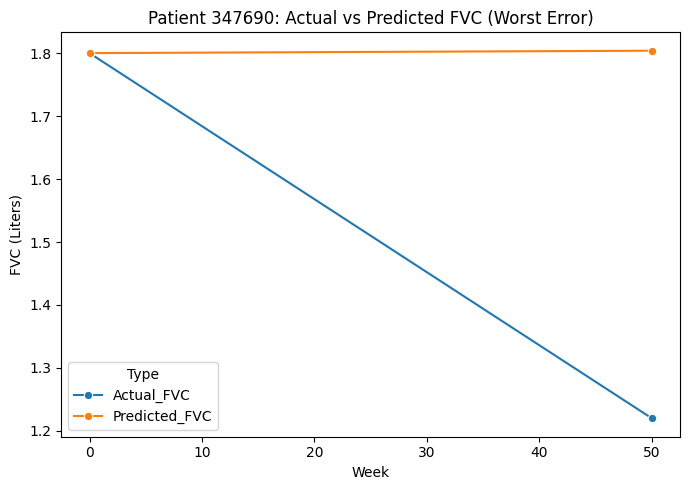


Top 5 patients with increasing FVC and lowest error:
         Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  \
1001253          1.43        1.49       1.497190   0.007190   
1000616          1.73        1.75       1.741318   0.008682   
1001197          1.18        1.26       1.229189   0.030811   
1000769          1.56        1.57       1.538835   0.031165   
142332           1.67        1.69       1.723038   0.033038   

         Baseline_FVC_Week  Followup_FVC_Week  
1001253                0.0               54.0  
1000616                0.0               48.0  
1001197                0.0               48.0  
1000769                0.0               52.0  
142332                 0.0               50.0  


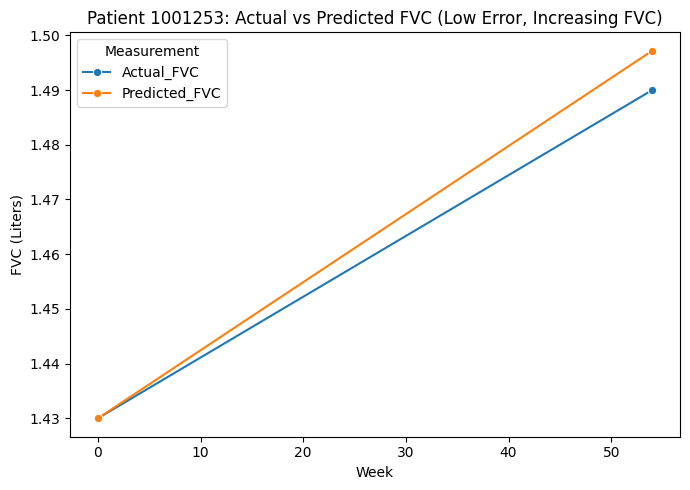

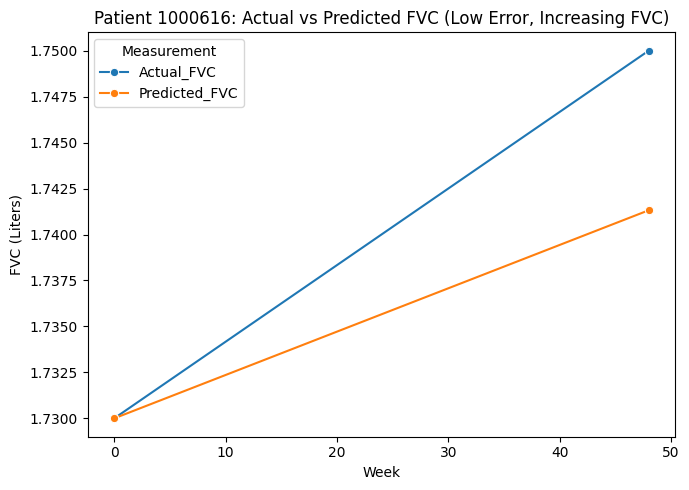

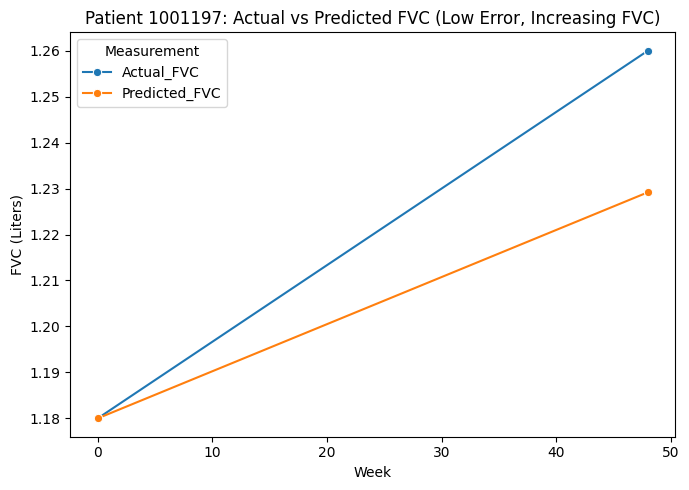

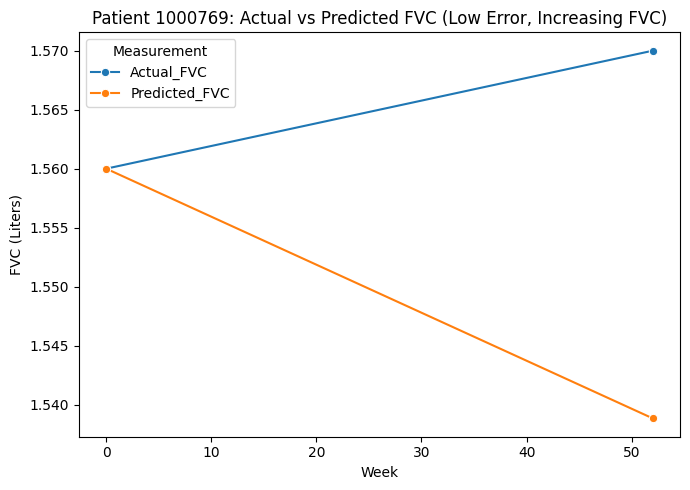

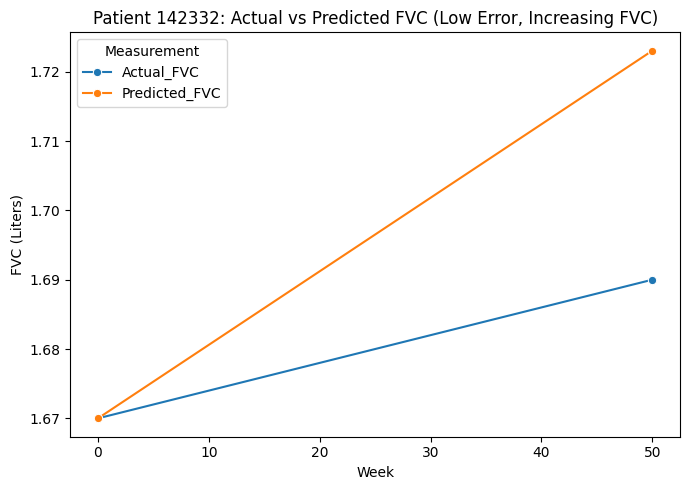

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


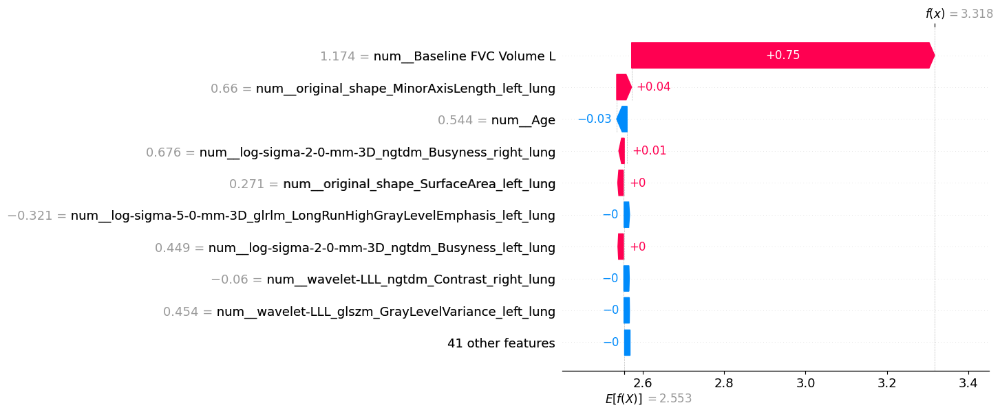

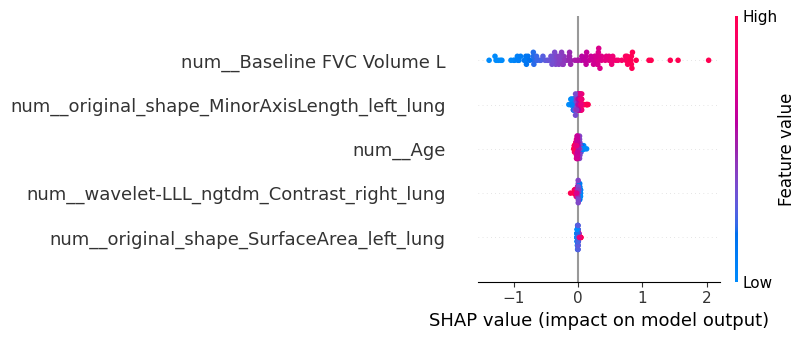

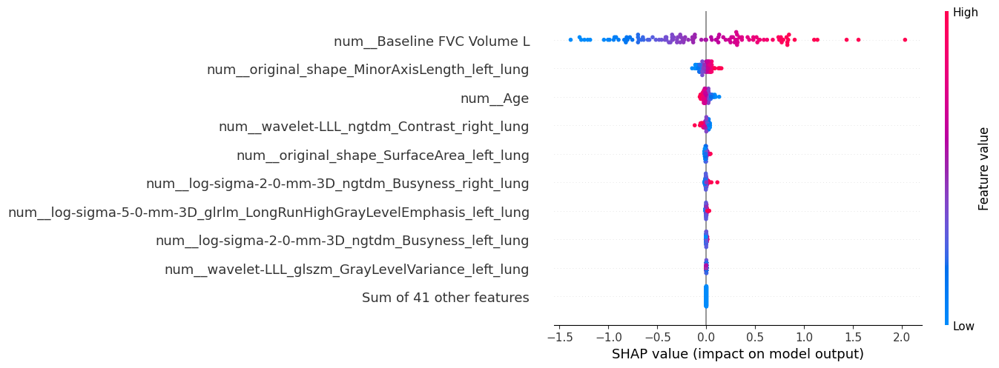

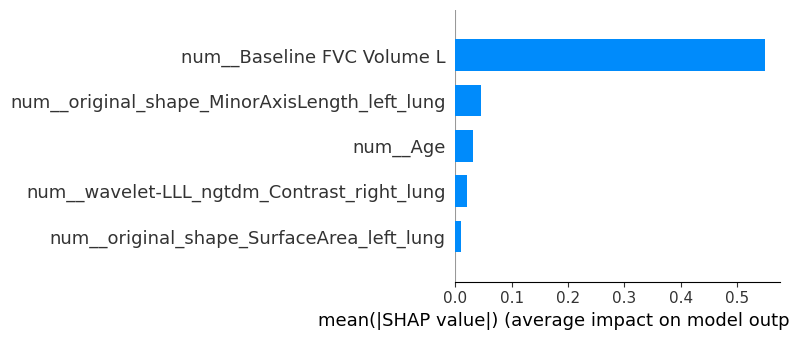

In [22]:
selected_features =['original_shape_MinorAxisLength_left_lung', 'wavelet-HHH_glcm_MCC_right_lung', 'wavelet-LLL_glszm_GrayLevelVariance_left_lung', 'original_shape_MinorAxisLength_right_lung', 'wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung', 'log-sigma-1-0-mm-3D_gldm_GrayLevelNonUniformity_left_lung', 'log-sigma-3-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Busyness_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Busyness_left_lung', 'original_firstorder_90Percentile_right_lung', 'log-sigma-3-0-mm-3D_glszm_ZoneVariance_right_lung', 'original_shape_SurfaceArea_left_lung', 'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_lung', 'original_glszm_SmallAreaHighGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_ngtdm_Busyness_right_lung', 'log-sigma-1-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'wavelet-LLH_glrlm_GrayLevelNonUniformity_right_lung', 'wavelet-LHL_firstorder_Kurtosis_right_lung', 'wavelet-LLL_glszm_GrayLevelNonUniformity_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'wavelet-HLL_glrlm_RunLengthNonUniformity_right_lung', 'original_firstorder_90Percentile_left_lung', 'original_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'wavelet-LHL_ngtdm_Busyness_right_lung', 'log-sigma-5-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung', 'log-sigma-2-0-mm-3D_firstorder_Kurtosis_left_lung', 'wavelet-LLL_ngtdm_Contrast_right_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung']
Clinical_Contineous_data_ext = selected_features + Clinical_Contineous_data
print(Clinical_Contineous_data_ext)
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_with_clinical_harmonization.pkl")
X_train_clini_log = X_train.copy()
X_test_clini_log  = X_test.copy()

# Transform Age
for col in ['Age']:
    X_train_clini_log[col] = np.log(X_train_clini_log[col])
    X_test_clini_log[col] = np.log(X_test_clini_log[col])

# Median imputation (only needed if missing values exist)
imp_median = SimpleImputer(strategy='median')
imp_median.fit(X_train_clini_log)

X_train_median_filled = pd.DataFrame(
    imp_median.transform(X_train_clini_log),
    columns=X_train_clini_log.columns,
    index=X_train_clini_log.index
)

X_test_median_filled = pd.DataFrame(
    imp_median.transform(X_test_clini_log),
    columns=X_test_clini_log.columns,
    index=X_test_clini_log.index
)
# Run experiments
results1 = train_and_evaluate_lasso(X_train_median_filled, X_test_median_filled, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data, model_name="/home/pansurya/OSIC_thesis/LASSO_model/Hierarchical_mrmr_VIF_with_harmonizationPycombat.pkl")
# print("Running LOOCV experiment...")
# results1 = train_and_evaluate_with_LOOCV(X_train, X_test, y_train, y_test, selected_features, model_name="/home/pansurya/OSIC_thesis/Linear_model/Hierarchical_mrmr_VIF_LOOCV.pkl")



['wavelet-HHH_glcm_MCC_right_lung', 'wavelet-LHH_firstorder_Mean_left_lung', 'wavelet-LHH_firstorder_Skewness_left_lung', 'wavelet-LHH_glcm_ClusterShade_left_lung', 'wavelet-HHH_firstorder_Mean_left_lung', 'wavelet-HHH_glcm_MCC_left_lung', 'wavelet-LLL_firstorder_Maximum_left_lung', 'log-sigma-1-0-mm-3D_firstorder_Maximum_left_lung', 'Baseline FVC Volume L', 'Age', 'FEV1 Volume L']
Numeric features: ['wavelet-HHH_glcm_MCC_right_lung', 'wavelet-LHH_firstorder_Mean_left_lung', 'wavelet-LHH_firstorder_Skewness_left_lung', 'wavelet-LHH_glcm_ClusterShade_left_lung', 'wavelet-HHH_firstorder_Mean_left_lung', 'wavelet-HHH_glcm_MCC_left_lung', 'wavelet-LLL_firstorder_Maximum_left_lung', 'log-sigma-1-0-mm-3D_firstorder_Maximum_left_lung', 'Baseline FVC Volume L', 'Age', 'FEV1 Volume L']
One-hot features: ['Sex_Male', 'Primary Diagnosis_CTD-ILD', 'Primary Diagnosis_Exposure-related', 'Primary Diagnosis_Fibrotic HP (FHP)', 'Primary Diagnosis_INSIP', 'Primary Diagnosis_IPF', 'Primary Diagnosis_Idio

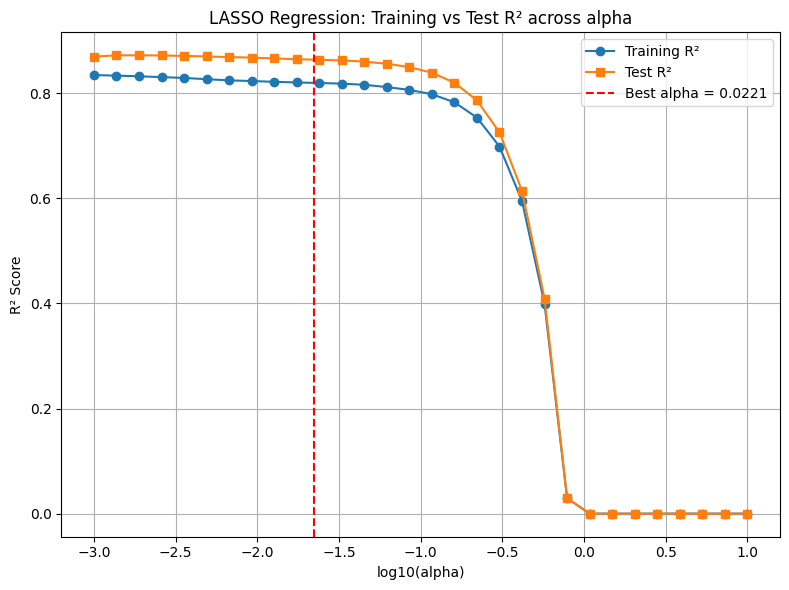

- MLL (adaptive σ): -2.1352

Test set performance:
- MAE:  0.22 L
- MSE:  0.10 L²
- RMSE: 0.31 L
- R²:   0.864

Training set performance:
- MAE:  0.26 L
- MSE:  0.14 L²
- RMSE: 0.38 L
- R²:   0.819

Model coefficients (sorted by |coef|):
                                              Feature  Coefficient
8                               Baseline FVC Volume L     0.759788
9                                                 Age    -0.042565
0                     wavelet-HHH_glcm_MCC_right_lung    -0.000000
1               wavelet-LHH_firstorder_Mean_left_lung    -0.000000
3             wavelet-LHH_glcm_ClusterShade_left_lung     0.000000
2           wavelet-LHH_firstorder_Skewness_left_lung     0.000000
4               wavelet-HHH_firstorder_Mean_left_lung     0.000000
5                      wavelet-HHH_glcm_MCC_left_lung     0.000000
7    log-sigma-1-0-mm-3D_firstorder_Maximum_left_lung    -0.000000
6            wavelet-LLL_firstorder_Maximum_left_lung    -0.000000
10                       

/tmp/ipykernel_1615777/1886070794.py:244: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


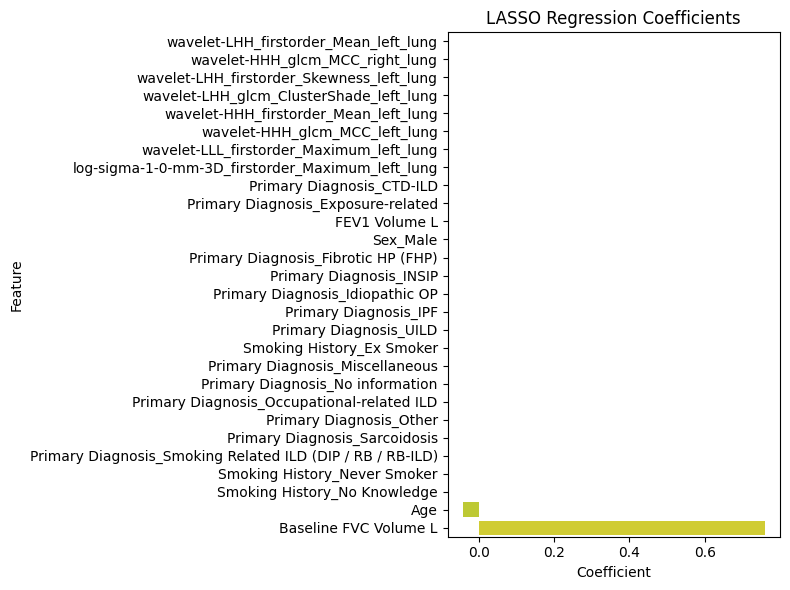

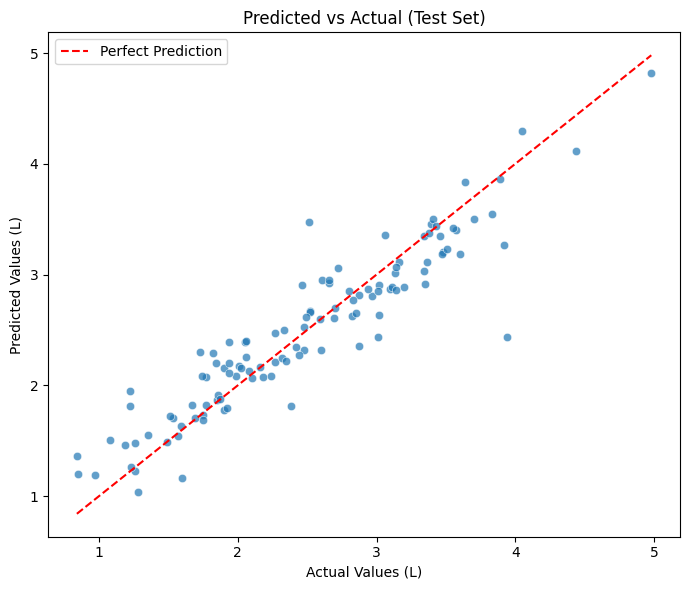

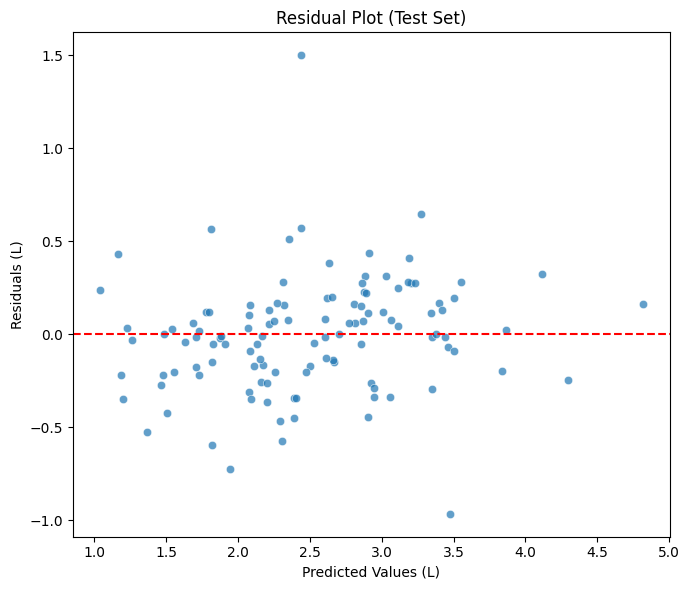


Top 5 patients with largest errors:
         Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  \
1000934          2.50        3.94       2.439044   1.500956   
545418           3.63        2.51       3.474943   0.964943   
1001175          1.98        1.22       1.945406   0.725406   
1001223          3.46        3.92       3.270474   0.649526   
347690           1.80        1.22       1.817515   0.597515   

         Baseline_FVC_Week  Followup_FVC_Week  
1000934                0.0               52.0  
545418                 0.0               53.0  
1001175                0.0               54.0  
1001223                0.0               48.0  
347690                 0.0               50.0  


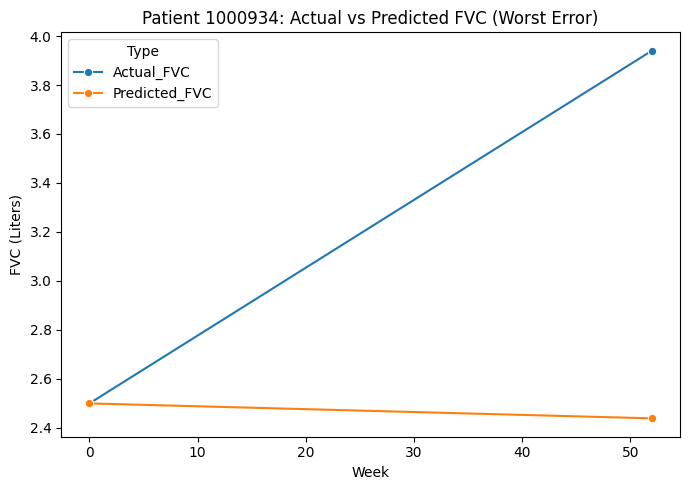

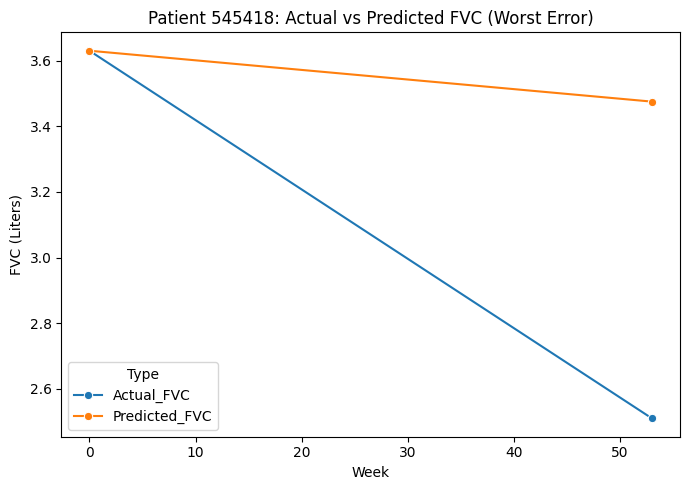

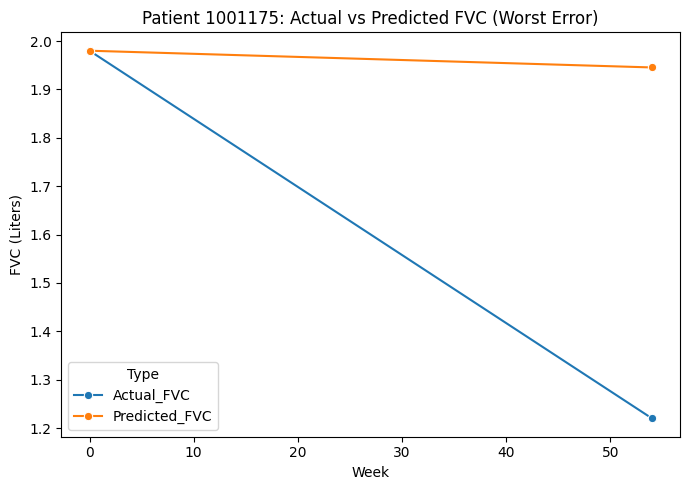

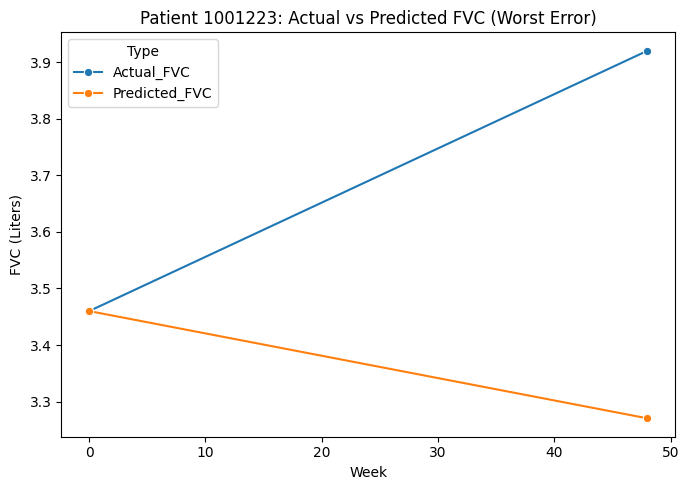

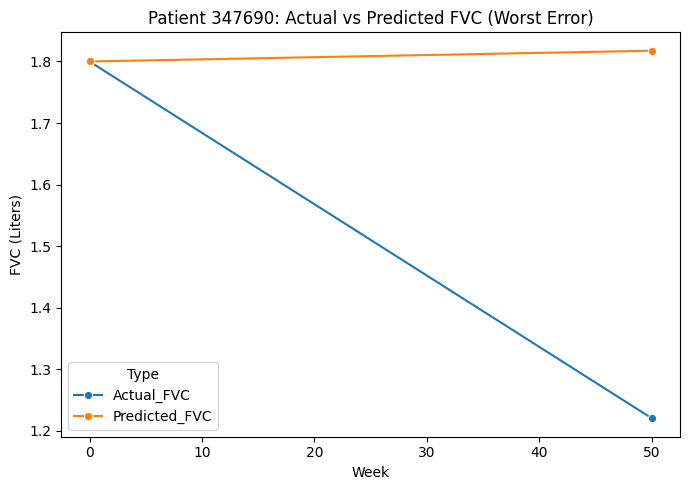


Top 5 patients with increasing FVC and lowest error:
         Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  \
1001253          1.43        1.49       1.485656   0.004344   
142332           1.67        1.69       1.706331   0.016331   
1000616          1.73        1.75       1.729975   0.020025   
1000769          1.56        1.57       1.542415   0.027585   
1000971          1.21        1.23       1.261865   0.031865   

         Baseline_FVC_Week  Followup_FVC_Week  
1001253                0.0               54.0  
142332                 0.0               50.0  
1000616                0.0               48.0  
1000769                0.0               52.0  
1000971                0.0               48.0  


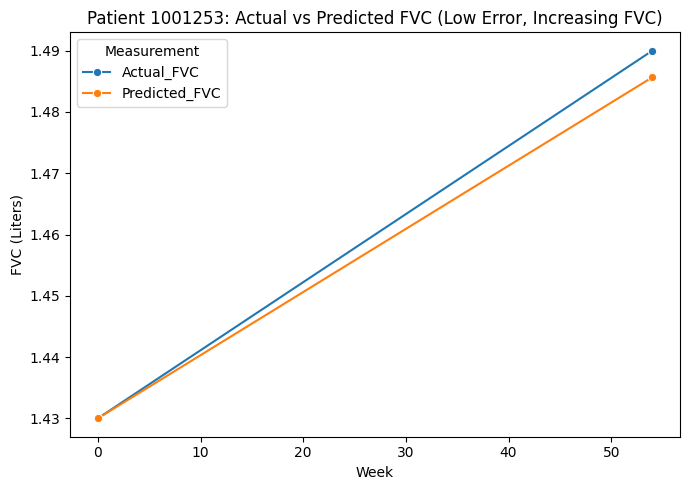

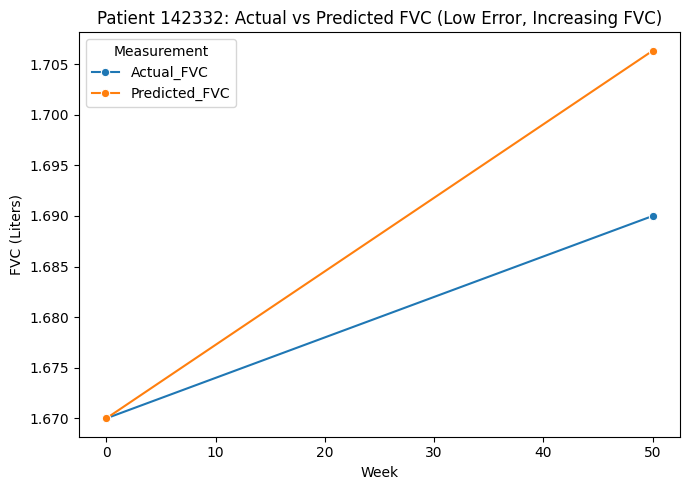

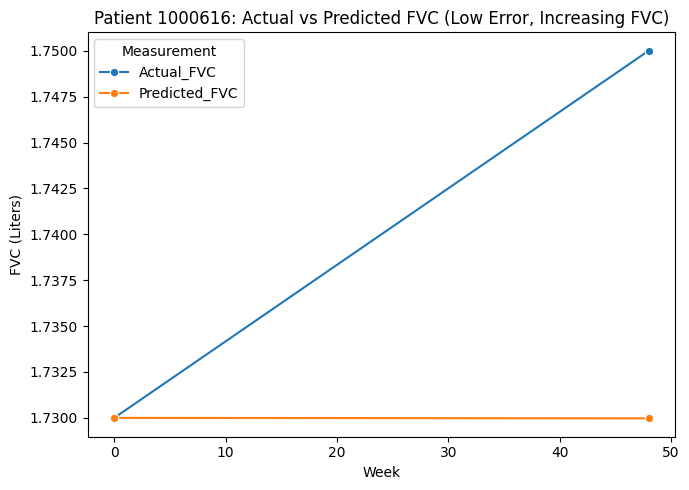

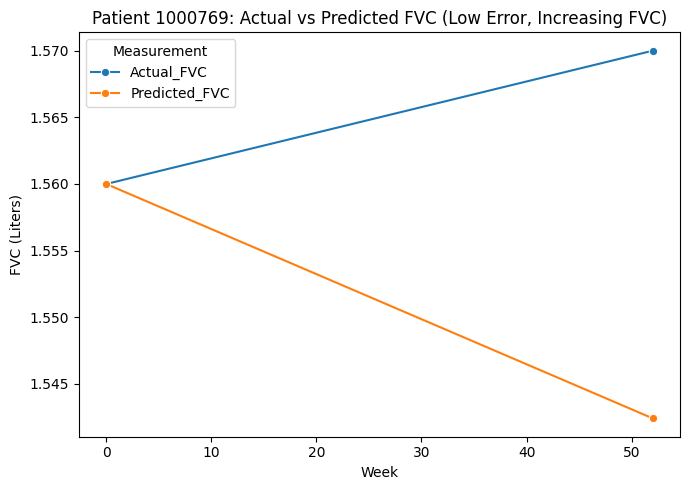

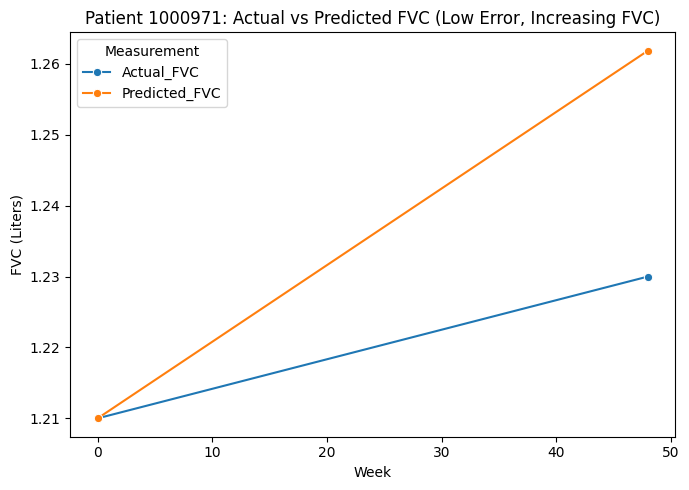

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


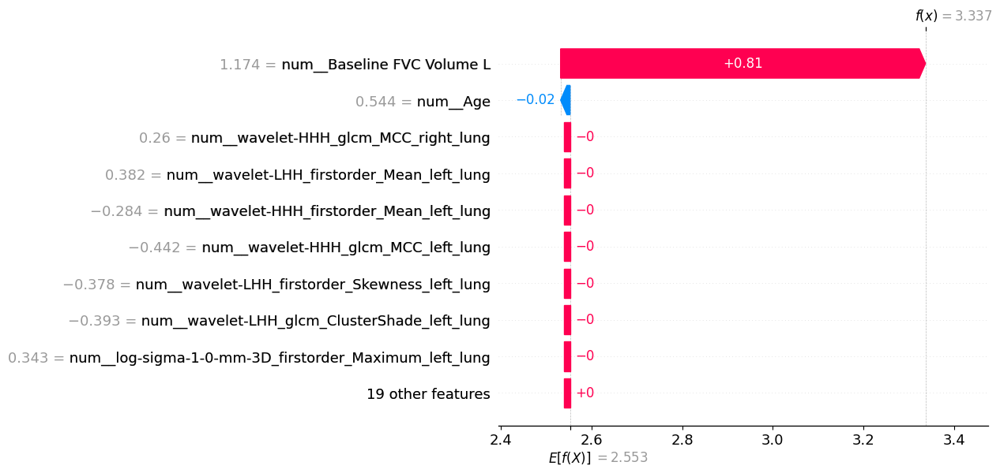

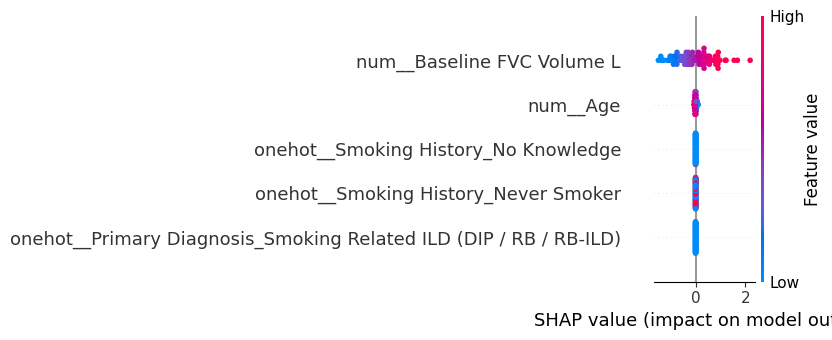

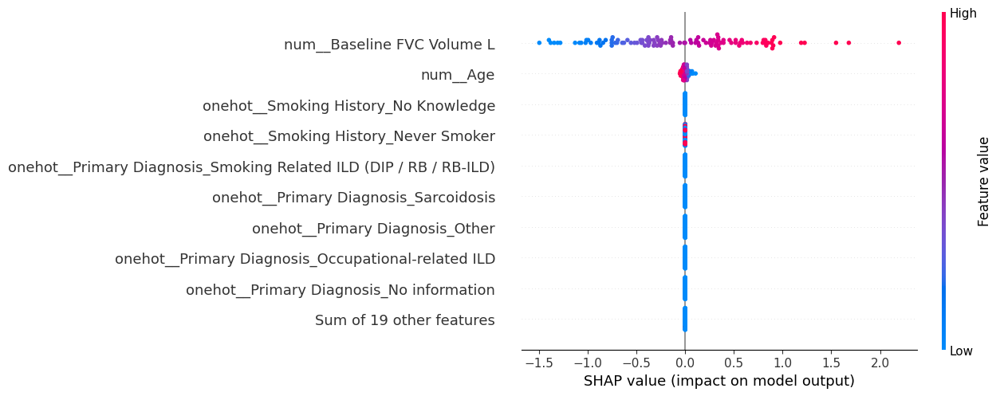

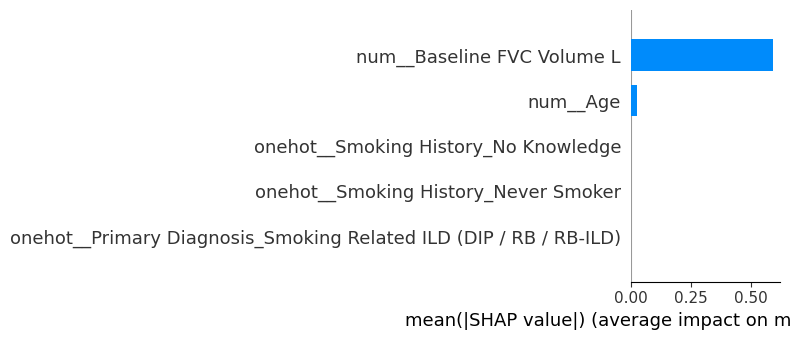

In [21]:
selected_features = ['wavelet-HHH_glcm_MCC_right_lung', 'wavelet-LHH_firstorder_Mean_left_lung', 'wavelet-LHH_firstorder_Skewness_left_lung', 'wavelet-LHH_glcm_ClusterShade_left_lung', 'wavelet-HHH_firstorder_Mean_left_lung', 'wavelet-HHH_glcm_MCC_left_lung', 'wavelet-LLL_firstorder_Maximum_left_lung', 'log-sigma-1-0-mm-3D_firstorder_Maximum_left_lung']
Clinical_Contineous_data_ext = selected_features + Clinical_Contineous_data
print(Clinical_Contineous_data_ext)
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_with_clinical_harmonization.pkl")
X_train_clini_log = X_train.copy()
X_test_clini_log  = X_test.copy()

# Transform Age
for col in ['Age']:
    X_train_clini_log[col] = np.log(X_train_clini_log[col])
    X_test_clini_log[col] = np.log(X_test_clini_log[col])

# Median imputation (only needed if missing values exist)
imp_median = SimpleImputer(strategy='median')
imp_median.fit(X_train_clini_log)

X_train_median_filled = pd.DataFrame(
    imp_median.transform(X_train_clini_log),
    columns=X_train_clini_log.columns,
    index=X_train_clini_log.index
)

X_test_median_filled = pd.DataFrame(
    imp_median.transform(X_test_clini_log),
    columns=X_test_clini_log.columns,
    index=X_test_clini_log.index
)
# Run experiments
results1 = train_and_evaluate_lasso(X_train_median_filled, X_test_median_filled, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data, model_name="/home/pansurya/OSIC_thesis/LASSO_model/Hierarchical_cluster_mrmr_VIF_with_harmonizationPycombat.pkl")



['log-sigma-2-0-mm-3D_ngtdm_Strength_left_lung', 'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_lung', 'wavelet-HLH_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'log-sigma-5-0-mm-3D_glrlm_RunEntropy_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Coarseness_right_lung', 'original_firstorder_90Percentile_right_lung', 'log-sigma-3-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Energy_left_lung', 'wavelet-LHH_ngtdm_Contrast_right_lung', 'wavelet-HHL_ngtdm_Contrast_right_lung', 'wavelet-HLH_ngtdm_Contrast_left_lung', 'Baseline FVC Volume L', 'Age', 'FEV1 Volume L']
Numeric features: ['log-sigma-2-0-mm-3D_ngtdm_Strength_left_lung', 'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_lung', 'wavelet-HLH_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'log-sigma-5-0-mm-3D_glrlm_RunEntropy_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Coarseness_right_lung', 'original_firstorder_90Percentile_right_lung', 'log-sigma-3-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_rig

MAE: [0.2553268572477908, 0.24457515275791022, 0.2609089603595218, 0.23828600768318126, 0.2503956374285018, 0.24723728833460482, 0.21644506048255932, 0.31013801215780407, 0.17261880679338115, 0.29903338596515944, 0.2572324764424284, 0.21911919547890552, 0.2838911470499945, 0.22047244193407173, 0.24996752053126703]
MSE: [0.17297485679469518, 0.11575945181725643, 0.14182404630160803, 0.13693108203034396, 0.11001376570297718, 0.12920919572293038, 0.08804422876318178, 0.20472904213463394, 0.0430715709037695, 0.2024423341431862, 0.13766806282578753, 0.13219834769996128, 0.17117331155068724, 0.09890802313998946, 0.11530001634480415]
RMSE: [0.4159024606740085, 0.3402344071625567, 0.3765953349440325, 0.37004200035988344, 0.33168323096439045, 0.35945680647739914, 0.2967224776844211, 0.4524699350615839, 0.20753691455683132, 0.44993592226358875, 0.37103647101839937, 0.3635909070644662, 0.4137309651823117, 0.3144964596620914, 0.33955856099471876]
R2: [0.793354511929939, 0.8385377903104814, 0.82315

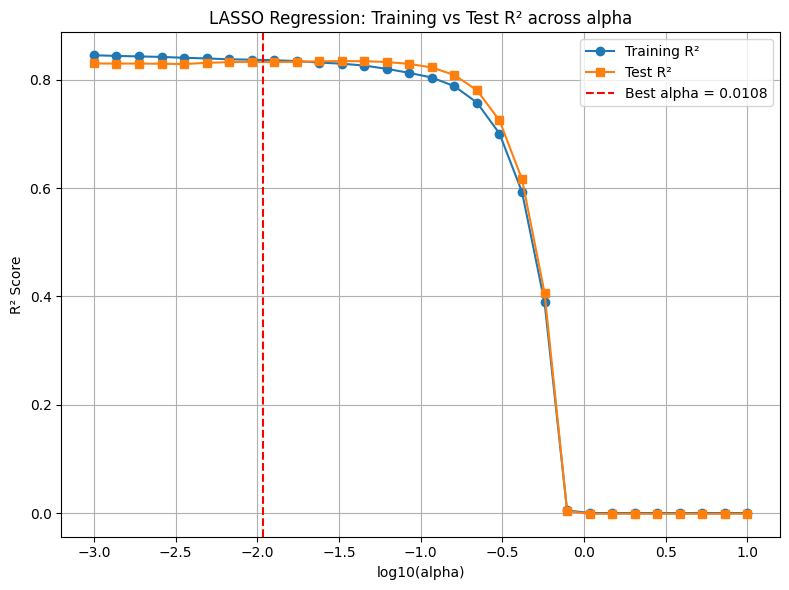

- MLL (adaptive σ): -2.6793

Test set performance:
- MAE:  0.26 L
- MSE:  0.14 L²
- RMSE: 0.37 L
- R²:   0.833

Training set performance:
- MAE:  0.24 L
- MSE:  0.12 L²
- RMSE: 0.35 L
- R²:   0.837

Model coefficients (sorted by |coef|):
                                              Feature   Coefficient
11                              Baseline FVC Volume L  6.967492e-01
30                                         Sex_Female -1.004382e-01
12                                                Age -7.358410e-02
5         original_firstorder_90Percentile_right_lung -4.481356e-02
1   wavelet-HHL_glrlm_GrayLevelNonUniformity_right...  2.908124e-02
6   log-sigma-3-0-mm-3D_glrlm_LongRunHighGrayLevel...  2.350763e-02
7     log-sigma-2-0-mm-3D_firstorder_Energy_left_lung  2.305676e-02
20                              Primary Diagnosis_IPF -2.031302e-02
33                          Smoking History_Ex Smoker -1.030320e-02
10               wavelet-HLH_ngtdm_Contrast_left_lung  5.303743e-03
8             

/tmp/ipykernel_1615777/1886070794.py:244: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


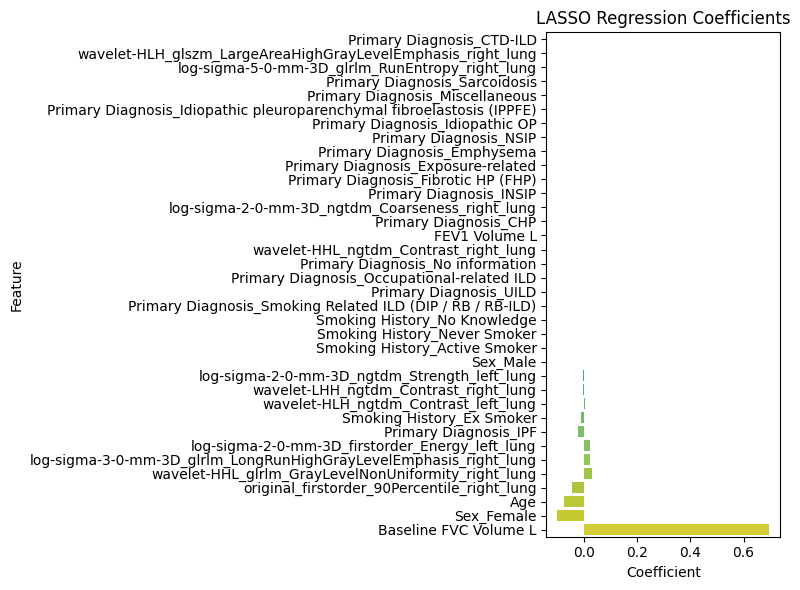

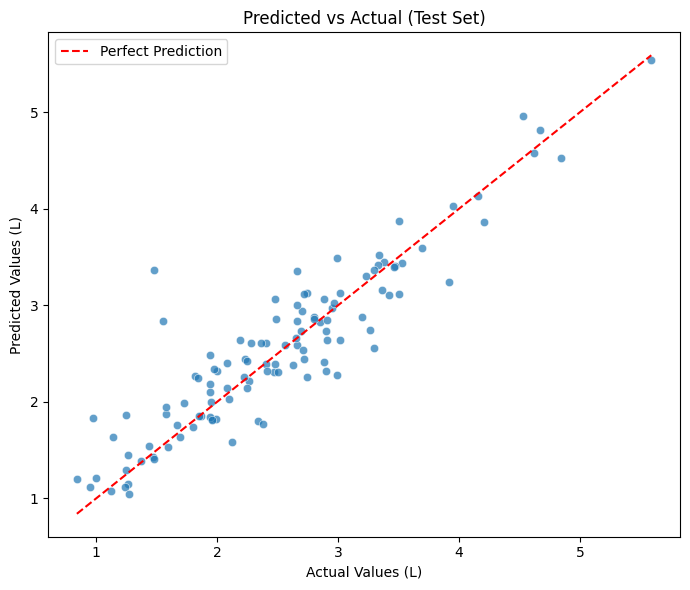

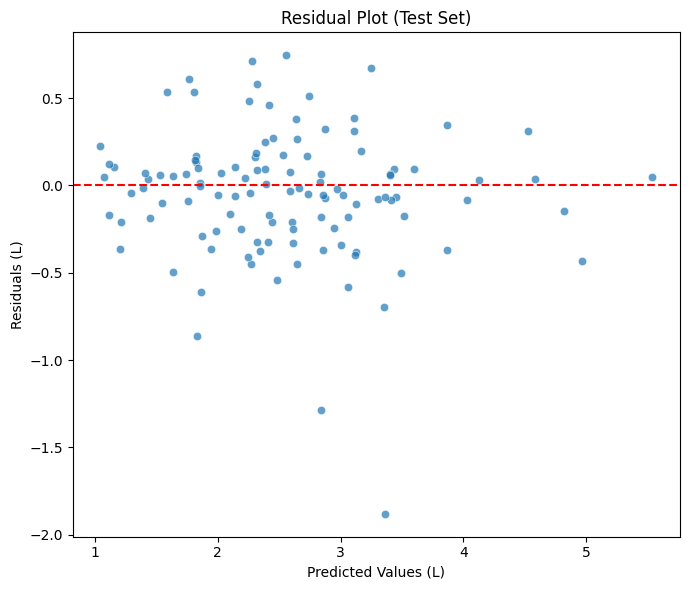


Top 5 patients with largest errors:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
155          3.59        1.48       3.360396   1.880396                0.0   
167          2.93        1.55       2.837433   1.287433                0.0   
79           1.90        0.97       1.834581   0.864581                0.0   
329          2.61        3.30       2.554600   0.745400                0.0   
480          2.33        2.99       2.276207   0.713793                0.0   

     Followup_FVC_Week  
155               53.0  
167               52.0  
79                54.0  
329               56.0  
480               51.0  


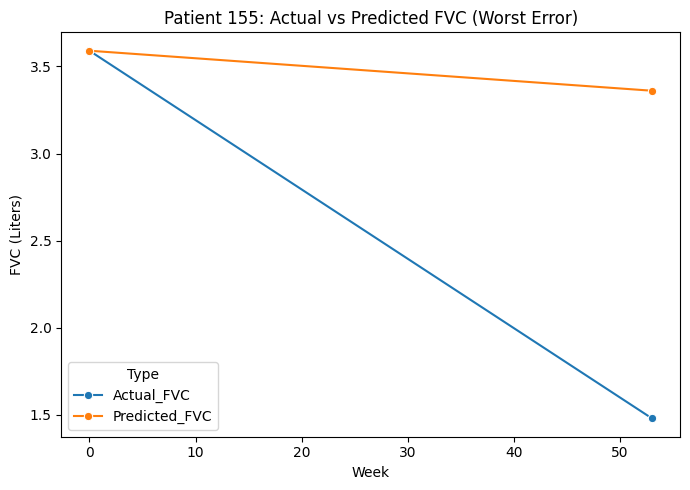

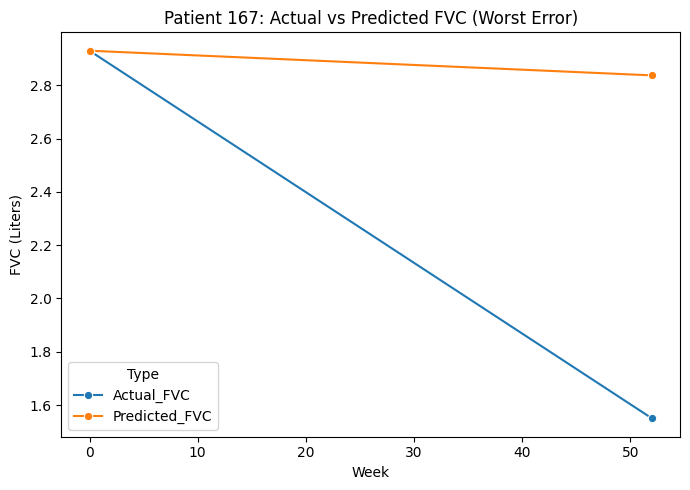

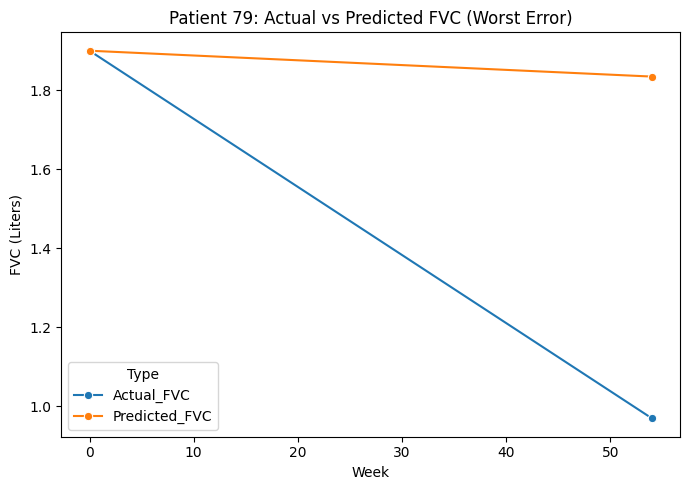

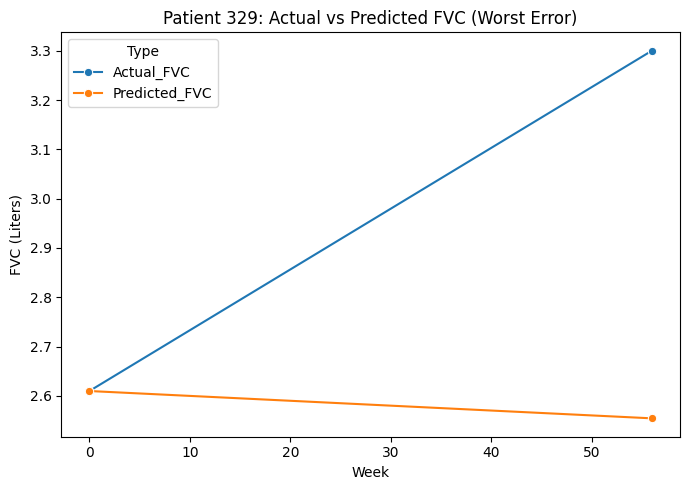

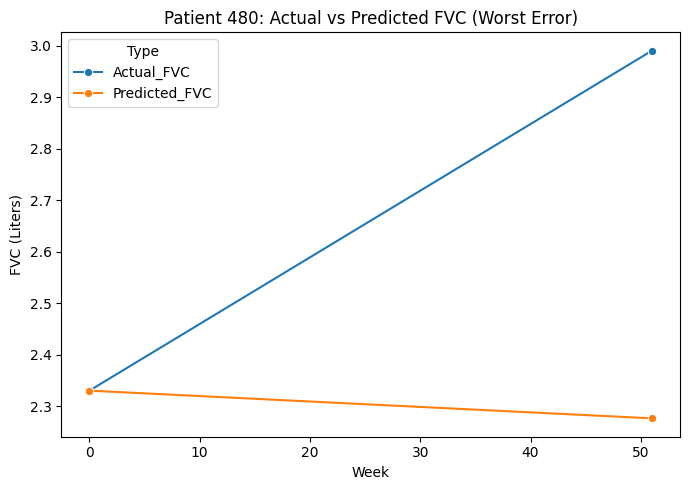


Top 5 patients with increasing FVC and lowest error:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
84           1.58        1.69       1.636485   0.053515                0.0   
556          1.43        1.48       1.410218   0.069782                0.0   
533          2.65        2.66       2.585622   0.074378                0.0   
73           2.36        2.48       2.386794   0.093206                0.0   
227          1.20        1.26       1.152979   0.107021                0.0   

     Followup_FVC_Week  
84                52.0  
556               55.0  
533               52.0  
73                53.0  
227               51.0  


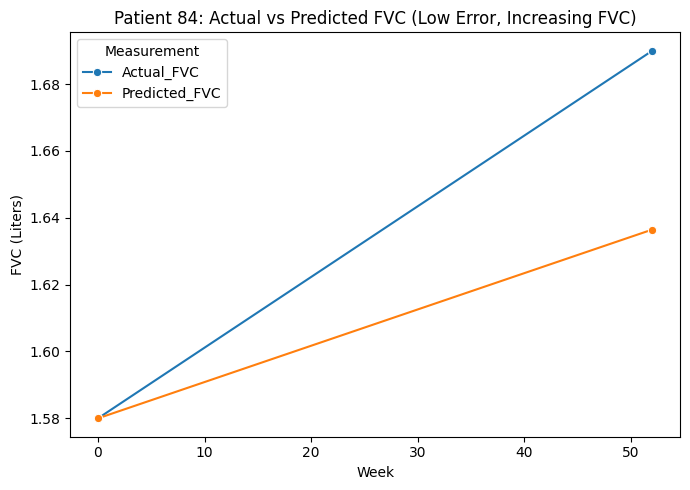

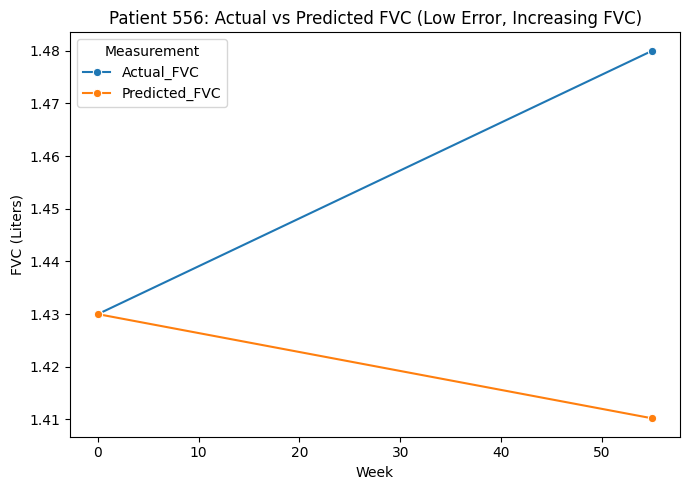

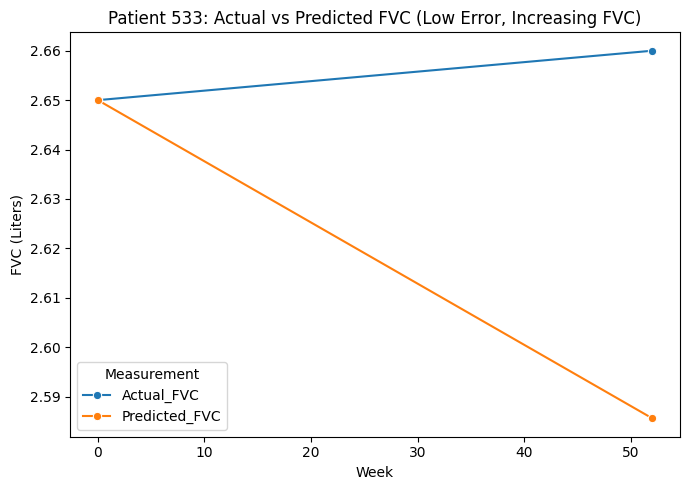

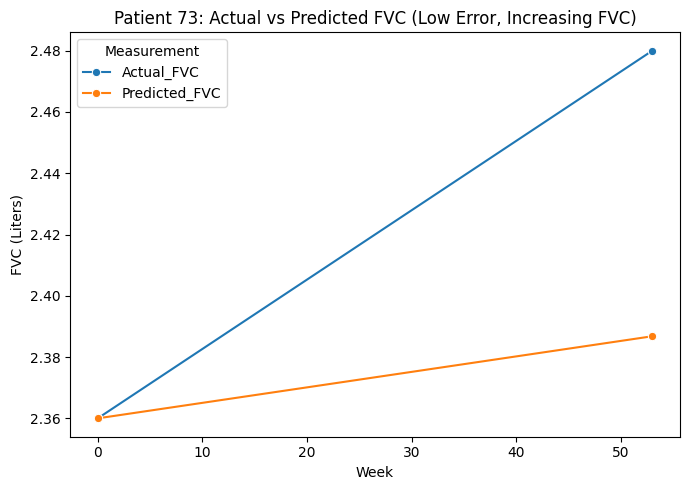

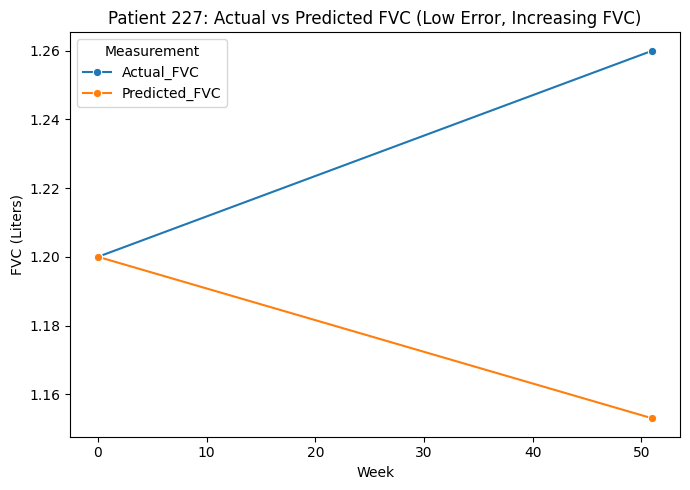

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


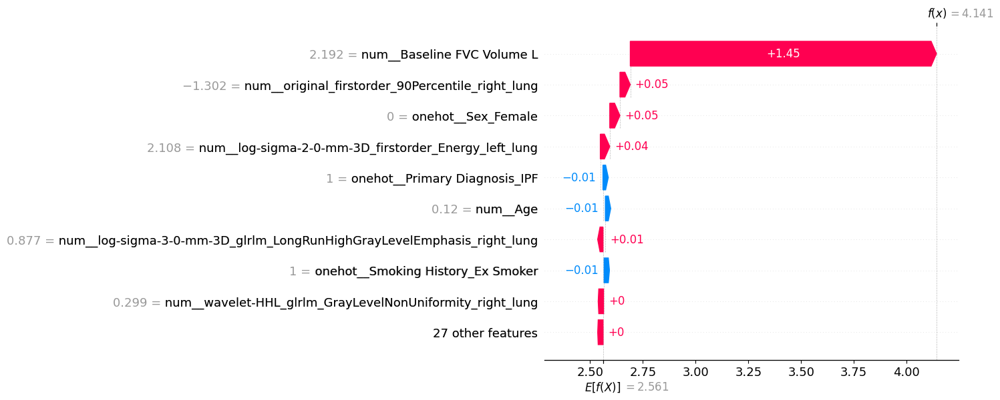

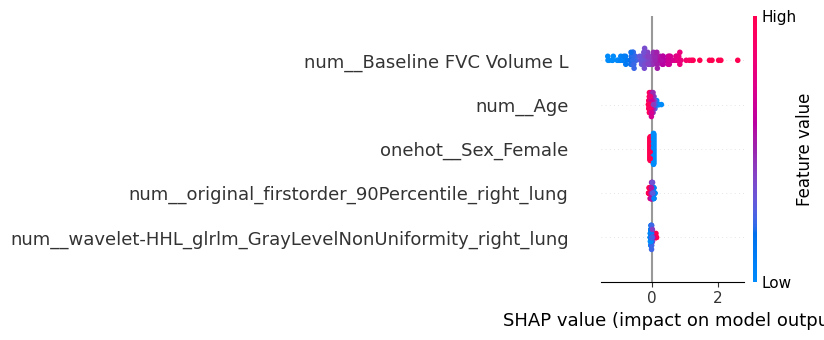

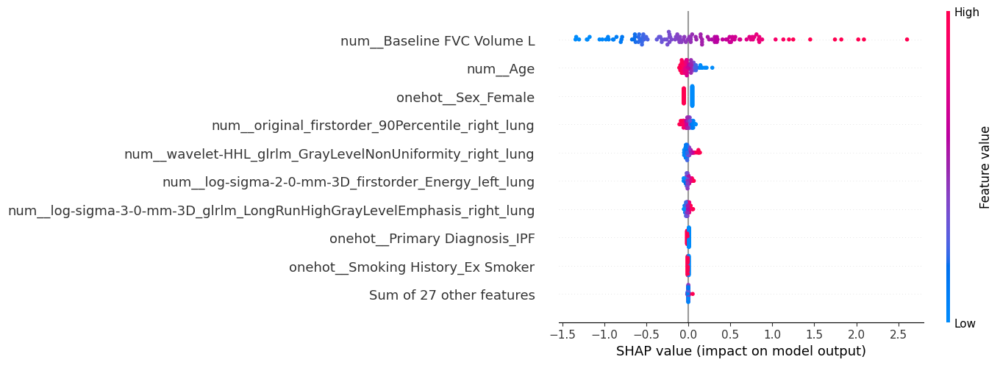

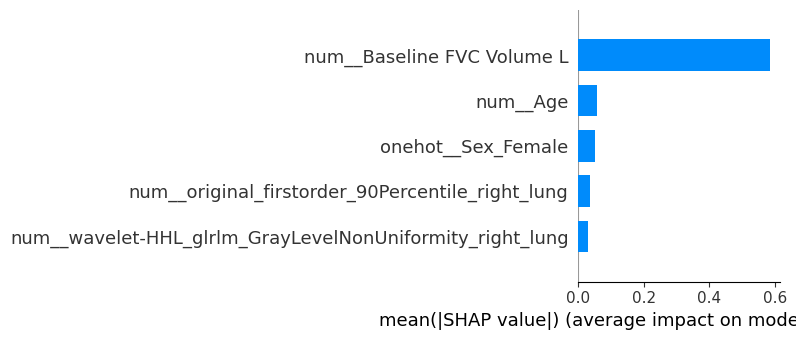

In [9]:
selected_features = ['log-sigma-2-0-mm-3D_ngtdm_Strength_left_lung', 'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_lung', 'wavelet-HLH_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'log-sigma-5-0-mm-3D_glrlm_RunEntropy_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Coarseness_right_lung', 'original_firstorder_90Percentile_right_lung', 'log-sigma-3-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Energy_left_lung', 'wavelet-LHH_ngtdm_Contrast_right_lung', 'wavelet-HHL_ngtdm_Contrast_right_lung', 'wavelet-HLH_ngtdm_Contrast_left_lung']
Clinical_Contineous_data_ext = selected_features + Clinical_Contineous_data
print(Clinical_Contineous_data_ext)
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_clinical_without_harmonization.pkl")
X_train_clini_log = X_train.copy()
X_test_clini_log  = X_test.copy()

# Transform Age
for col in ['Age']:
    X_train_clini_log[col] = np.log(X_train_clini_log[col])
    X_test_clini_log[col] = np.log(X_test_clini_log[col])

# Median imputation (only needed if missing values exist)
imp_median = SimpleImputer(strategy='median')
imp_median.fit(X_train_clini_log)

X_train_median_filled = pd.DataFrame(
    imp_median.transform(X_train_clini_log),
    columns=X_train_clini_log.columns,
    index=X_train_clini_log.index
)

X_test_median_filled = pd.DataFrame(
    imp_median.transform(X_test_clini_log),
    columns=X_test_clini_log.columns,
    index=X_test_clini_log.index
)
# Run experiments
results1 = train_and_evaluate_lasso(X_train_median_filled, X_test_median_filled, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data, model_name="/home/pansurya/OSIC_thesis/LASSO_model/PCA_K-means_without_harmonization.pkl")



['original_shape_MinorAxisLength_right_lung', 'original_shape_SurfaceArea_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Median_right_lung', 'log-sigma-3-0-mm-3D_glcm_Idmn_right_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung', 'original_shape_MinorAxisLength_left_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung', 'Baseline FVC Volume L', 'Age', 'FEV1 Volume L']
Numeric features: ['original_shape_MinorAxisLength_right_lung', 'original_shape_SurfaceArea_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Median_right_lung', 'log-sigma-3-0-mm-3D_glcm_Idmn_right_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung',

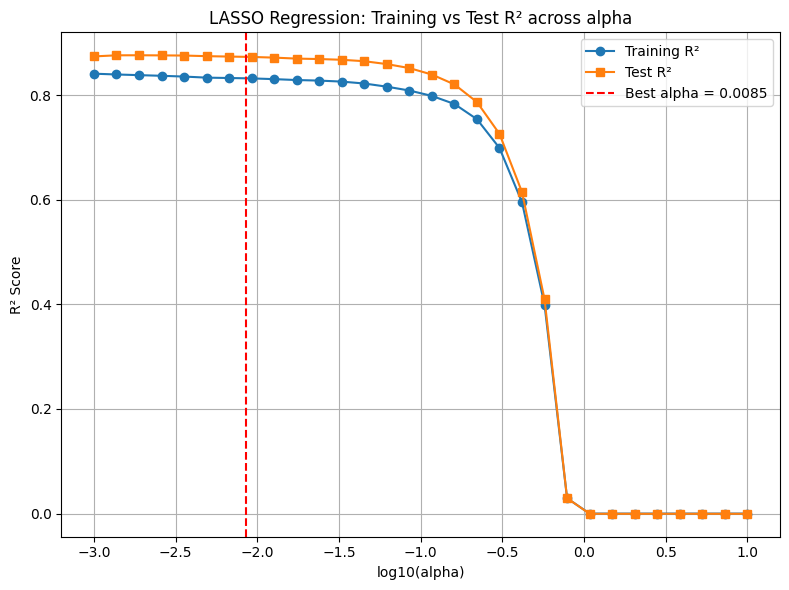

- MLL (adaptive σ): -1.8975

Test set performance:
- MAE:  0.21 L
- MSE:  0.09 L²
- RMSE: 0.30 L
- R²:   0.873

Training set performance:
- MAE:  0.25 L
- MSE:  0.14 L²
- RMSE: 0.37 L
- R²:   0.826

Model coefficients (sorted by |coef|):
                                              Feature  Coefficient
10                              Baseline FVC Volume L     0.711871
8            original_shape_MinorAxisLength_left_lung     0.064994
11                                                Age    -0.048078
6   log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLeve...     0.014851
3                    wavelet-HHL_glcm_Idmn_right_lung     0.013033
0           original_shape_MinorAxisLength_right_lung     0.000000
5            log-sigma-3-0-mm-3D_glcm_Idmn_right_lung    -0.000000
4    log-sigma-2-0-mm-3D_firstorder_Median_right_lung    -0.000000
2   original_gldm_LargeDependenceLowGrayLevelEmpha...     0.000000
1               original_shape_SurfaceArea_right_lung     0.000000
9   log-sigma-1-0-mm-3D_g

/tmp/ipykernel_1615777/1886070794.py:244: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


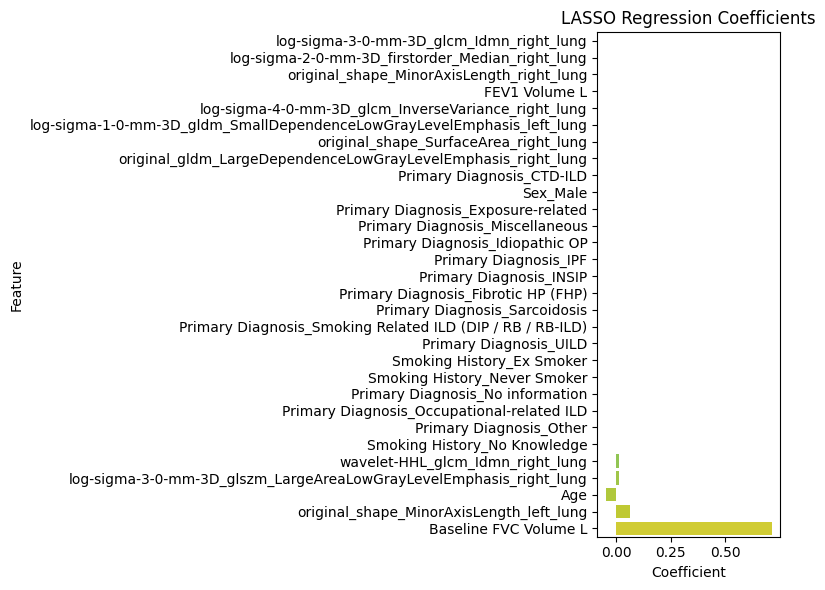

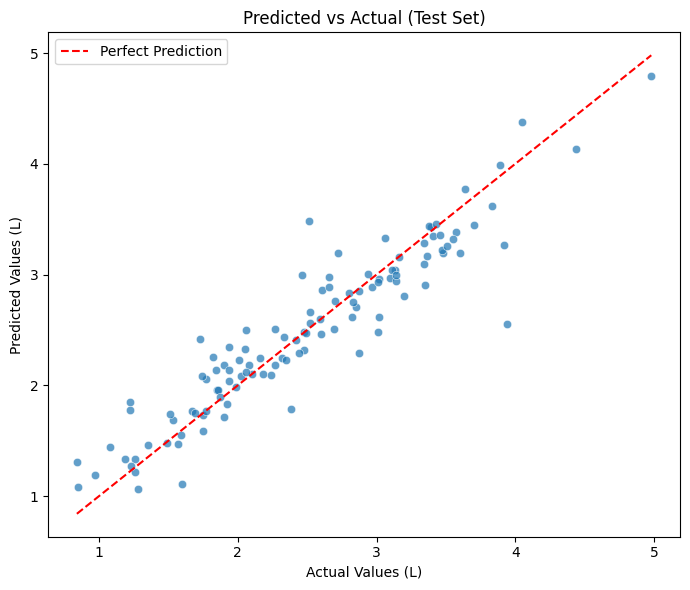

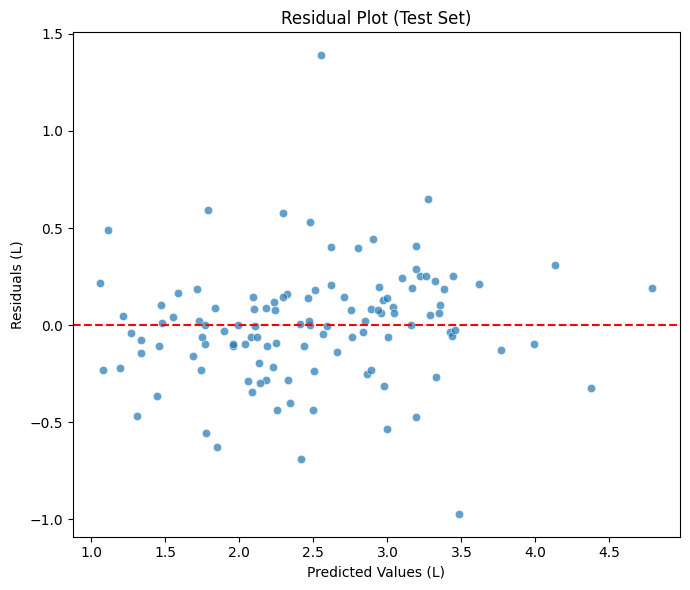


Top 5 patients with largest errors:
         Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  \
1000934          2.50        3.94       2.549950   1.390050   
545418           3.63        2.51       3.482141   0.972141   
1000699          2.37        1.73       2.417457   0.687457   
1001223          3.46        3.92       3.271300   0.648700   
1001175          1.98        1.22       1.849189   0.629189   

         Baseline_FVC_Week  Followup_FVC_Week  
1000934                0.0               52.0  
545418                 0.0               53.0  
1000699                0.0               56.0  
1001223                0.0               48.0  
1001175                0.0               54.0  


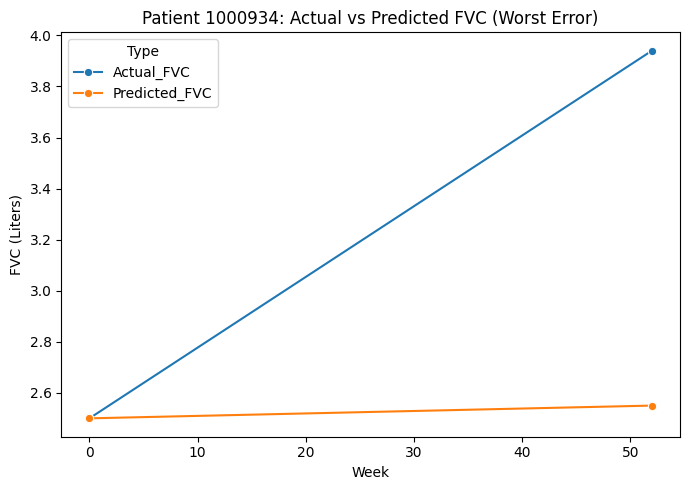

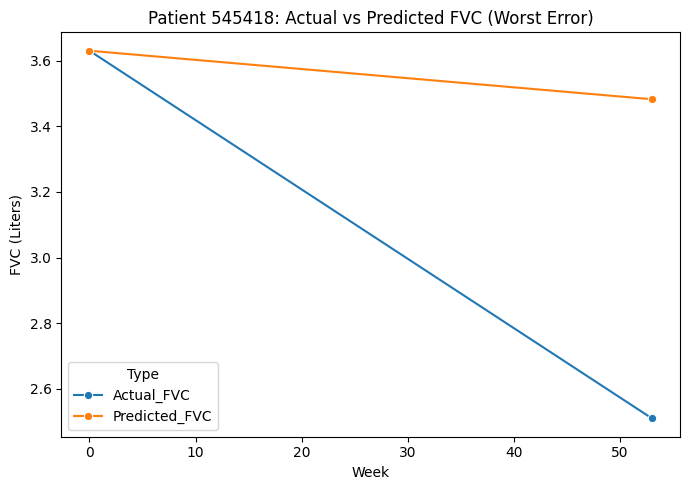

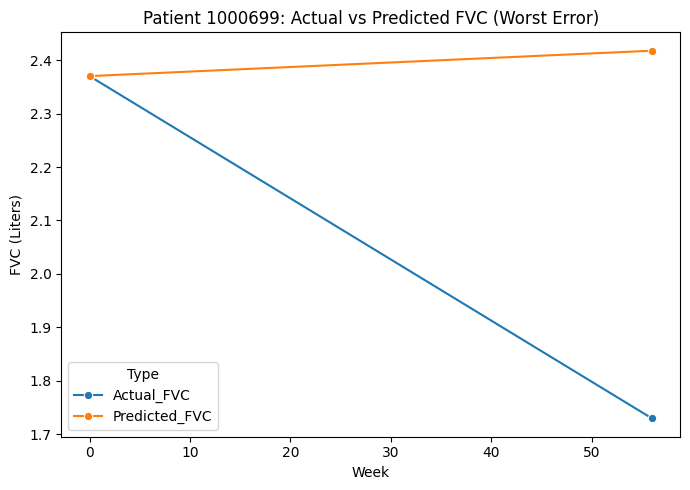

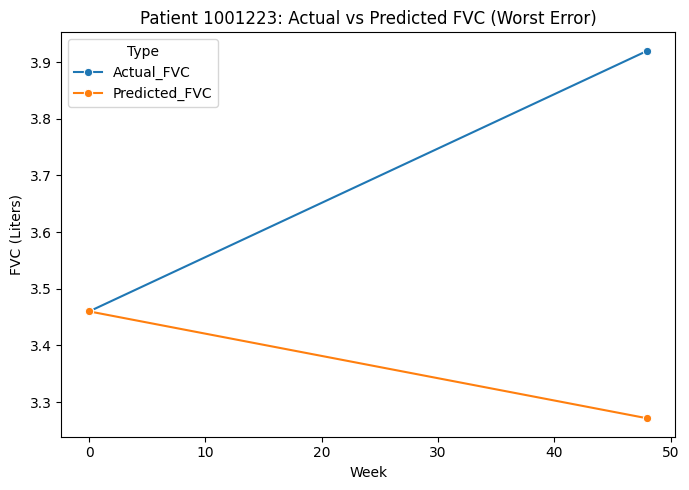

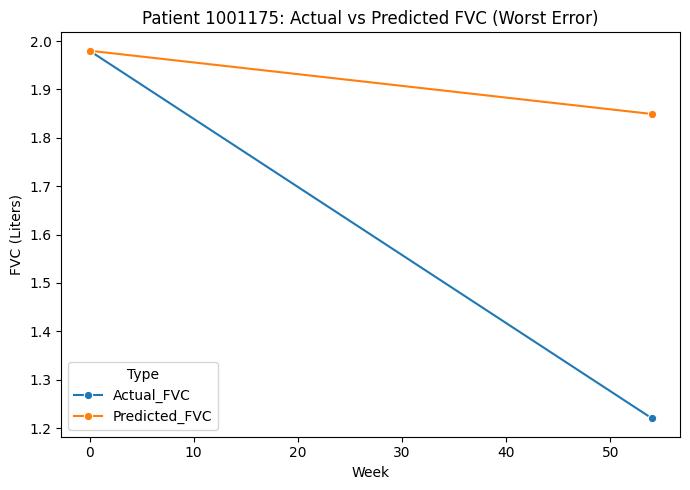


Top 5 patients with increasing FVC and lowest error:
         Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  \
1001370          2.32        2.42       2.412183   0.007817   
1001253          1.43        1.49       1.477075   0.012925   
1000616          1.73        1.75       1.728910   0.021090   
1000971          1.21        1.23       1.269178   0.039178   
1001197          1.18        1.26       1.213874   0.046126   

         Baseline_FVC_Week  Followup_FVC_Week  
1001370                0.0               49.0  
1001253                0.0               54.0  
1000616                0.0               48.0  
1000971                0.0               48.0  
1001197                0.0               48.0  


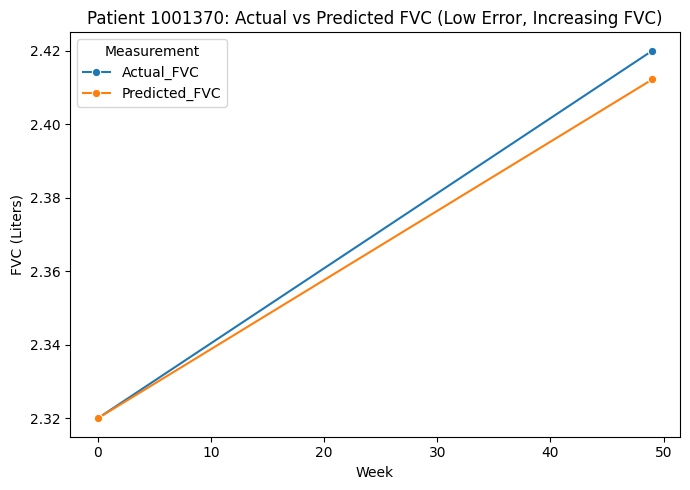

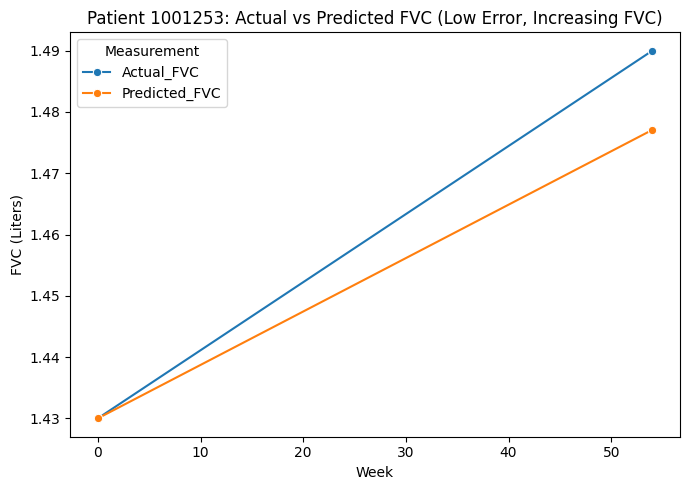

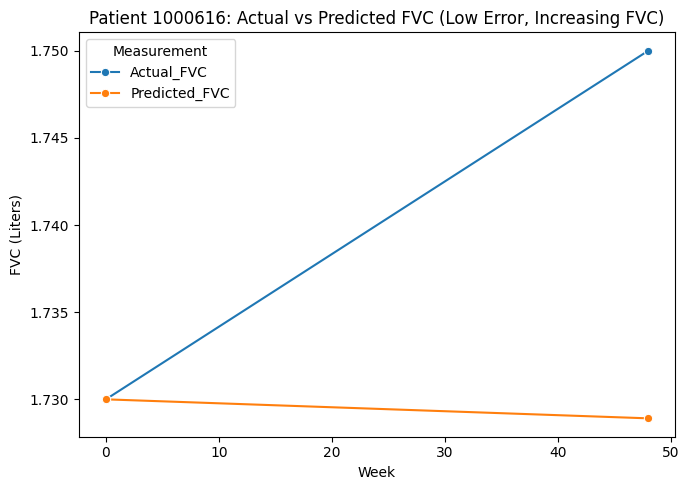

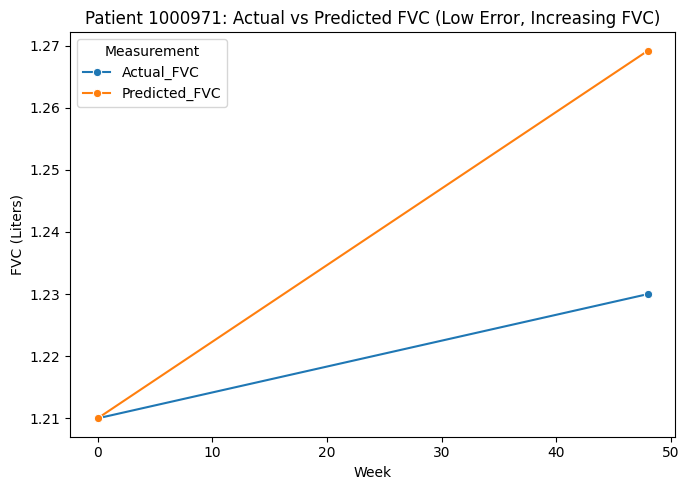

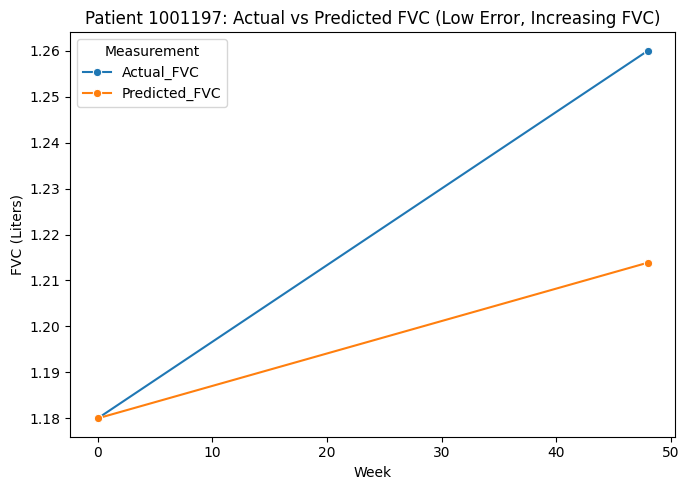

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


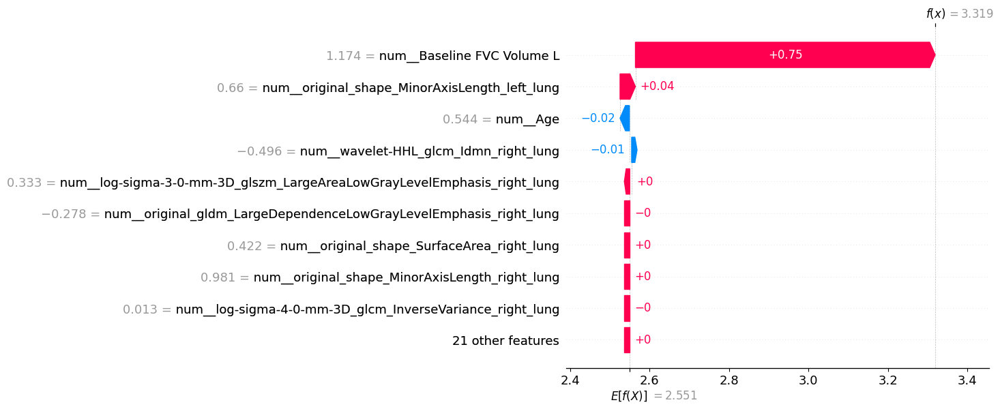

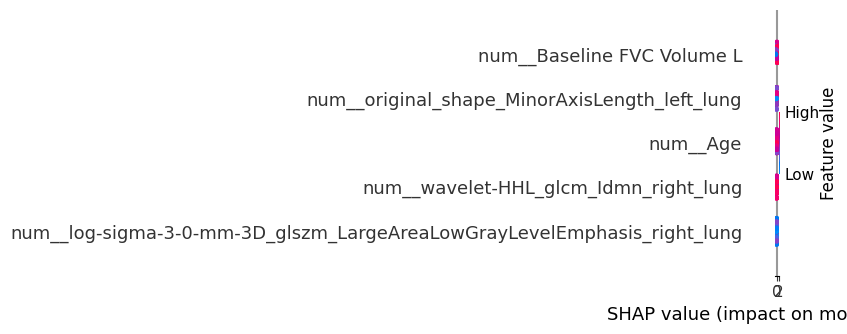

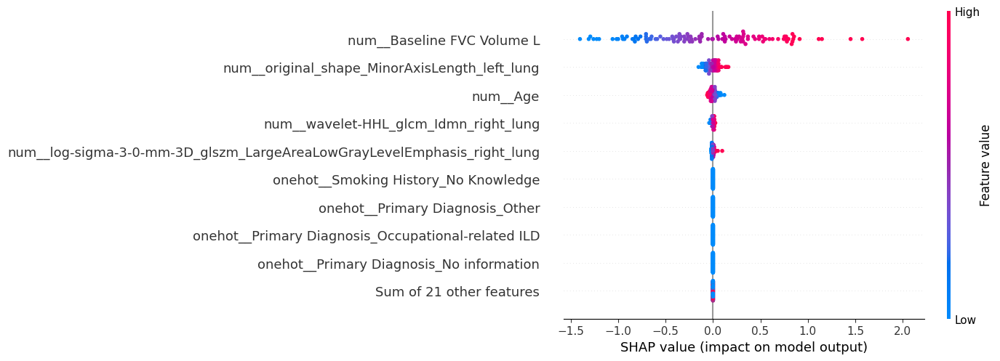

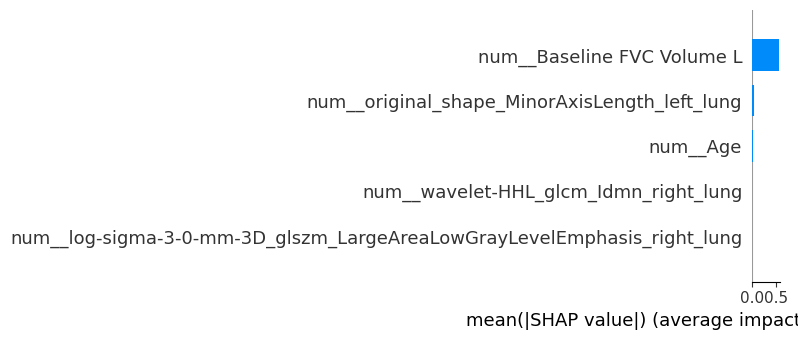

In [20]:
selected_features = ['original_shape_MinorAxisLength_right_lung', 'original_shape_SurfaceArea_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Median_right_lung', 'log-sigma-3-0-mm-3D_glcm_Idmn_right_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung', 'original_shape_MinorAxisLength_left_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung']
Clinical_Contineous_data_ext = selected_features + Clinical_Contineous_data
print(Clinical_Contineous_data_ext)
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_with_clinical_harmonization.pkl")
X_train_clini_log = X_train.copy()
X_test_clini_log  = X_test.copy()

# Transform Age
for col in ['Age']:
    X_train_clini_log[col] = np.log(X_train_clini_log[col])
    X_test_clini_log[col] = np.log(X_test_clini_log[col])

# Median imputation (only needed if missing values exist)
imp_median = SimpleImputer(strategy='median')
imp_median.fit(X_train_clini_log)

X_train_median_filled = pd.DataFrame(
    imp_median.transform(X_train_clini_log),
    columns=X_train_clini_log.columns,
    index=X_train_clini_log.index
)

X_test_median_filled = pd.DataFrame(
    imp_median.transform(X_test_clini_log),
    columns=X_test_clini_log.columns,
    index=X_test_clini_log.index
)
results1 = train_and_evaluate_lasso(X_train_median_filled, X_test_median_filled, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data, model_name="/home/pansurya/OSIC_thesis/LASSO_model/Correlation_based_Using_Target_FVC_with_harmonizationPycombat.pkl")
# print("Running LOOCV experiment...")
# results1 = train_and_evaluate_with_LOOCV(X_train, X_test, y_train, y_test, selected_features, model_name="/home/pansurya/OSIC_thesis/Linear_model/PAM_ANOVA_VIF_LOOCV.pkl")


['original_shape_MinorAxisLength_left_lung', 'wavelet-HLH_gldm_DependenceNonUniformityNormalized_right_lung', 'log-sigma-2-0-mm-3D_firstorder_10Percentile_right_lung', 'original_shape_MinorAxisLength_right_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'original_shape_SurfaceArea_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glcm_InverseVariance_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Kurtosis_left_lung', 'log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung', 'wavelet-LHL_glcm_Idmn_left_lung', 'log-sigma-1-0-mm-3D_firstorder_Skewness_left_lung', 'wavelet-HLL_firstorder_Kurtosis_left_lung', 'Baseline FVC Volume L', 'Age', 'FEV1 Volume L']
Numeric features: ['original_shape_MinorAxisLength_left_lung', 'wavelet-HLH_gldm_Depende

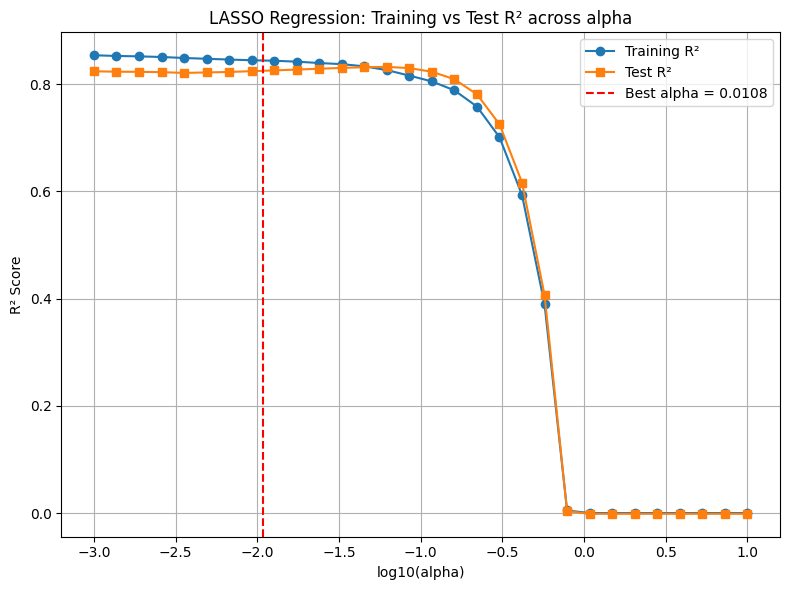

- MLL (adaptive σ): -2.9199

Test set performance:
- MAE:  0.27 L
- MSE:  0.14 L²
- RMSE: 0.38 L
- R²:   0.825

Training set performance:
- MAE:  0.24 L
- MSE:  0.12 L²
- RMSE: 0.34 L
- R²:   0.844

Model coefficients (sorted by |coef|):
                                              Feature  Coefficient
16                              Baseline FVC Volume L     0.657226
35                                         Sex_Female    -0.086854
0            original_shape_MinorAxisLength_left_lung     0.081956
17                                                Age    -0.079994
2   log-sigma-2-0-mm-3D_firstorder_10Percentile_ri...     0.047287
11  log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGra...    -0.025446
4                    wavelet-HHL_glcm_Idmn_right_lung     0.021814
25                              Primary Diagnosis_IPF    -0.012278
10  log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLeve...     0.010881
9   log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevel...     0.009568
3           original_shap

/tmp/ipykernel_1615777/1886070794.py:244: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


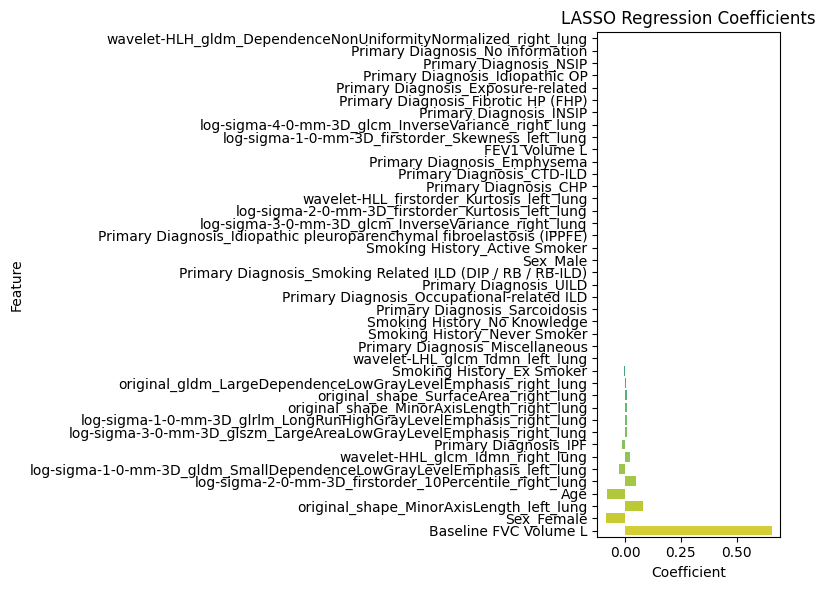

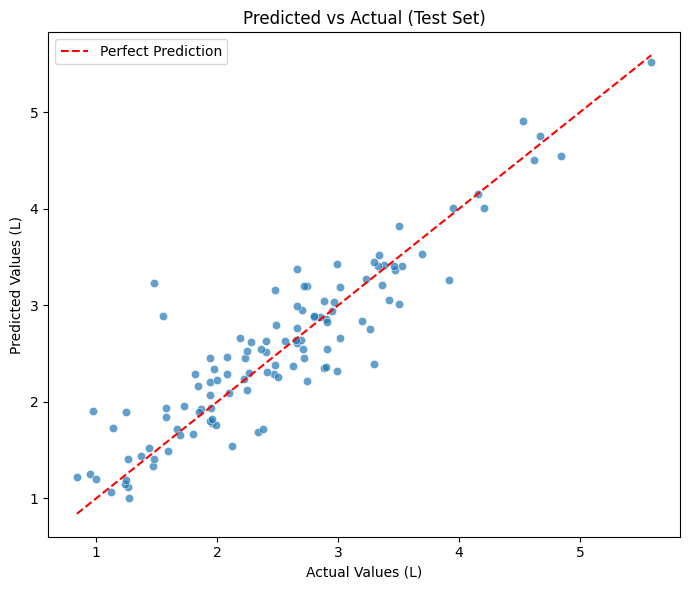

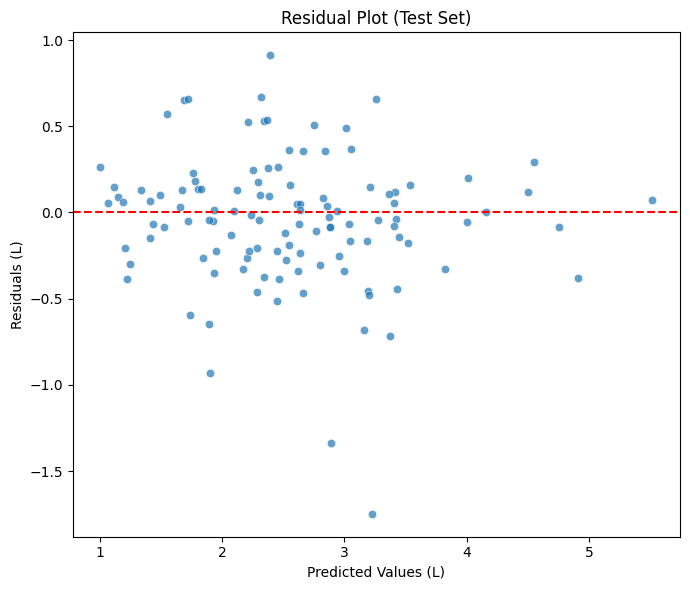


Top 5 patients with largest errors:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
155          3.59        1.48       3.227490   1.747490                0.0   
167          2.93        1.55       2.889619   1.339619                0.0   
79           1.90        0.97       1.903682   0.933682                0.0   
329          2.61        3.30       2.388060   0.911940                0.0   
469          3.50        2.66       3.377098   0.717098                0.0   

     Followup_FVC_Week  
155               53.0  
167               52.0  
79                54.0  
329               56.0  
469               52.0  


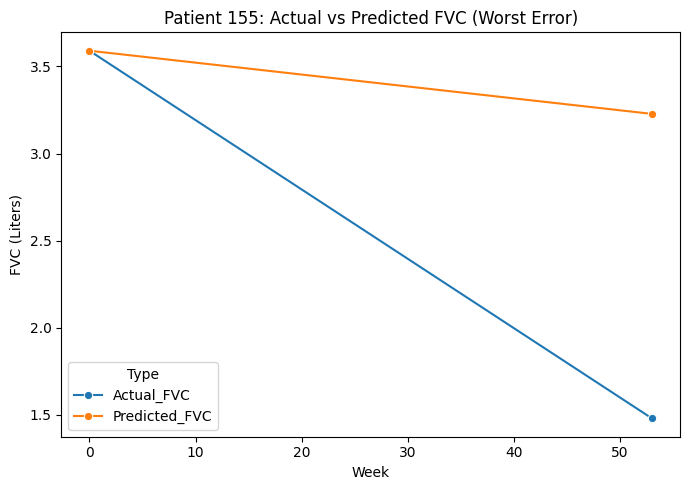

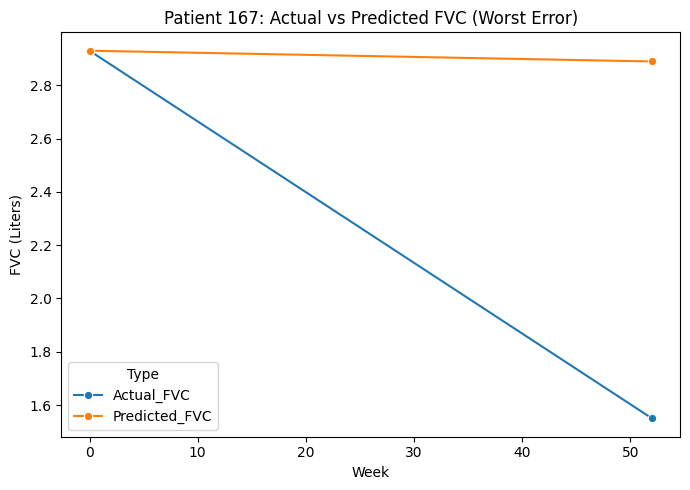

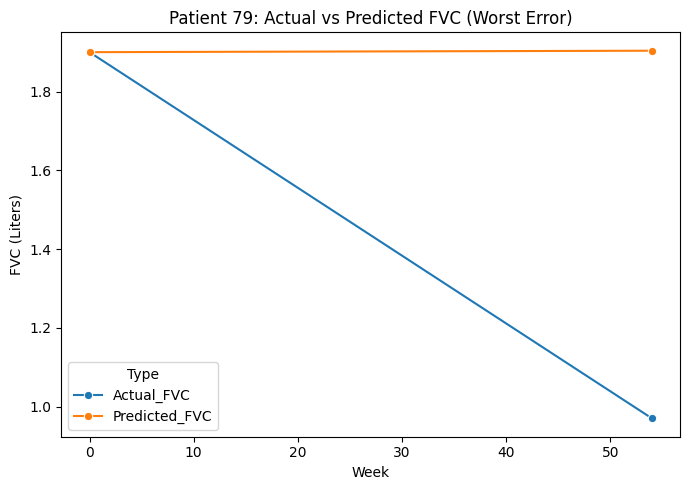

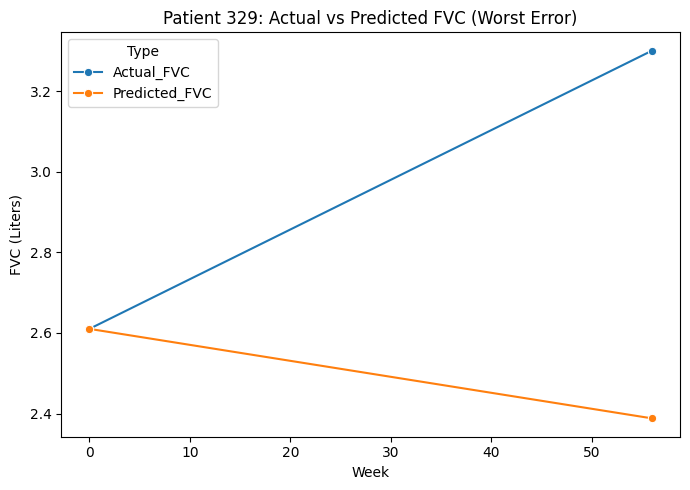

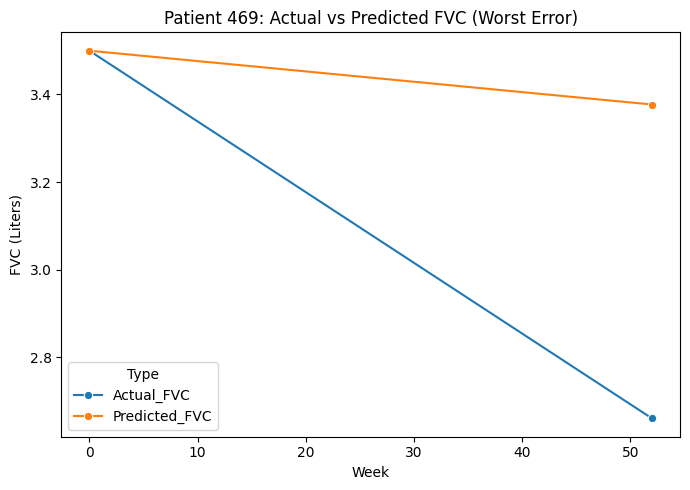


Top 5 patients with increasing FVC and lowest error:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
84           1.58        1.69       1.655327   0.034673                0.0   
148          2.79        2.90       2.861526   0.038474                0.0   
533          2.65        2.66       2.612420   0.047580                0.0   
556          1.43        1.48       1.410472   0.069528                0.0   
382          1.05        1.24       1.149533   0.090467                0.0   

     Followup_FVC_Week  
84                52.0  
148               51.0  
533               52.0  
556               55.0  
382               55.0  


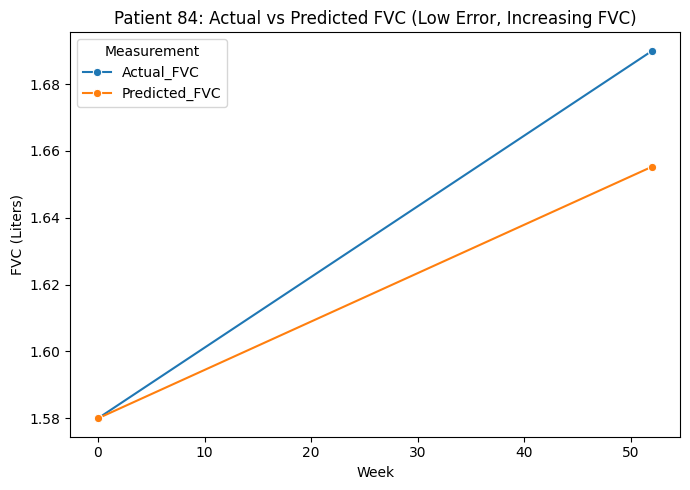

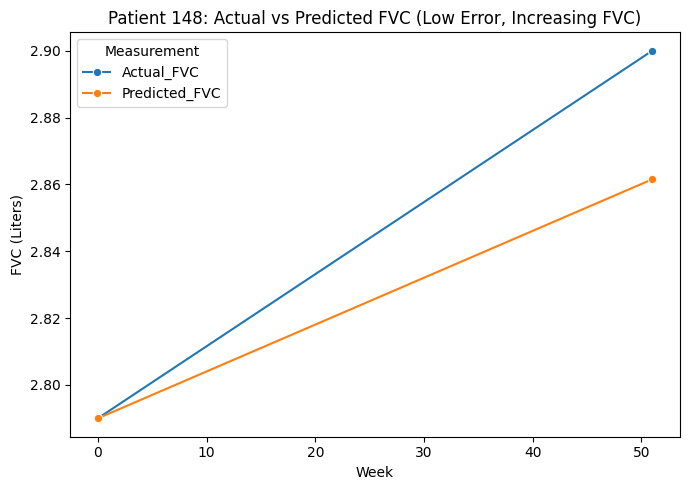

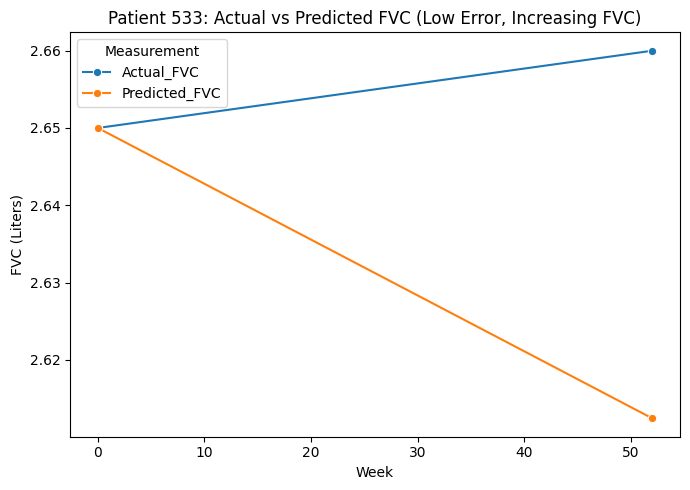

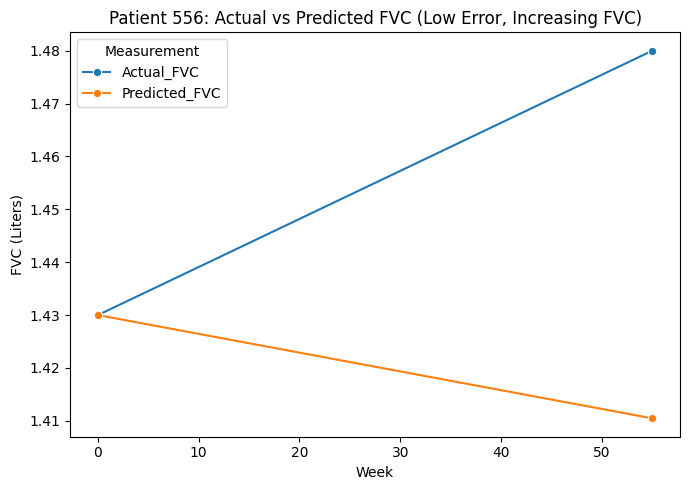

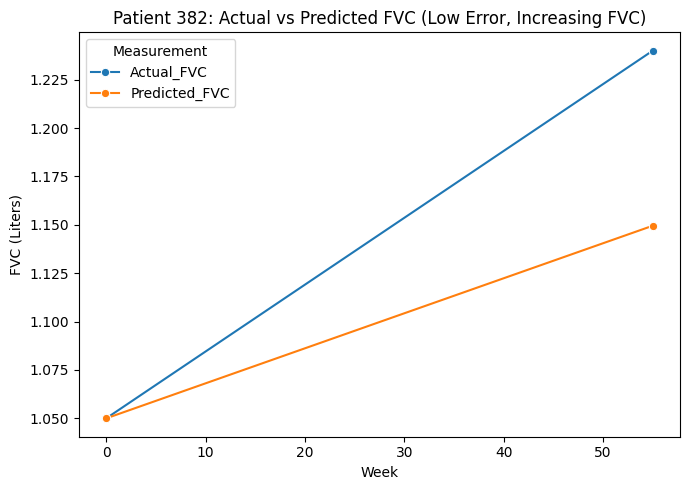

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


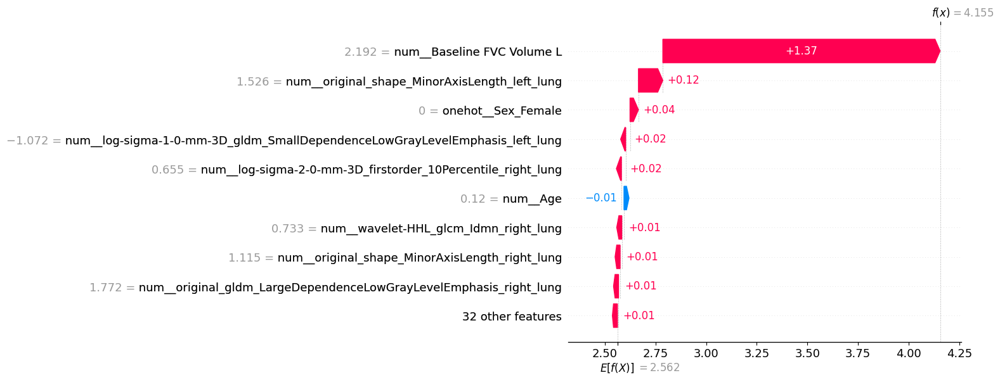

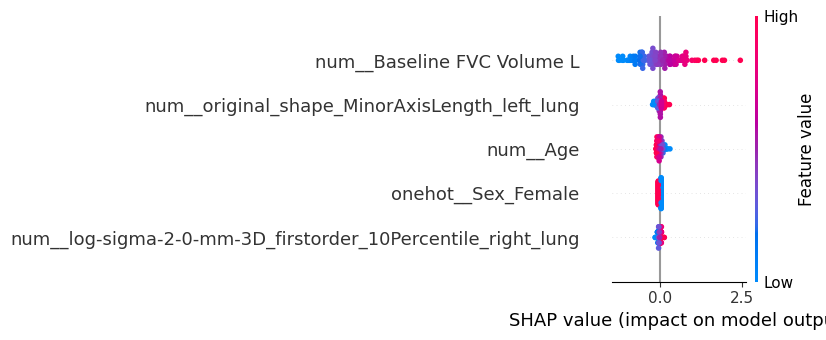

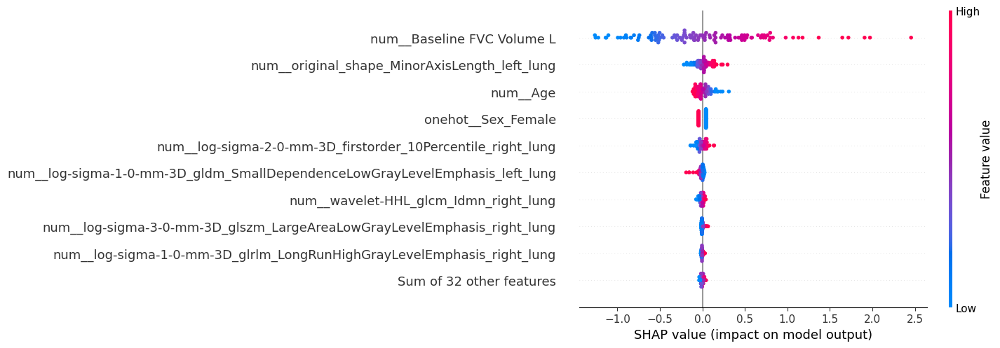

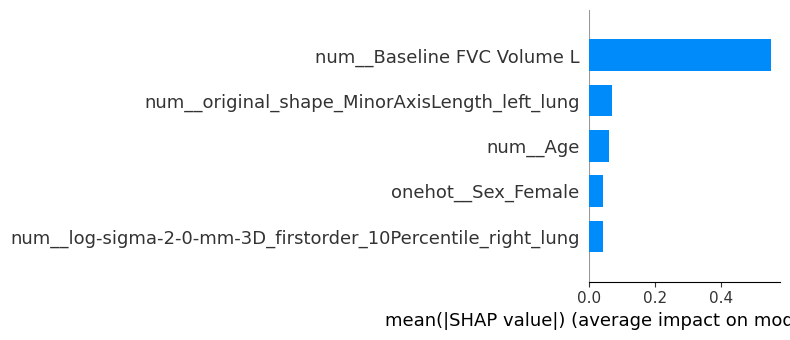

In [29]:
selected_features = ['original_shape_MinorAxisLength_left_lung', 'wavelet-HLH_gldm_DependenceNonUniformityNormalized_right_lung', 'log-sigma-2-0-mm-3D_firstorder_10Percentile_right_lung', 'original_shape_MinorAxisLength_right_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'original_shape_SurfaceArea_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glcm_InverseVariance_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Kurtosis_left_lung', 'log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung', 'wavelet-LHL_glcm_Idmn_left_lung', 'log-sigma-1-0-mm-3D_firstorder_Skewness_left_lung', 'wavelet-HLL_firstorder_Kurtosis_left_lung']
Clinical_Contineous_data_ext = selected_features + Clinical_Contineous_data
print(Clinical_Contineous_data_ext)
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_clinical_without_harmonization.pkl")
X_train_clini_log = X_train.copy()
X_test_clini_log  = X_test.copy()

# Transform Age
for col in ['Age']:
    X_train_clini_log[col] = np.log(X_train_clini_log[col])
    X_test_clini_log[col] = np.log(X_test_clini_log[col])

# Median imputation (only needed if missing values exist)
imp_median = SimpleImputer(strategy='median')
imp_median.fit(X_train_clini_log)

X_train_median_filled = pd.DataFrame(
    imp_median.transform(X_train_clini_log),
    columns=X_train_clini_log.columns,
    index=X_train_clini_log.index
)

X_test_median_filled = pd.DataFrame(
    imp_median.transform(X_test_clini_log),
    columns=X_test_clini_log.columns,
    index=X_test_clini_log.index
)


# Run experiments
results1 = train_and_evaluate_lasso(X_train_median_filled, X_test_median_filled, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data, model_name="/home/pansurya/OSIC_thesis/LASSO_model/Correlation_based_Using_mrmr_without_harmonization.pkl")
# print("Running LOOCV experiment...")
# results1 = train_and_evaluate_with_LOOCV(X_train, X_test, y_train, y_test, selected_features, model_name="/home/pansurya/OSIC_thesis/Linear_model/PAM_ANOVA_VIF_LOOCV.pkl")


['original_shape_MinorAxisLength_left_lung', 'wavelet-HLH_gldm_DependenceNonUniformityNormalized_right_lung', 'log-sigma-2-0-mm-3D_firstorder_10Percentile_right_lung', 'original_shape_MinorAxisLength_right_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'original_shape_SurfaceArea_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glcm_InverseVariance_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Kurtosis_left_lung', 'log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung', 'wavelet-LHL_glcm_Idmn_left_lung', 'log-sigma-1-0-mm-3D_firstorder_Skewness_left_lung', 'wavelet-HLL_firstorder_Kurtosis_left_lung', 'Baseline FVC Volume L', 'Age']
Numeric features: ['original_shape_MinorAxisLength_left_lung', 'wavelet-HLH_gldm_DependenceNonUniformityN

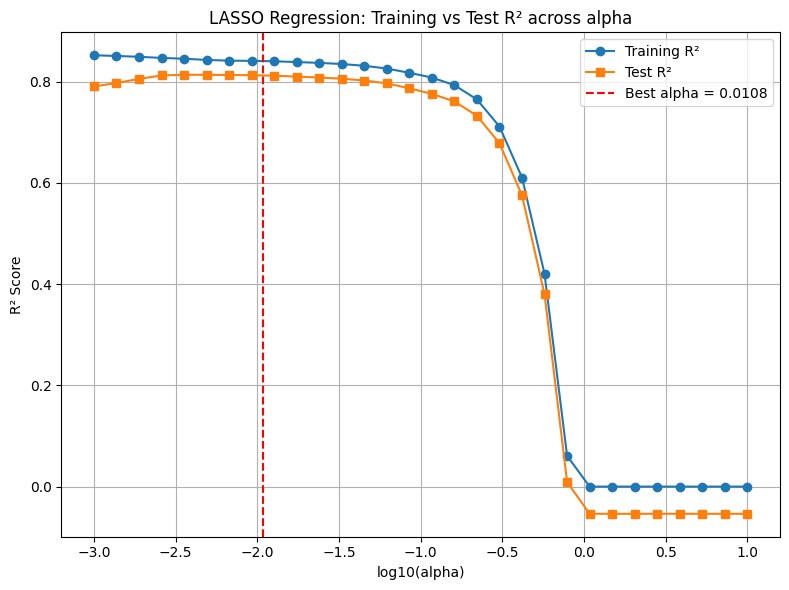

- MLL (adaptive σ): -2.1277

Test set performance:
- MAE:  0.22 L
- MSE:  0.10 L²
- RMSE: 0.32 L
- R²:   0.812

Training set performance:
- MAE:  0.25 L
- MSE:  0.13 L²
- RMSE: 0.36 L
- R²:   0.839

Model coefficients (sorted by |coef|):
                                              Feature  Coefficient
16                              Baseline FVC Volume L     0.698248
17                                                Age    -0.060816
0            original_shape_MinorAxisLength_left_lung     0.052796
11  log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGra...    -0.038234
1   wavelet-HLH_gldm_DependenceNonUniformityNormal...    -0.020843
2   log-sigma-2-0-mm-3D_firstorder_10Percentile_ri...     0.016210
3           original_shape_MinorAxisLength_right_lung     0.013366
18                                           Sex_Male     0.013097
15          wavelet-HLL_firstorder_Kurtosis_left_lung     0.007995
5               original_shape_SurfaceArea_right_lung     0.006009
13                    wav

/tmp/ipykernel_921250/714975100.py:245: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


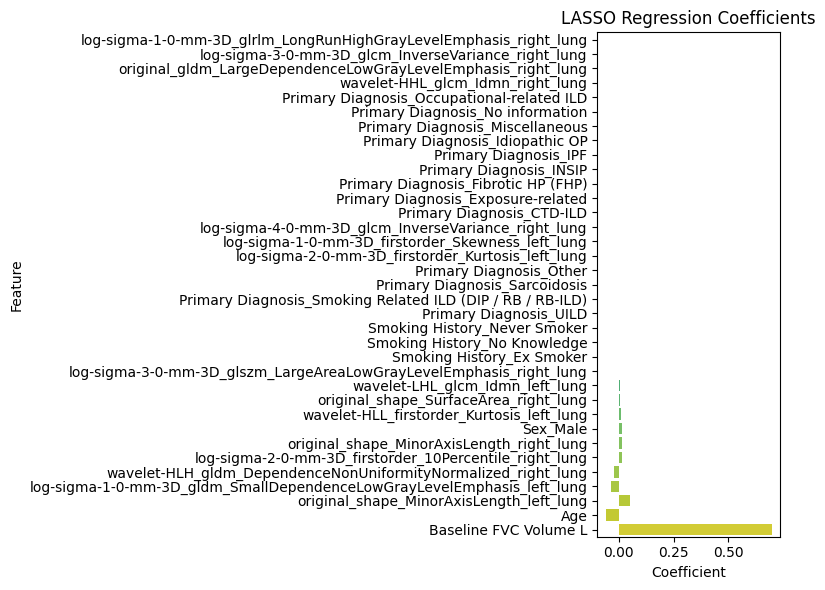

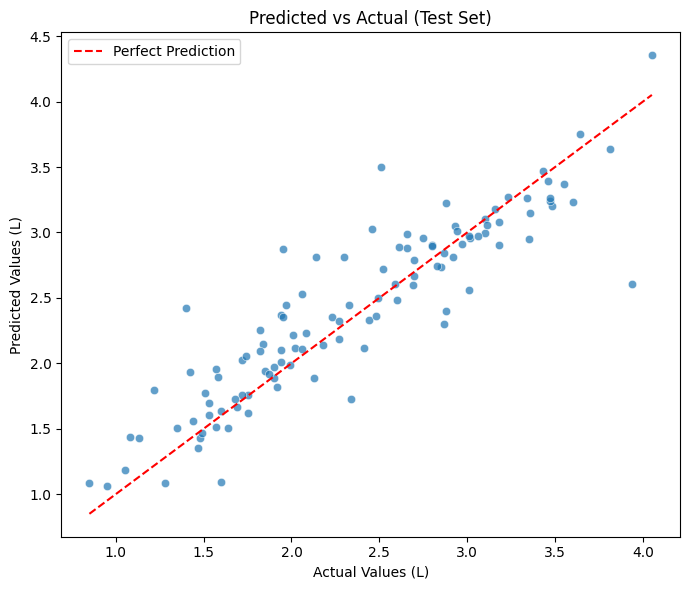

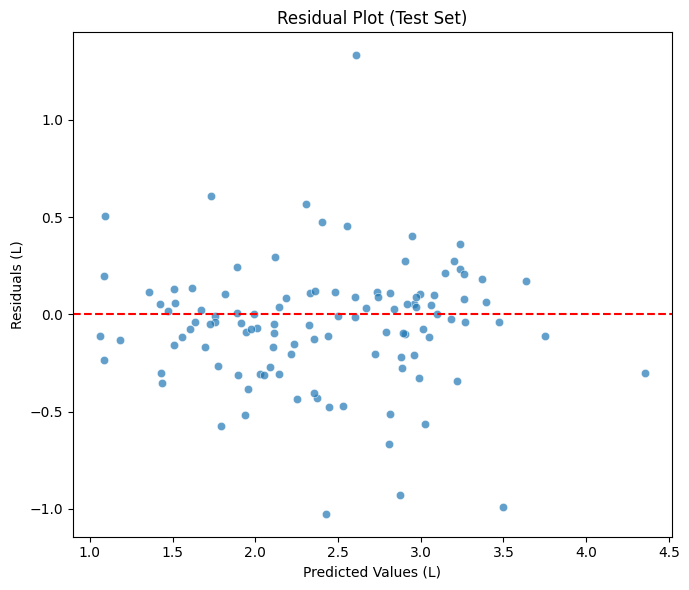


Top 5 patients with largest errors:
         Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  \
1001085          2.50        3.94       2.607035   1.332965   
1000875          2.81        1.40       2.426214   1.026214   
545418           3.63        2.51       3.500077   0.990077   
1000900          2.98        1.95       2.877192   0.927192   
1006459          2.75        2.14       2.809461   0.669461   

         Baseline_FVC_Week  Followup_FVC_Week  
1001085                0.0               48.0  
1000875                0.0               54.0  
545418                 0.0               53.0  
1000900                0.0               52.0  
1006459                0.0               52.0  


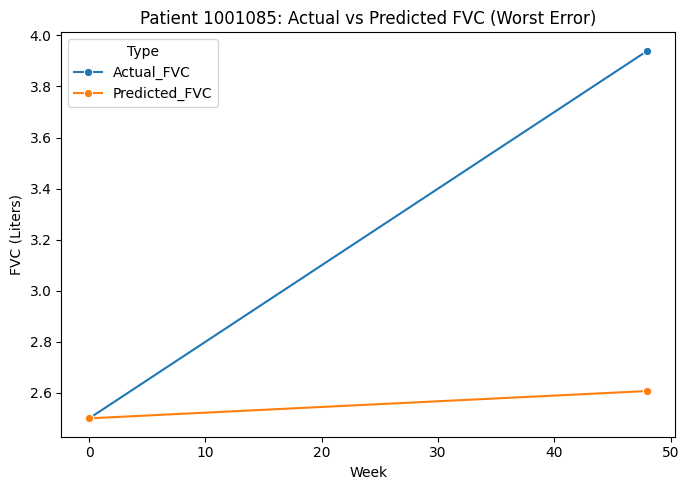

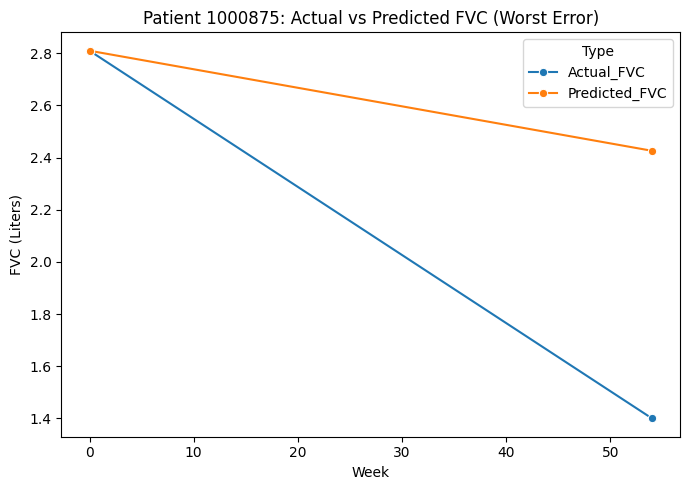

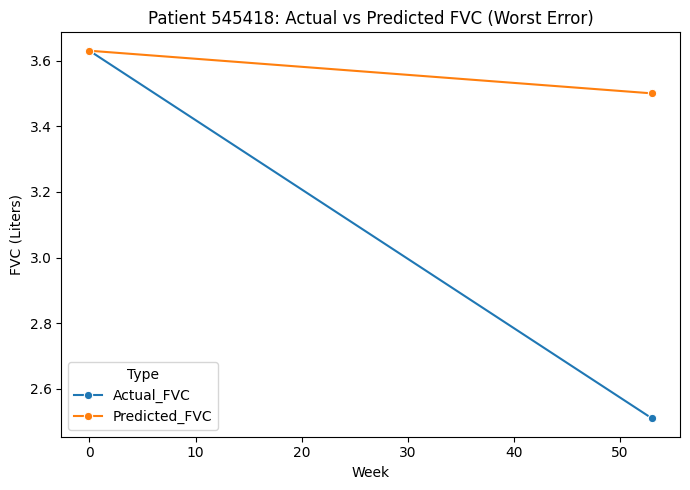

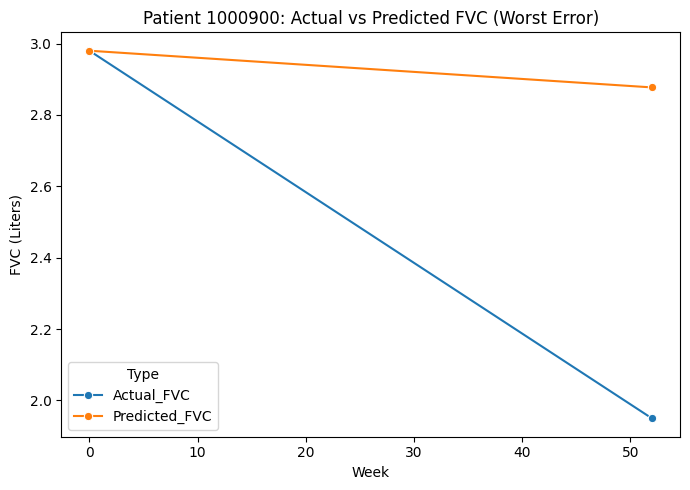

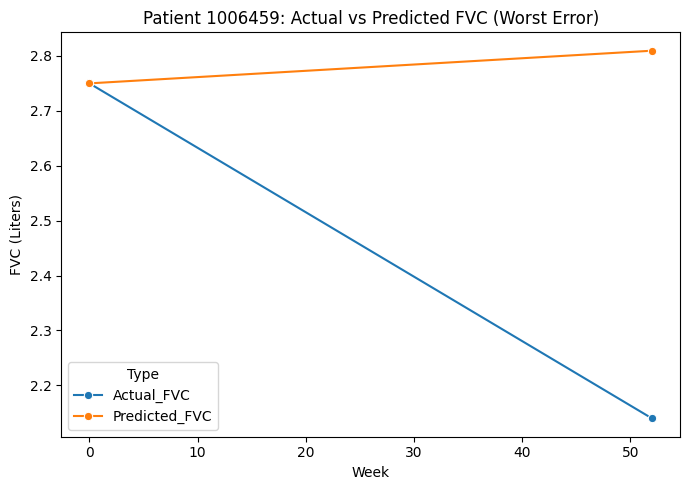


Top 5 patients with increasing FVC and lowest error:
         Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  \
1000616          1.73        1.75       1.756784   0.006784   
1001102          1.69        1.90       1.891499   0.008501   
1001253          1.43        1.49       1.471003   0.018997   
142332           1.67        1.69       1.668972   0.021028   
1002394          2.57        2.70       2.668132   0.031868   

         Baseline_FVC_Week  Followup_FVC_Week  
1000616                0.0               48.0  
1001102                0.0               48.0  
1001253                0.0               54.0  
142332                 0.0               50.0  
1002394                0.0               56.0  


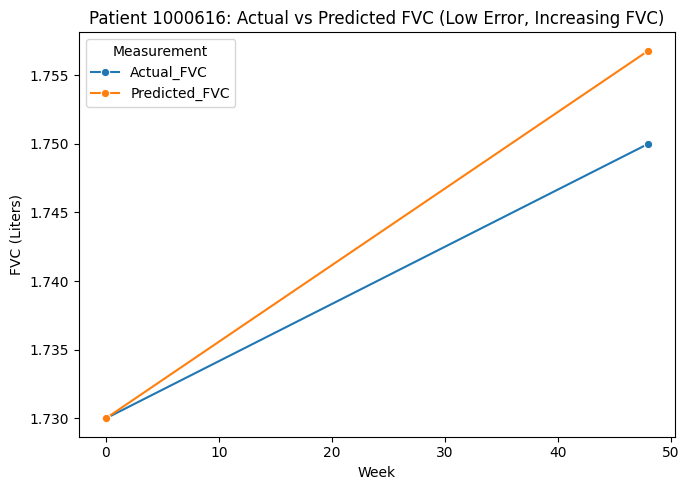

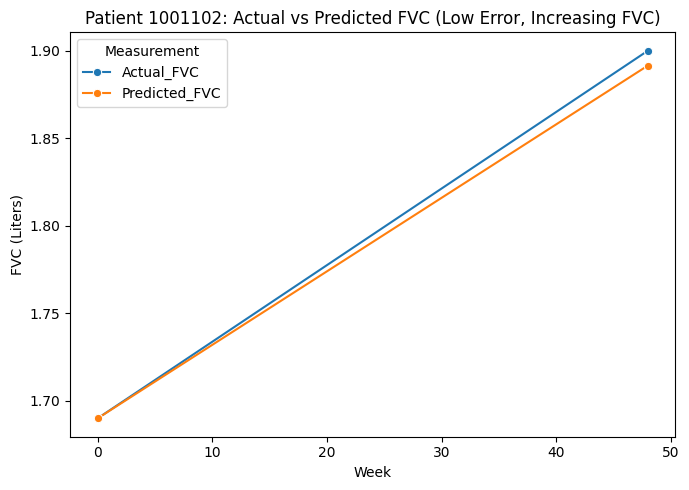

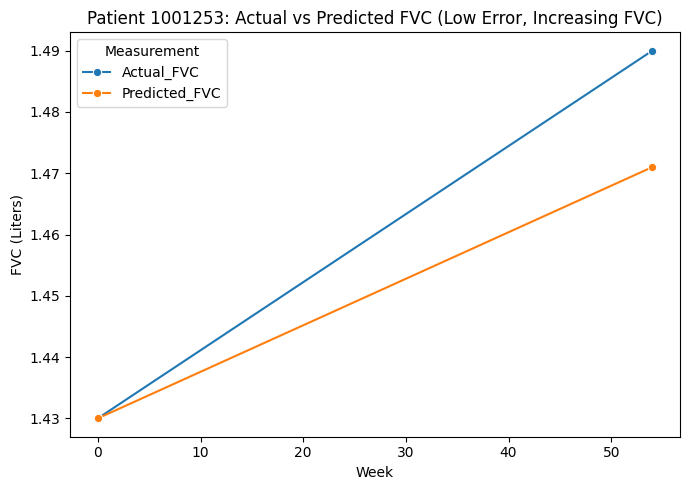

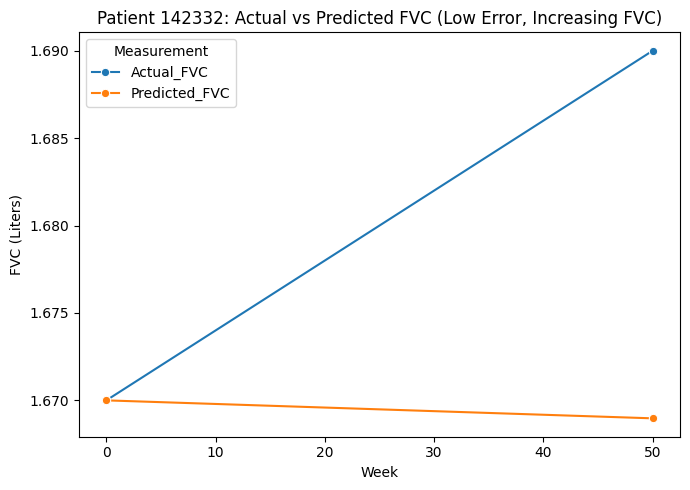

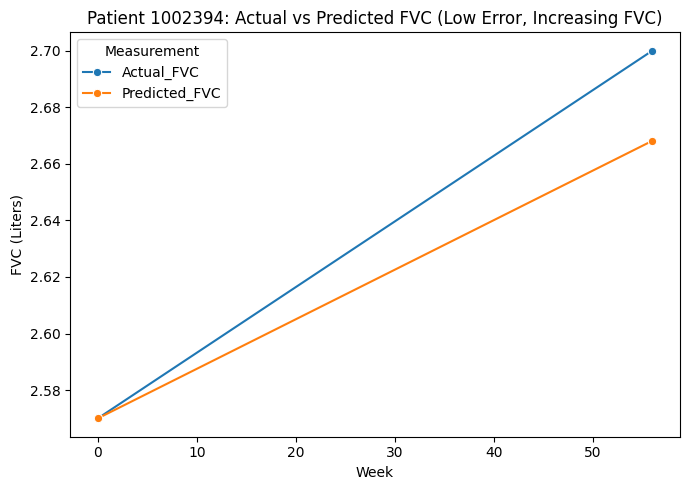

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


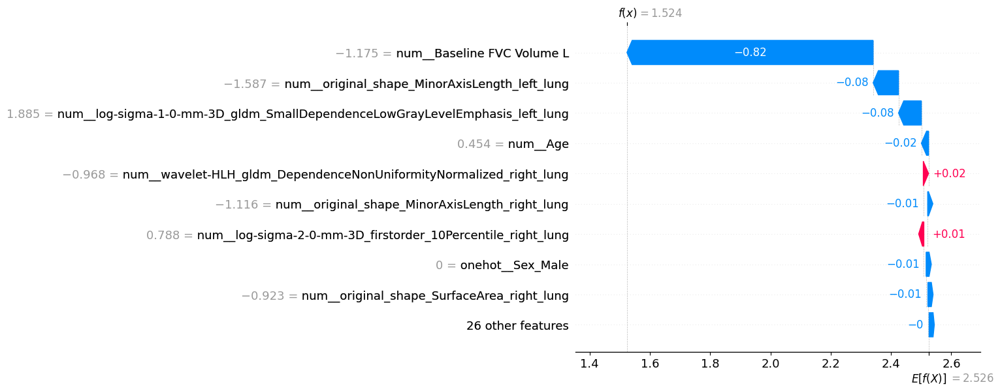

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


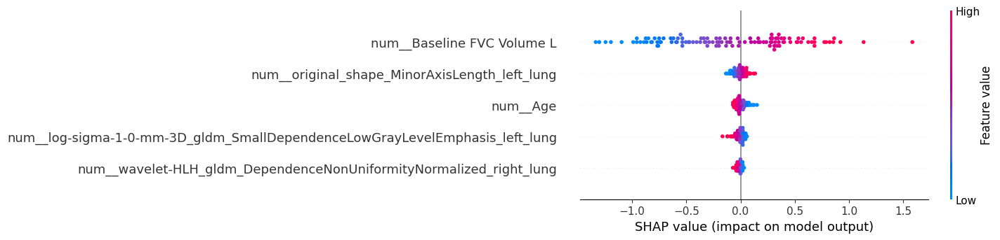

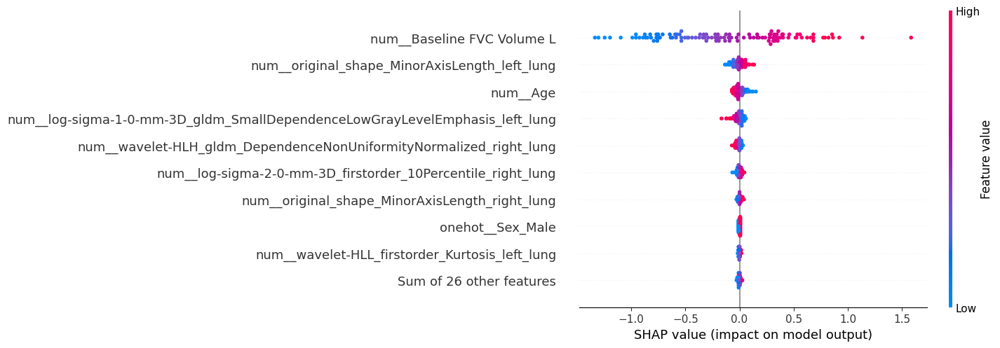

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


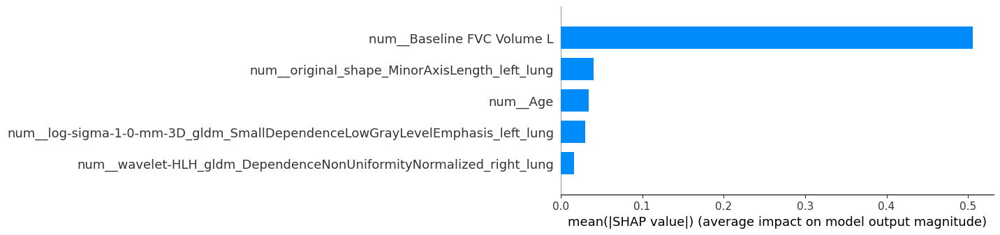

In [14]:
selected_features = ['original_shape_MinorAxisLength_left_lung', 'wavelet-HLH_gldm_DependenceNonUniformityNormalized_right_lung', 'log-sigma-2-0-mm-3D_firstorder_10Percentile_right_lung', 'original_shape_MinorAxisLength_right_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'original_shape_SurfaceArea_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glcm_InverseVariance_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Kurtosis_left_lung', 'log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung', 'wavelet-LHL_glcm_Idmn_left_lung', 'log-sigma-1-0-mm-3D_firstorder_Skewness_left_lung', 'wavelet-HLL_firstorder_Kurtosis_left_lung']
Clinical_Contineous_data_ext = selected_features + Clinical_Contineous_data
print(Clinical_Contineous_data_ext)
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_with_clinical_harmonization.pkl")
X_train_clini_log = X_train.copy()
X_test_clini_log  = X_test.copy()

# Transform Age
for col in ['Age']:
    X_train_clini_log[col] = np.log(X_train_clini_log[col])
    X_test_clini_log[col] = np.log(X_test_clini_log[col])

# Median imputation (only needed if missing values exist)
imp_median = SimpleImputer(strategy='median')
imp_median.fit(X_train_clini_log)

X_train_median_filled = pd.DataFrame(
    imp_median.transform(X_train_clini_log),
    columns=X_train_clini_log.columns,
    index=X_train_clini_log.index
)

X_test_median_filled = pd.DataFrame(
    imp_median.transform(X_test_clini_log),
    columns=X_test_clini_log.columns,
    index=X_test_clini_log.index
)


# Run experiments
results1 = train_and_evaluate_lasso(X_train_median_filled, X_test_median_filled, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data, model_name="/home/pansurya/OSIC_thesis/LASSO_model/Correlation_based_Using_mrmr_without_harmonization.pkl")
# print("Running LOOCV experiment...")
# results1 = train_and_evaluate_with_LOOCV(X_train, X_test, y_train, y_test, selected_features, model_name="/home/pansurya/OSIC_thesis/Linear_model/PAM_ANOVA_VIF_LOOCV.pkl")


In [ ]:
features = ['Baseline FVC Volume L', 'Primary Diagnosis_INSIP',
            'Smoking History_Active Smoker', 'Smoking History_No Knowledge',
            'Sex_Female', 'Primary Diagnosis_Exposure-related',
            'original_gldm_SmallDependenceHighGrayLevelEmphasis_right_lung',
            'original_shape_MinorAxisLength_left_lung', 'Primary Diagnosis_CHP',
            'Age', 'Primary Diagnosis_UILD', 'Primary Diagnosis_IPF',
            'wavelet-LLL_glszm_GrayLevelVariance_left_lung',
            'original_glszm_LargeAreaLowGrayLevelEmphasis_left_lung',
            'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung',
            'Smoking History_Never Smoker', 'FEV1 Volume L',
            'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung', 'Sex_Male','Baseline FVC Volume L', 'original_shape_MinorAxisLength_left_lung', 'Age', 'log-sigma-2-0-mm-3D_firstorder_10Percentile_right_lung', 'FEV1 Volume L', 'log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung', 'Sex_Female', 'wavelet-LHL_glcm_Idmn_left_lung', 'original_shape_MinorAxisLength_right_lung', 'original_shape_SurfaceArea_right_lung', 'Sex_Male', 'Baseline FVC Volume L', 'Age', 'original_shape_MinorAxisLength_left_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'log-sigma-3-0-mm-3D_glcm_Idmn_right_lung', 'Sex_Female', 'FEV1 Volume L', 'original_shape_SurfaceArea_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung', 'Smoking History_Never Smoker', 'Sex_Male',  'Baseline FVC Volume L', 'Sex_Female', 'Age', 'original_firstorder_90Percentile_right_lung', 'wavelet-HLH_ngtdm_Contrast_left_lung', 'log-sigma-2-0-mm-3D_ngtdm_Strength_left_lung', 'wavelet-HHL_ngtdm_Contrast_right_lung', 'log-sigma-3-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'FEV1 Volume L', 'Smoking History_Active Smoker', 'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Energy_left_lung', 'log-sigma-2-0-mm-3D_ngtdm_Coarseness_right_lung', 'Sex_Male',  'Baseline FVC Volume L', 'Primary Diagnosis_INSIP', 'Smoking History_Active Smoker', 'Primary Diagnosis_Exposure-related', 'Smoking History_No Knowledge', 'Primary Diagnosis_Idiopathic OP', 'Sex_Female', 'log-sigma-1-0-mm-3D_firstorder_Maximum_left_lung', 'Age', 'Primary Diagnosis_CHP', 'Primary Diagnosis_IPF', 'wavelet-HHH_firstorder_Mean_left_lung', 'wavelet-LLL_firstorder_Maximum_left_lung', 'wavelet-HHH_glcm_MCC_left_lung', 'wavelet-LHH_glcm_ClusterShade_left_lung', 'Primary Diagnosis_UILD', 'Smoking History_Never Smoker', 'FEV1 Volume L', 'wavelet-LHH_firstorder_Skewness_left_lung', 'wavelet-LHH_firstorder_Mean_left_lung', 'wavelet-HHH_glcm_MCC_right_lung', 'Sex_Male',  'Baseline FVC Volume L', 'original_shape_MinorAxisLength_left_lung', 'Age', 'log-sigma-3-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'wavelet-LLL_glszm_GrayLevelVariance_left_lung', 'FEV1 Volume L', 'original_firstorder_90Percentile_right_lung', 'wavelet-LHL_ngtdm_Busyness_right_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung', 'log-sigma-5-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung', 'original_shape_SurfaceArea_left_lung', 'original_shape_MinorAxisLength_right_lung', 'Sex_Female', 'wavelet-LLL_ngtdm_Contrast_right_lung', 'Sex_Male',  'Baseline FVC Volume L', 'Primary Diagnosis_INSIP', 'Smoking History_Active Smoker', 'Sex_Female', 'Primary Diagnosis_Exposure-related', 'Age', 'Primary Diagnosis_CHP', 'wavelet-LLL_ngtdm_Contrast_right_lung', 'original_shape_MinorAxisLength_left_lung', 'wavelet-HLL_firstorder_Skewness_right_lung', 'original_shape_SurfaceArea_left_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'Primary Diagnosis_IPF', 'FEV1 Volume L', 'Smoking History_No Knowledge', 'Primary Diagnosis_UILD', 'Smoking History_Never Smoker', 'log-sigma-1-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'original_shape_MinorAxisLength_right_lung', 'wavelet-HHL_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'Sex_Male',  'Baseline FVC Volume L', 'Age', 'log-sigma-2-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung', 'original_shape_MinorAxisLength_left_lung', 'Sex_Female', 'FEV1 Volume L', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'original_gldm_SmallDependenceHighGrayLevelEmphasis_right_lung', 'original_firstorder_90Percentile_right_lung', 'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Busyness_right_lung', 'original_firstorder_MeanAbsoluteDeviation_right_lung', 'Sex_Male' ]



unique_features = list(set(features))
print(unique_features)
print(len(unique_features))

['wavelet-HHH_glcm_MCC_right_lung', 'log-sigma-3-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung', 'Primary Diagnosis_CHP', 'wavelet-HHL_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'wavelet-LLL_firstorder_Maximum_left_lung', 'Smoking History_No Knowledge', 'wavelet-LHL_ngtdm_Busyness_right_lung', 'log-sigma-5-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung', 'wavelet-HHH_glcm_MCC_left_lung', 'FEV1 Volume L', 'log-sigma-1-0-mm-3D_firstorder_Maximum_left_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'original_shape_MinorAxisLength_right_lung', 'log-sigma-2-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung', 'original_firstorder_90Percentile_right_lung', 'Primary Diagnosis_INSIP', 'original_shape_MinorAxisLength_left_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'Sex_Male', 'Smoking History_Never Smoker', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEm

In [ ]:
['log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Energy_left_lung', 'wavelet-LLL_glszm_GrayLevelVariance_left_lung', 'wavelet-HHH_glcm_MCC_left_lung', 'log-sigma-1-0-mm-3D_firstorder_Maximum_left_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_lung', 'wavelet-HHL_glszm_LargeAreaHighGrayLevelEmphasis_right_lung',  'original_glszm_LargeAreaLowGrayLevelEmphasis_left_lung', 'log-sigma-5-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung',  'wavelet-HHL_ngtdm_Contrast_right_lung', 'wavelet-LHH_glcm_ClusterShade_left_lung', 'log-sigma-2-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung', 'log-sigma-1-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung',  'wavelet-LHL_ngtdm_Busyness_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Strength_left_lung',  'log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glcm_Idmn_right_lung', 'wavelet-HLH_ngtdm_Contrast_left_lung',  'wavelet-LLL_ngtdm_Contrast_right_lung', 'original_shape_SurfaceArea_left_lung', 'original_firstorder_90Percentile_right_lung',  'original_shape_MinorAxisLength_right_lung', 'original_firstorder_MeanAbsoluteDeviation_right_lung', 'wavelet-HHH_firstorder_Mean_left_lung', 'original_shape_MinorAxisLength_left_lung', 'wavelet-LLL_firstorder_Maximum_left_lung', 'log-sigma-2-0-mm-3D_firstorder_10Percentile_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Busyness_right_lung', 'original_shape_SurfaceArea_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Coarseness_right_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'wavelet-LHH_firstorder_Skewness_left_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'wavelet-LHL_glcm_Idmn_left_lung', 'wavelet-LHH_firstorder_Mean_left_lung', 'wavelet-HLL_firstorder_Skewness_right_lung',  'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung', 'original_gldm_SmallDependenceHighGrayLevelEmphasis_right_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'wavelet-HHH_glcm_MCC_right_lung',  'log-sigma-3-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung']


['log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung',
 'log-sigma-2-0-mm-3D_firstorder_Energy_left_lung',
 'wavelet-LLL_glszm_GrayLevelVariance_left_lung',
 'wavelet-HHH_glcm_MCC_left_lung',
 'log-sigma-1-0-mm-3D_firstorder_Maximum_left_lung',
 'wavelet-HHL_glcm_Idmn_right_lung',
 'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_lung',
 'wavelet-HHL_glszm_LargeAreaHighGrayLevelEmphasis_right_lung',
 'original_glszm_LargeAreaLowGrayLevelEmphasis_left_lung',
 'log-sigma-5-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung',
 'wavelet-HHL_ngtdm_Contrast_right_lung',
 'wavelet-LHH_glcm_ClusterShade_left_lung',
 'log-sigma-2-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung',
 'log-sigma-1-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung',
 'wavelet-LHL_ngtdm_Busyness_right_lung',
 'log-sigma-2-0-mm-3D_ngtdm_Strength_left_lung',
 'log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung',
 'log-sigma-3-0-mm-3D_glcm_Idmn_right_lung',
 'wavelet-HLH_ngtdm_Contrast_lef

['log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Energy_left_lung', 'wavelet-LLL_glszm_GrayLevelVariance_left_lung', 'wavelet-HHH_glcm_MCC_left_lung', 'log-sigma-1-0-mm-3D_firstorder_Maximum_left_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_lung', 'wavelet-HHL_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'original_glszm_LargeAreaLowGrayLevelEmphasis_left_lung', 'log-sigma-5-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung', 'wavelet-HHL_ngtdm_Contrast_right_lung', 'wavelet-LHH_glcm_ClusterShade_left_lung', 'log-sigma-2-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung', 'log-sigma-1-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'wavelet-LHL_ngtdm_Busyness_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Strength_left_lung', 'log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glcm_Idmn_right_lung', 'wavelet-HLH_ngtdm_Contrast_left_lung', 'wavelet-

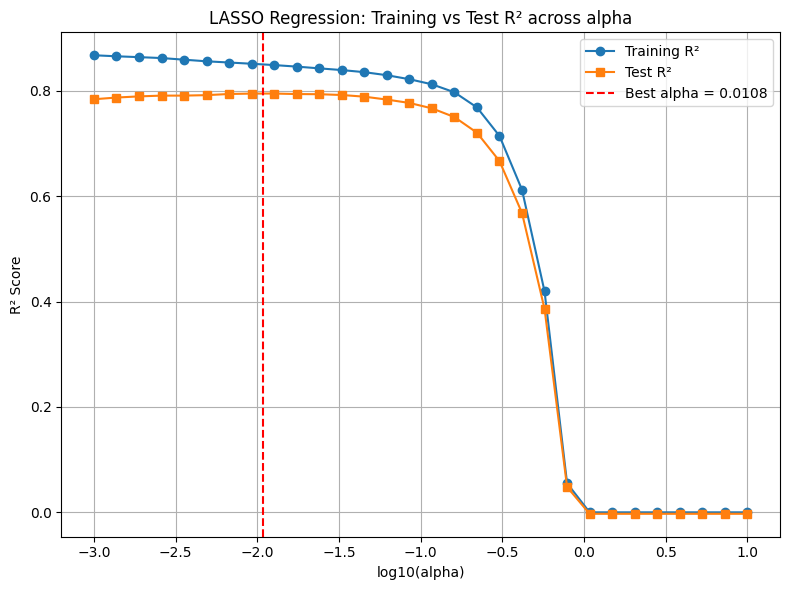


Test set performance:
- MAE:  0.26 L
- MSE:  0.13 L²
- RMSE: 0.36 L
- R²:   0.795

Training set performance:
- MAE:  0.24 L
- MSE:  0.12 L²
- RMSE: 0.35 L
- R²:   0.850

Model coefficients (sorted by |coef|):
                                              Feature  Coefficient
0                               Baseline FVC Volume L     0.698667
1                                                 Age    -0.044254
21               wavelet-HLH_ngtdm_Contrast_left_lung     0.043867
28           original_shape_MinorAxisLength_left_lung     0.043718
63                                         Sex_Female    -0.037970
..                                                ...          ...
61  Primary Diagnosis_Smoking Related ILD (DIP / R...     0.000000
65                      Smoking History_Active Smoker     0.000000
66                          Smoking History_Ex Smoker    -0.000000
67                       Smoking History_Never Smoker    -0.000000
68                       Smoking History_No Knowledge

/tmp/ipykernel_1056000/2565438781.py:217: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


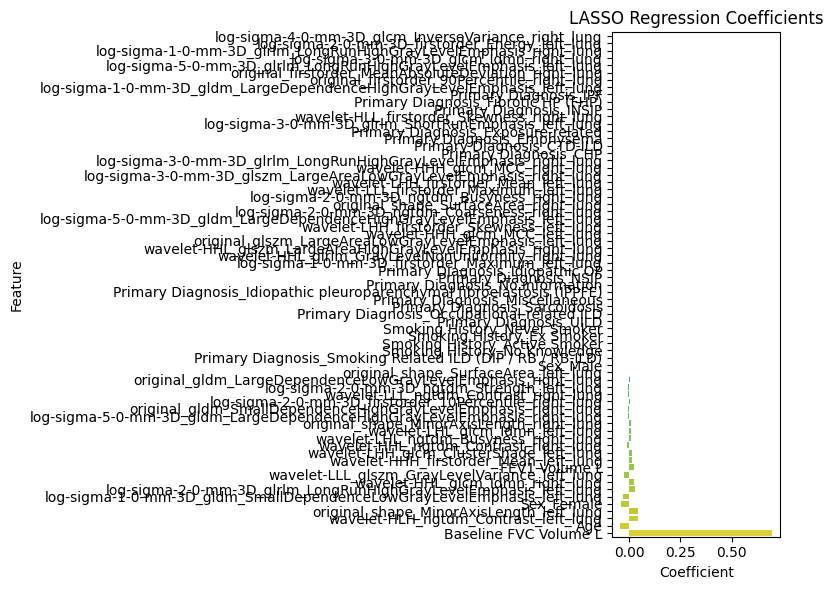

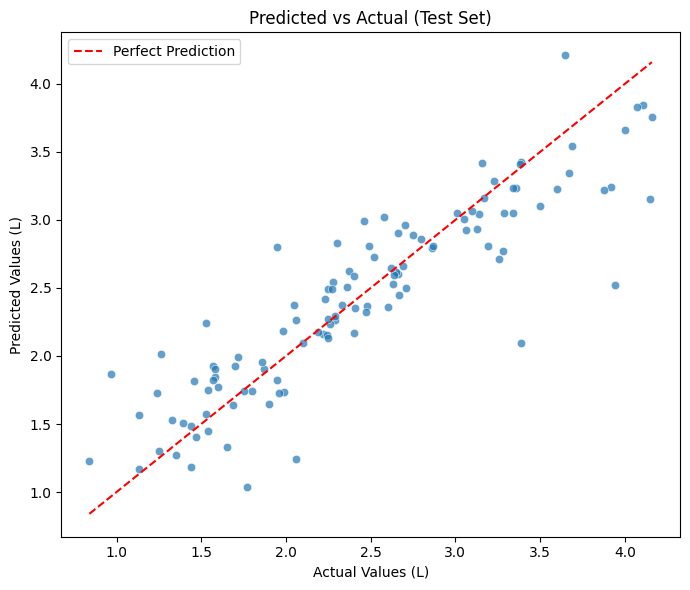

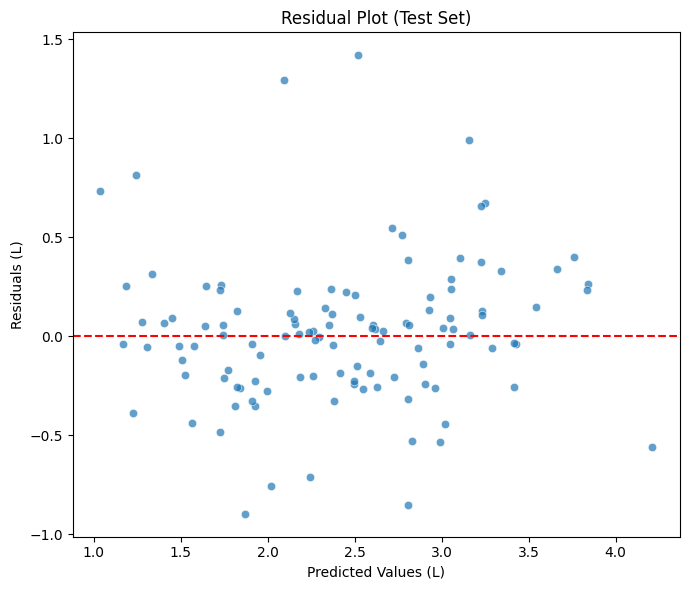


Top 5 patients with largest errors:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
204          2.50        3.94       2.520248   1.419752                  0   
148          2.09        3.39       2.093070   1.296930                  0   
494          3.04        4.15       3.157514   0.992486                  0   
78           1.90        0.97       1.866385   0.896385                  0   
407          2.98        1.95       2.803154   0.853154                  0   

     Followup_FVC_Week  
204               52.0  
148               50.0  
494               54.0  
78                54.0  
407               52.0  


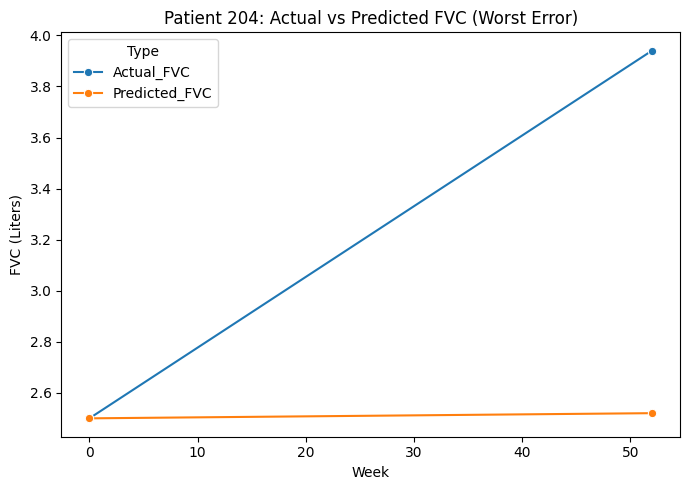

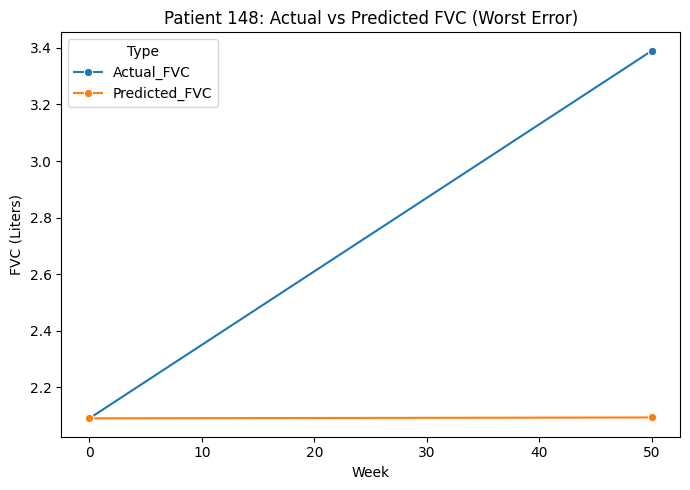

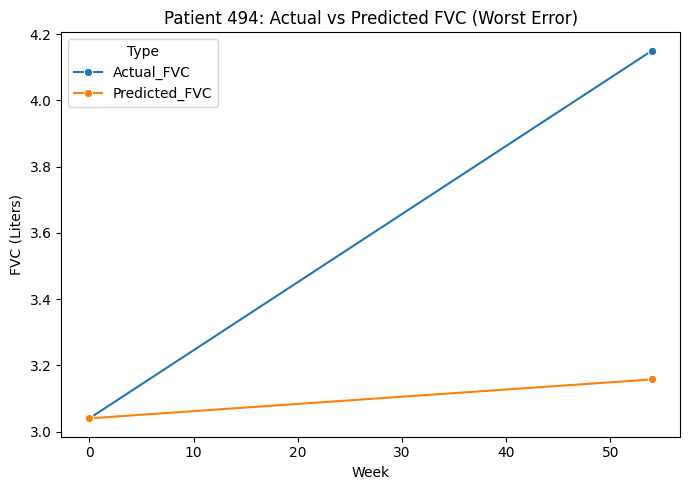

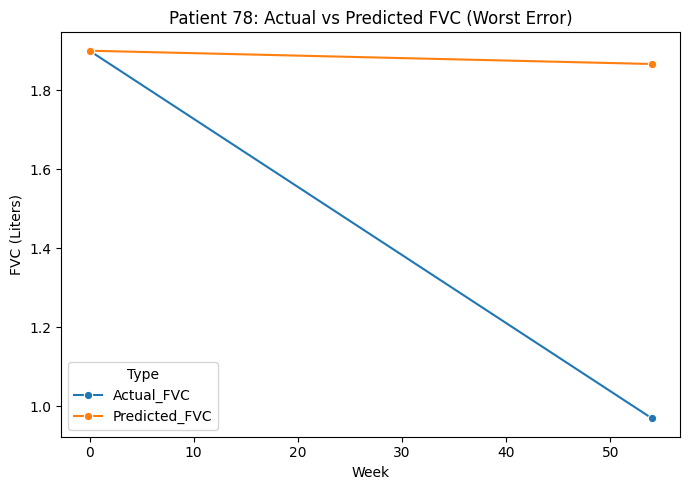

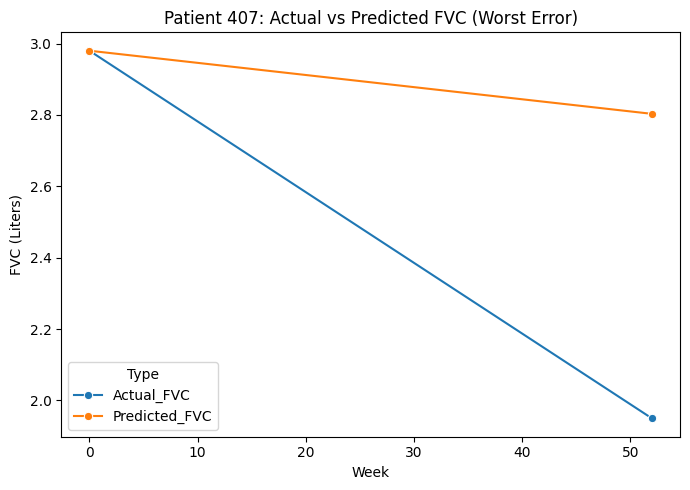


Top 5 patients with increasing FVC and lowest error:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
356          1.73        1.75       1.744391   0.005609                  0   
468          2.10        2.25       2.268298   0.018298                  0   
83           1.58        1.69       1.637564   0.052436                  0   
526          2.65        2.66       2.602016   0.057984                  0   
101          2.58        2.86       2.792005   0.067995                  0   

     Followup_FVC_Week  
356               48.0  
468               53.0  
83                52.0  
526               52.0  
101               48.0  


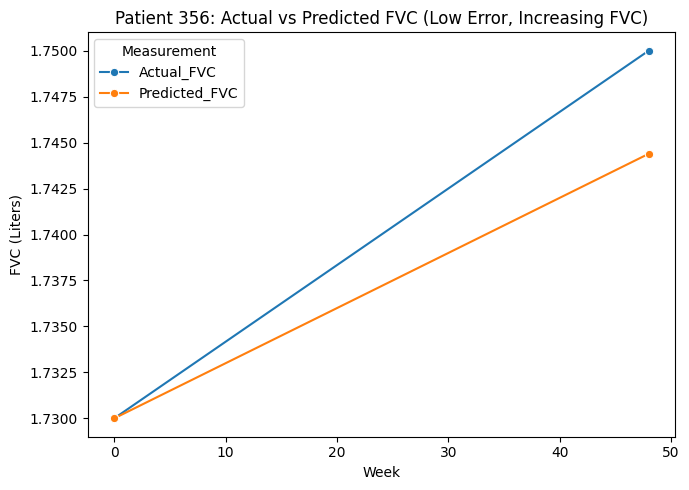

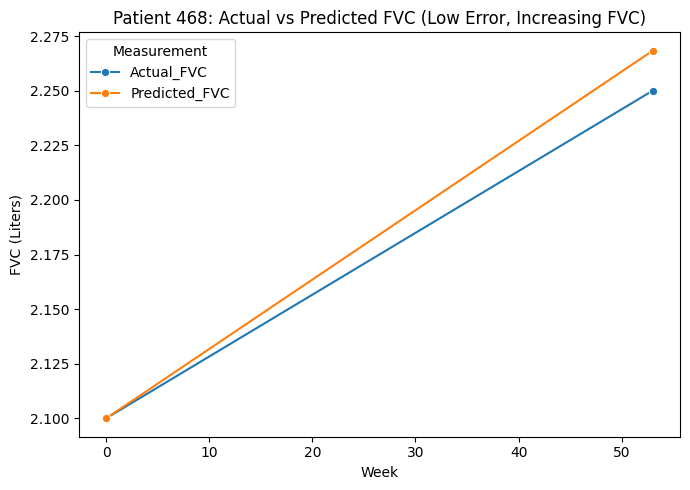

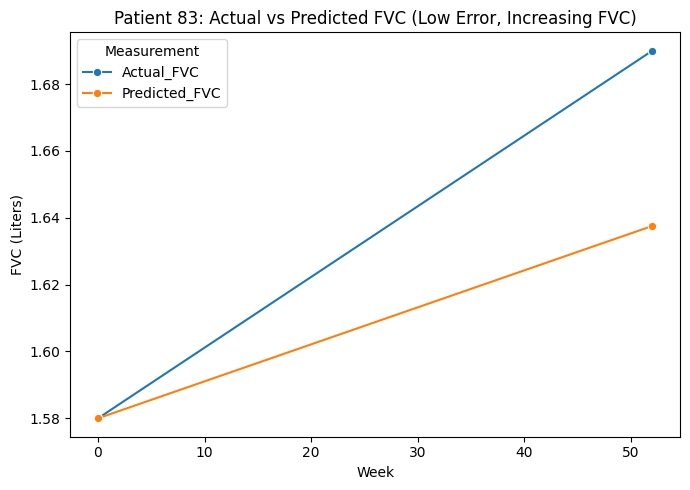

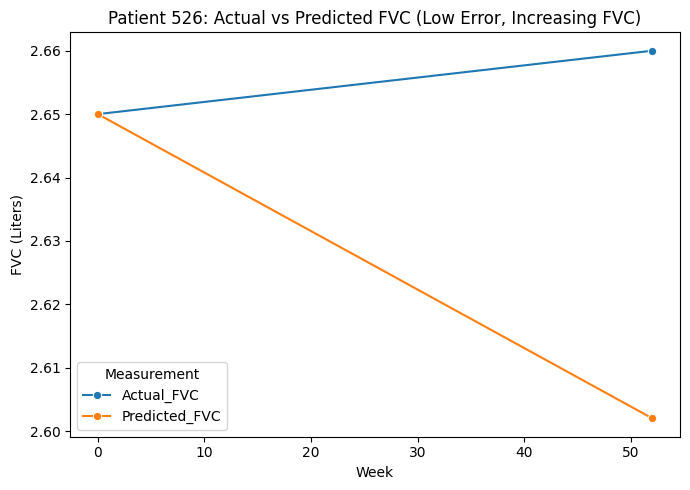

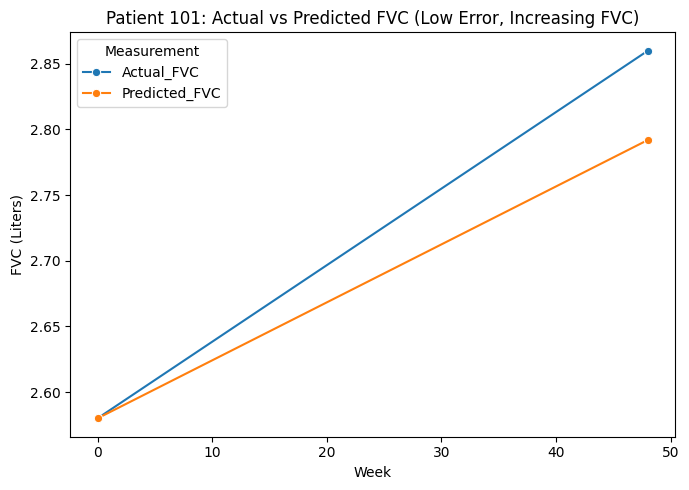

In [ ]:
selected_features = ['log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung',
 'log-sigma-2-0-mm-3D_firstorder_Energy_left_lung',
 'wavelet-LLL_glszm_GrayLevelVariance_left_lung',
 'wavelet-HHH_glcm_MCC_left_lung',
 'log-sigma-1-0-mm-3D_firstorder_Maximum_left_lung',
 'wavelet-HHL_glcm_Idmn_right_lung',
 'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_lung',
 'wavelet-HHL_glszm_LargeAreaHighGrayLevelEmphasis_right_lung',
 'original_glszm_LargeAreaLowGrayLevelEmphasis_left_lung',
 'log-sigma-5-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung',
 'wavelet-HHL_ngtdm_Contrast_right_lung',
 'wavelet-LHH_glcm_ClusterShade_left_lung',
 'log-sigma-2-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung',
 'log-sigma-1-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung',
 'wavelet-LHL_ngtdm_Busyness_right_lung',
 'log-sigma-2-0-mm-3D_ngtdm_Strength_left_lung',
 'log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung',
 'log-sigma-3-0-mm-3D_glcm_Idmn_right_lung',
 'wavelet-HLH_ngtdm_Contrast_left_lung',
 'wavelet-LLL_ngtdm_Contrast_right_lung',
 'original_shape_SurfaceArea_left_lung',
 'original_firstorder_90Percentile_right_lung',
 'original_shape_MinorAxisLength_right_lung',
 'original_firstorder_MeanAbsoluteDeviation_right_lung',
 'wavelet-HHH_firstorder_Mean_left_lung',
 'original_shape_MinorAxisLength_left_lung',
 'wavelet-LLL_firstorder_Maximum_left_lung',
 'log-sigma-2-0-mm-3D_firstorder_10Percentile_right_lung',
 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung',
 'log-sigma-2-0-mm-3D_ngtdm_Busyness_right_lung',
 'original_shape_SurfaceArea_right_lung',
 'log-sigma-2-0-mm-3D_ngtdm_Coarseness_right_lung',
 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung',
 'wavelet-LHH_firstorder_Skewness_left_lung',
 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung',
 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung',
 'wavelet-LHL_glcm_Idmn_left_lung',
 'wavelet-LHH_firstorder_Mean_left_lung',
 'wavelet-HLL_firstorder_Skewness_right_lung',
 'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung',
 'original_gldm_SmallDependenceHighGrayLevelEmphasis_right_lung',
 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung',
 'wavelet-HHH_glcm_MCC_right_lung',
 'log-sigma-3-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung']
Clinical_Contineous_data_ext = Clinical_Contineous_data + selected_features
print(selected_features)
X_train, X_test, y_train, y_test = joblib.load("data_splits.pkl")
# Subset features
X_train_sel = X_train[selected_features]
X_test_sel = X_test[selected_features]
print(X_train_sel.shape)
print(X_test_sel.shape)
# Run experiments
results1 = train_and_evaluate_lasso(X_train, X_test, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data, model_name="/home/pansurya/OSIC_thesis/Linear_model/Selected_features _from_all_methods.pkl")
# print("Running LOOCV experiment...")
# results1 = train_and_evaluate_with_LOOCV(X_train, X_test, y_train, y_test, selected_features, model_name="/home/pansurya/OSIC_thesis/Linear_model/PAM_ANOVA_VIF_LOOCV.pkl")


['Baseline FVC Volume L', 'Age', 'FEV1 Volume L', 'original_shape_MinorAxisLength_left_lung', 'wavelet-HLH_ngtdm_Contrast_left_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung', 'log-sigma-2-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'wavelet-LLL_glszm_GrayLevelVariance_left_lung', 'wavelet-HHH_firstorder_Mean_left_lung', 'wavelet-LHH_glcm_ClusterShade_left_lung', 'wavelet-HHL_ngtdm_Contrast_right_lung', 'wavelet-LHL_ngtdm_Busyness_right_lung', 'wavelet-LHL_glcm_Idmn_left_lung', 'original_shape_MinorAxisLength_right_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'original_gldm_SmallDependenceHighGrayLevelEmphasis_right_lung', 'log-sigma-2-0-mm-3D_firstorder_10Percentile_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Strength_left_lung', 'wavelet-LLL_ngtdm_Contrast_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'original_shape_SurfaceArea_left_lung']
(


Best alpha chosen by LassoCV: 0.005298


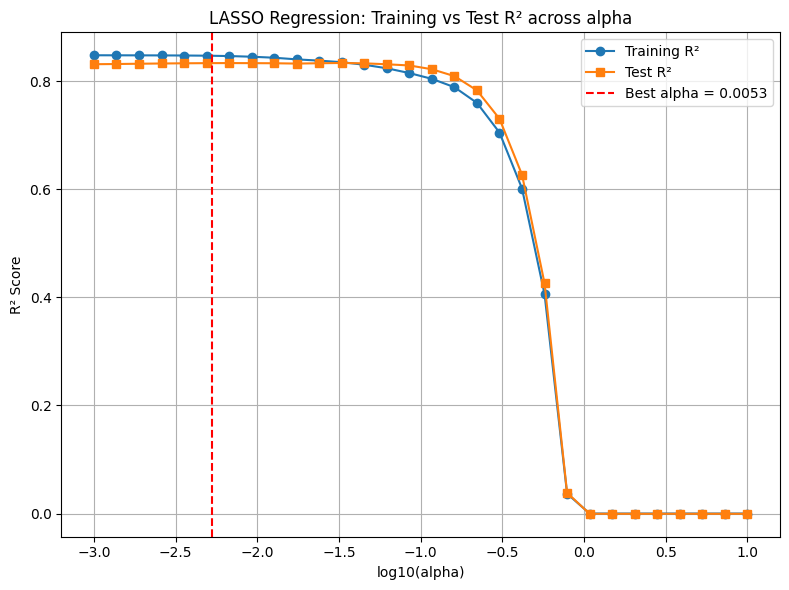

- MLL (adaptive σ): -2.2942

Test set performance:
- MAE:  0.24 L
- MSE:  0.12 L²
- RMSE: 0.34 L
- R²:   0.833

Training set performance:
- MAE:  0.24 L
- MSE:  0.12 L²
- RMSE: 0.35 L
- R²:   0.843

Model coefficients (sorted by |coef|):
                                              Feature   Coefficient
0                               Baseline FVC Volume L  6.593522e-01
3            original_shape_MinorAxisLength_left_lung  6.561224e-02
1                                                 Age -5.058576e-02
21               original_shape_SurfaceArea_left_lung  3.890255e-02
22                                         Sex_Female -3.800755e-02
5   log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGra... -3.555903e-02
9               wavelet-HHH_firstorder_Mean_left_lung  3.093321e-02
4                wavelet-HLH_ngtdm_Contrast_left_lung  2.963067e-02
11              wavelet-HHL_ngtdm_Contrast_right_lung -2.723275e-02
17  log-sigma-2-0-mm-3D_firstorder_10Percentile_ri...  2.258945e-02
8       wavele

/tmp/ipykernel_3654996/1886070794.py:244: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


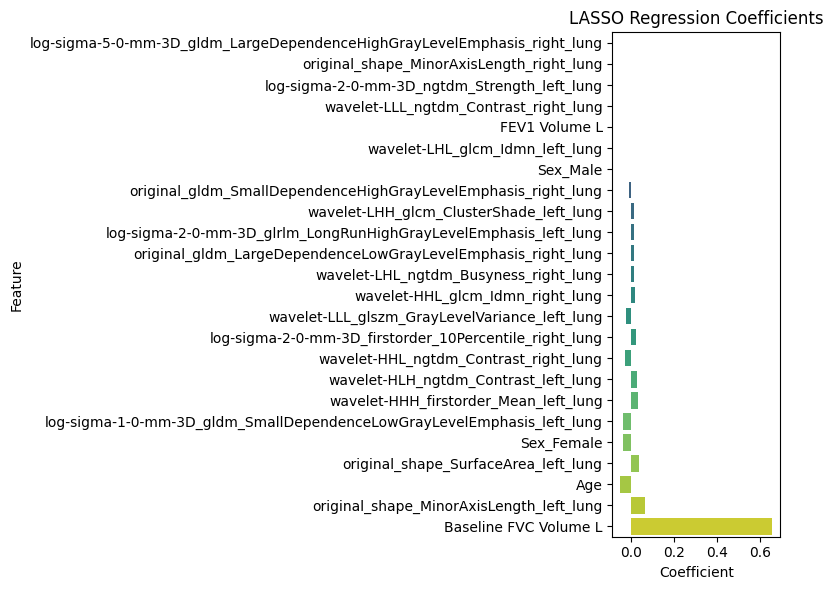

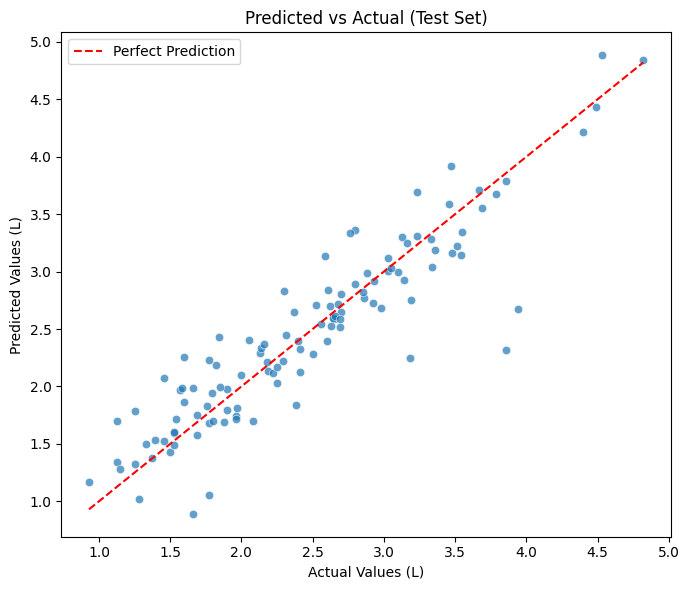

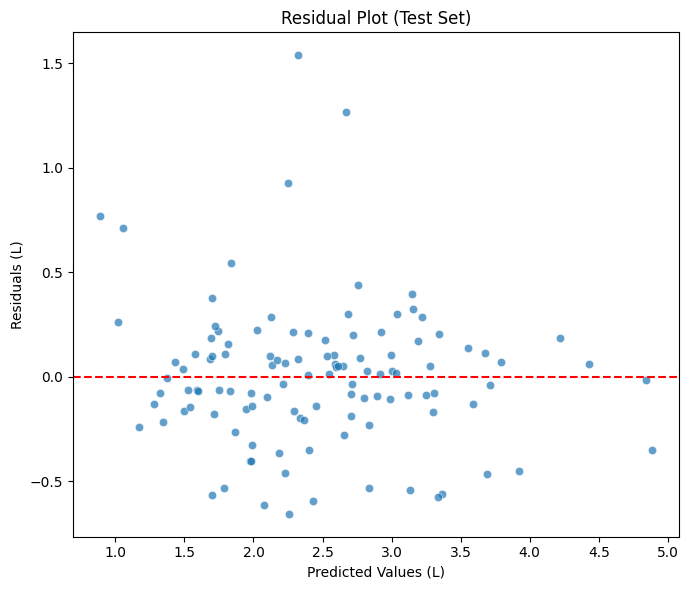


Top 5 patients with largest errors:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
132          2.36        3.86       2.320891   1.539109                  0   
451          2.50        3.94       2.671292   1.268708                  0   
70           2.26        3.18       2.251378   0.928622                  0   
227          1.02        1.66       0.891280   0.768720                  0   
444          0.97        1.77       1.058403   0.711597                  0   

     Followup_FVC_Week  
132               56.0  
451               48.0  
70                56.0  
227               48.0  
444               48.0  


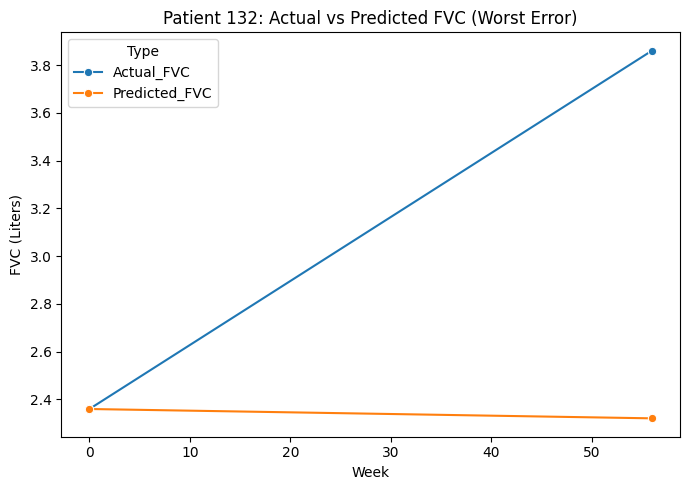

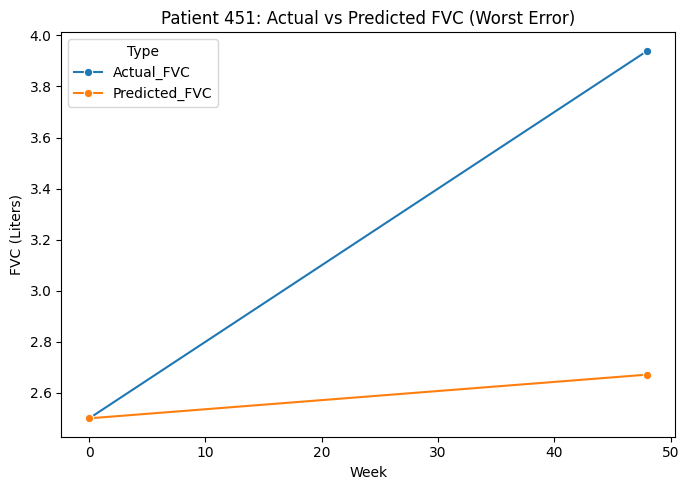

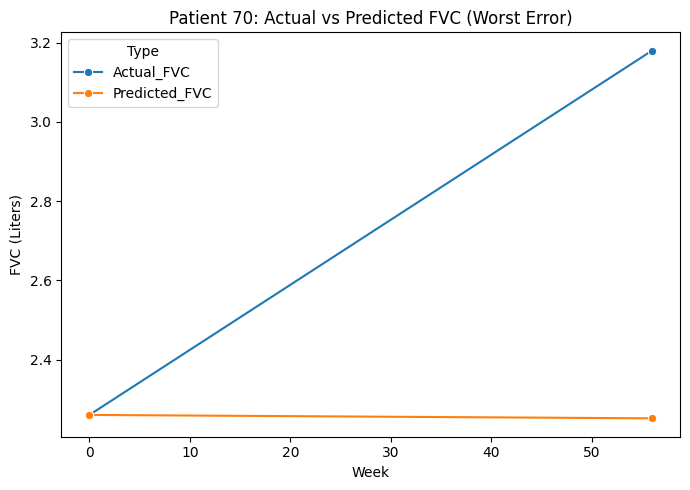

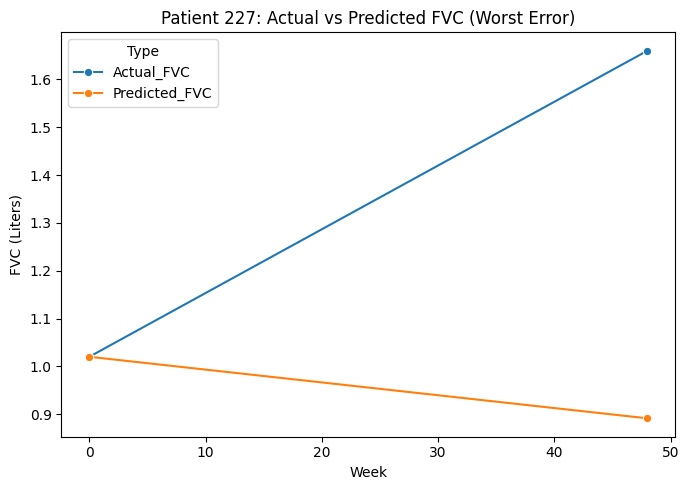

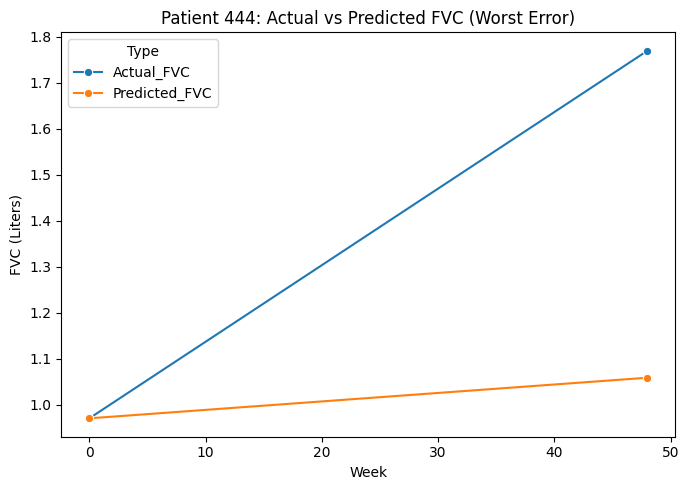


Top 5 patients with increasing FVC and lowest error:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
118          2.43        2.56       2.545905   0.014095                  0   
192          2.15        2.18       2.213049   0.033049                  0   
281          2.65        2.66       2.610711   0.049289                  0   
556          2.57        2.70       2.649910   0.050090                  0   
10           1.67        1.69       1.752178   0.062178                  0   

     Followup_FVC_Week  
118               52.0  
192               54.0  
281               52.0  
556               56.0  
10                50.0  


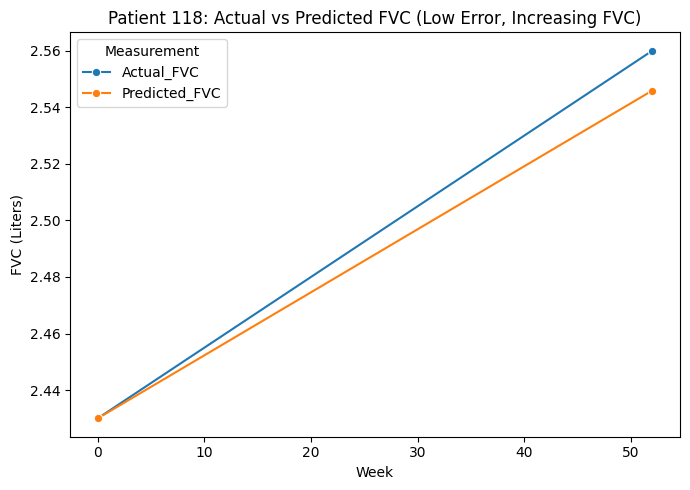

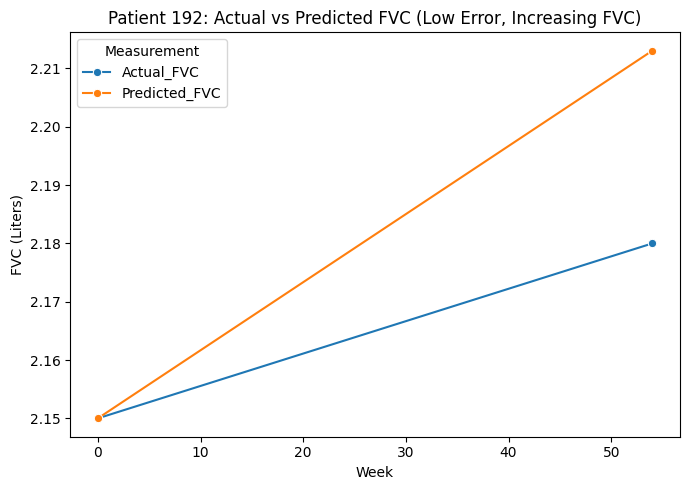

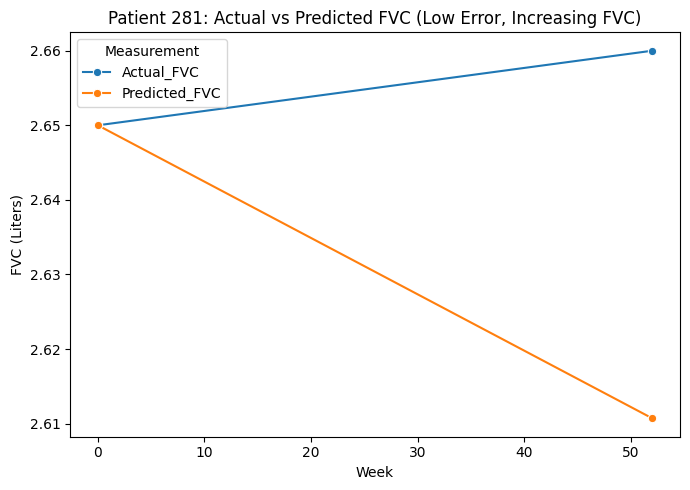

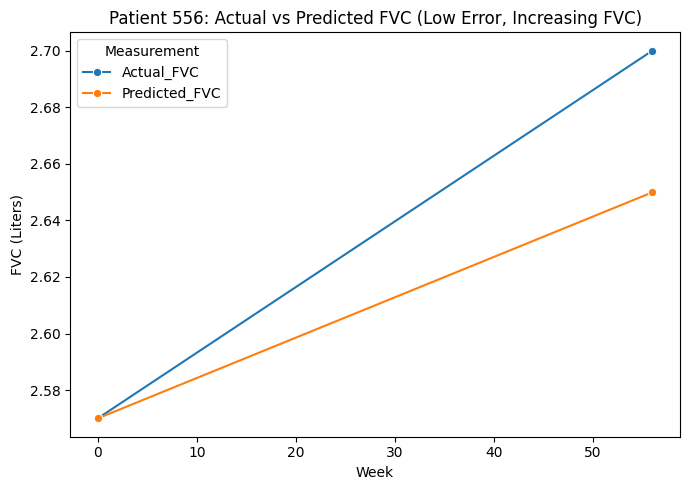

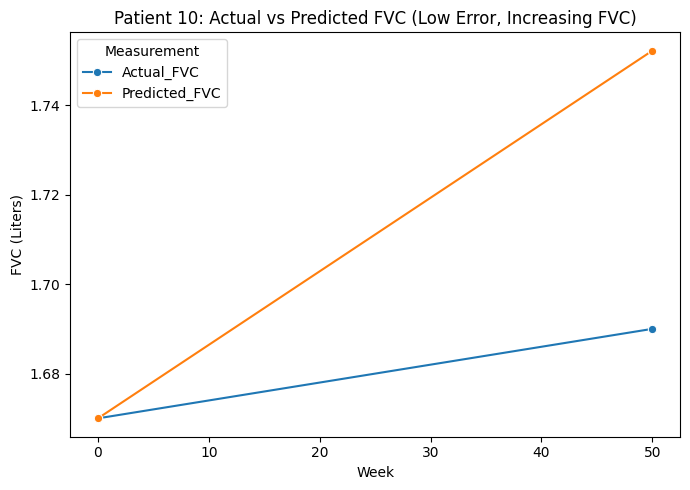

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


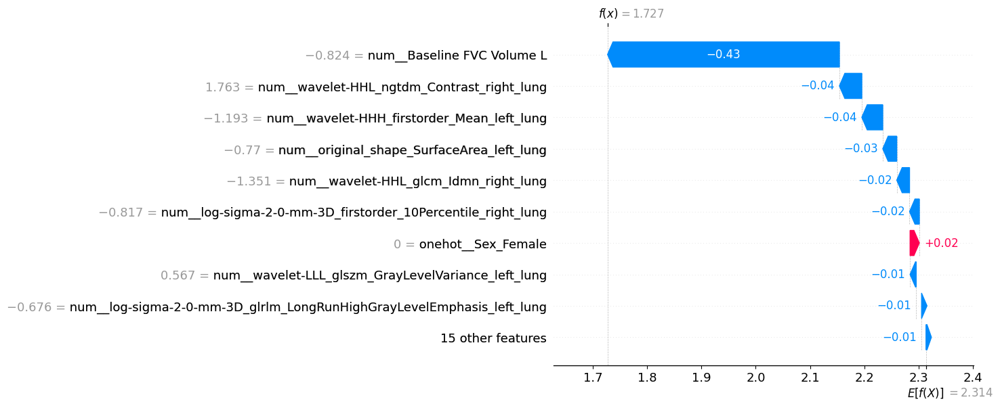

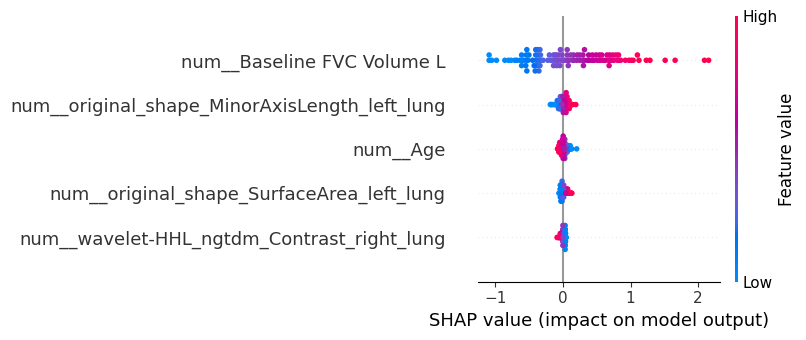

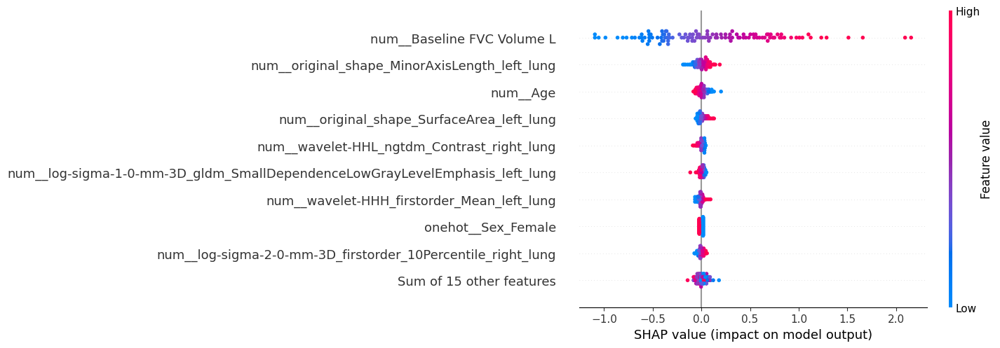

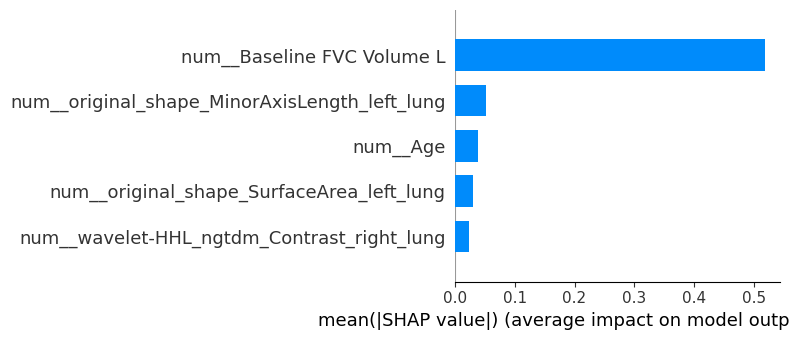

In [6]:
selected_features =['Baseline FVC Volume L', 'Age', 'FEV1 Volume L', 'original_shape_MinorAxisLength_left_lung', 'wavelet-HLH_ngtdm_Contrast_left_lung',  'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung', 'log-sigma-2-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'wavelet-LLL_glszm_GrayLevelVariance_left_lung',  'wavelet-HHH_firstorder_Mean_left_lung', 'wavelet-LHH_glcm_ClusterShade_left_lung', 'wavelet-HHL_ngtdm_Contrast_right_lung', 'wavelet-LHL_ngtdm_Busyness_right_lung', 'wavelet-LHL_glcm_Idmn_left_lung', 'original_shape_MinorAxisLength_right_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'original_gldm_SmallDependenceHighGrayLevelEmphasis_right_lung', 'log-sigma-2-0-mm-3D_firstorder_10Percentile_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Strength_left_lung', 'wavelet-LLL_ngtdm_Contrast_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'original_shape_SurfaceArea_left_lung']
Contineous = ['Sex_Female', 'Sex_Male']
 
Clinical_Contineous_data_ext = Contineous + selected_features
print(selected_features)
X_train, X_test, y_train, y_test = joblib.load("data_splits_without_nan.pkl")
# Subset features
X_train_sel = X_train[selected_features]
X_test_sel = X_test[selected_features]
print(X_train_sel.shape)
print(X_test_sel.shape)
# Run experiments
results1 = train_and_evaluate_lasso(X_train, X_test, y_train, y_test, selected_features, selected_features, Contineous, model_name="/home/pansurya/OSIC_thesis/Linear_model/Selected_features _from_all_methods.pkl")
# print("Running LOOCV experiment...")
# results1 = train_and_evaluate_with_LOOCV(X_train, X_test, y_train, y_test, selected_features, model_name="/home/pansurya/OSIC_thesis/Linear_model/PAM_ANOVA_VIF_LOOCV.pkl")


/tmp/ipykernel_1056000/713141644.py:46: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.

  sns.stripplot(data=melted, x="Metric", y="Value", hue="Model",


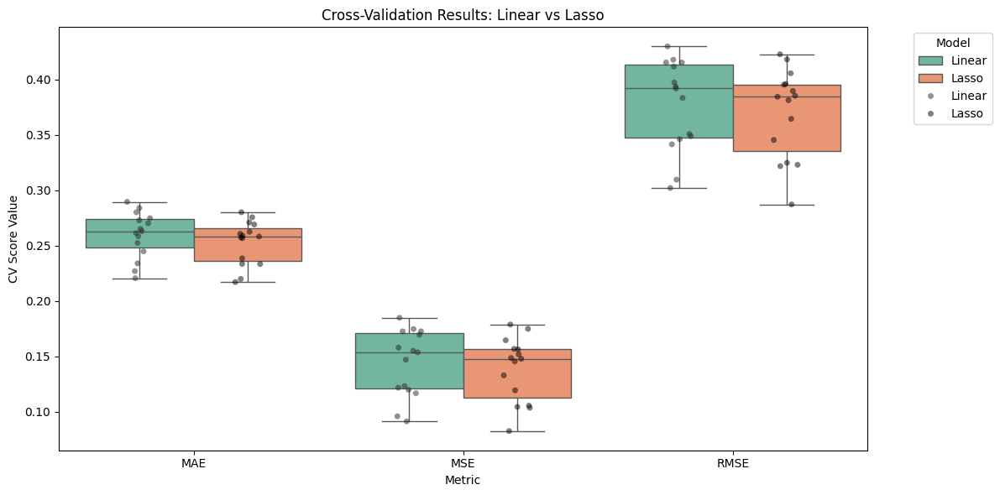

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ------------------------------
# Linear model CV results (15 folds)
# ------------------------------
linear_data = {
    "RepeatFold": list(range(1, 16)),
'MAE': [0.26295306171150423, 0.25236078861666833, 0.27276023364192753, 0.23388352193766943, 0.2649739889182695, 0.2746773690750782, 0.2839014819541063, 0.22044785304343154, 0.2447320561017776, 0.2894733957827127, 0.26124071150463324, 0.28003895864310846, 0.22688404625326866, 0.2700772622503131, 0.25833511052731467],
'MSE': [0.15491894290453037, 0.11975374368877044, 0.17251037388003468, 0.12160248798585387, 0.14687756201990482, 0.17248454245086872, 0.16938886151066385, 0.09577973781411005, 0.11656507698031575, 0.1847724718829563, 0.15781188886471295, 0.17456201141766484, 0.09119094937022035, 0.15355683303650186, 0.12302798719345225],
'RMSE': [0.3935974376244469, 0.34605453860449575, 0.41534368164212476, 0.34871548285938475, 0.3832460854593362, 0.4153125840266205, 0.41156878102045574, 0.30948301700434233, 0.3414162810709468, 0.42985168591382344, 0.3972554453556464, 0.4178061888216411, 0.301978392224047, 0.3918632836034806, 0.3507534564240989],
}
linear_cv = pd.DataFrame(linear_data)
linear_cv["Model"] = "Linear"

# ------------------------------
# Lasso model CV results (15 folds)
# ------------------------------
lasso_data = {
    "RepeatFold": list(range(1, 16)),
'MAE': [0.2590482079644644, 0.2573376947830238, 0.25660512360832577, 0.2333733120352697, 0.2624007573263708, 0.2605998152576159, 0.2755178298703751, 0.23326220673578993, 0.21981740937646554, 0.28007303800502314, 0.2690068242847488, 0.2708468799744973, 0.21698949514268348, 0.25810541991940317, 0.23841767998554364],
'MSE': [0.14771481827553853, 0.13275970989693076, 0.1453665641859832, 0.11924180787572425, 0.15670132035183346, 0.15174738911310842, 0.15624367257658947, 0.1054239092976543, 0.10426422528377767, 0.17476543876704276, 0.1644637115318106, 0.1786982575616283, 0.08243528987660072, 0.1484377634625975, 0.10350205707032835],
'RMSE': [0.3843368552136765, 0.3643620588054288, 0.3812696738346537, 0.3453140713549395, 0.3958551759821178, 0.3895476724524335, 0.39527670381213903, 0.32469048230222936, 0.3228997139728954, 0.41804956496454193, 0.40554125749646064, 0.4227271668128609, 0.2871154643633824, 0.3852762170996252, 0.32171735587364314],
}
lasso_cv = pd.DataFrame(lasso_data)
lasso_cv["Model"] = "Lasso"

# ------------------------------
# Combine and reshape
# ------------------------------
combined = pd.concat([linear_cv, lasso_cv], ignore_index=True)

melted = combined.melt(
    id_vars=["RepeatFold", "Model"],
    value_vars=["MAE", "MSE", "RMSE"],
    var_name="Metric",
    value_name="Value"
)

# ------------------------------
# Plot boxplots
# ------------------------------
plt.figure(figsize=(12, 6))
sns.boxplot(data=melted, x="Metric", y="Value", hue="Model", palette="Set2")
sns.stripplot(data=melted, x="Metric", y="Value", hue="Model",
              dodge=True, color="black", alpha=0.5)

plt.title("Cross-Validation Results: Linear vs Lasso")
plt.ylabel("CV Score Value")
plt.xlabel("Metric")
plt.legend(title="Model", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


['original_firstorder_Kurtosis_right_lung', 'log-sigma-4-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_left_lung', 'wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung', 'wavelet-LLL_glrlm_RunLengthNonUniformity_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Busyness_left_lung', 'log-sigma-1-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_lung', 'log-sigma-3-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_glrlm_GrayLevelNonUniformity_left_lung', 'original_firstorder_MeanAbsoluteDeviation_right_lung', 'wavelet-LHL_glrlm_GrayLevelNonUniformity_left_lung', 'log-sigma-4-0-mm-3D_glszm_GrayLevelNonUniformity_right_lung', 'log-sigma-2-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung', 'original_glrlm_GrayLevelNonUniformity_right_lung', 'original_firstorder_90Percentile_right_lung', 'log-sigma-5-0-mm-3D_firstorder_Energy_left_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung

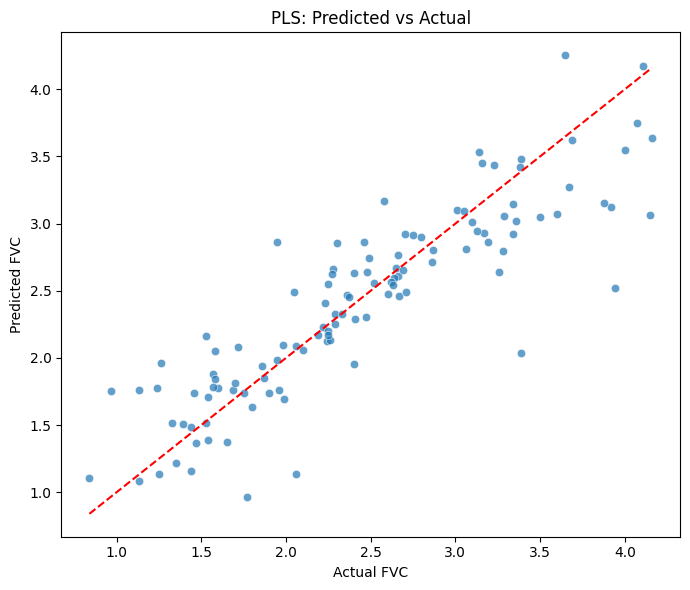

In [9]:
import numpy as np
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.cross_decomposition import PLSRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

def train_pls_with_tuning(X_train, X_test, y_train, y_test, selected_features,
                          numeric_features, onehot_features,
                          model_name="pls_best_model.pkl"):

    # Preprocessing
    preprocessor = ColumnTransformer([
        ("num", StandardScaler(), numeric_features),
        ("cat", "passthrough", onehot_features)
    ])

    # Pipeline
    pipeline = Pipeline([
        ("pre", preprocessor),
        ("pls", PLSRegression())
    ])

    # Grid search over number of components
    param_grid = {
        "pls__n_components": list(range(2, min(len(numeric_features) + len(onehot_features), 20)))
    }

    grid = GridSearchCV(
        pipeline,
        param_grid,
        cv=5,
        scoring="neg_mean_squared_error",
        n_jobs=-1
    )

    grid.fit(X_train, y_train)

    # Best model
    best_model = grid.best_estimator_
    best_n = grid.best_params_["pls__n_components"]
    print(f"✅ Best number of components: {best_n}")

    # Evaluate on test set
    y_test_pred = best_model.predict(X_test)
    test_mae = mean_absolute_error(y_test, y_test_pred)
    test_mse = mean_squared_error(y_test, y_test_pred)
    test_rmse = np.sqrt(test_mse)
    test_r2 = r2_score(y_test, y_test_pred)

    print("\n📊 Test set performance:")
    print(f"MAE:  {test_mae:.3f}")
    print(f"RMSE: {test_rmse:.3f}")
    print(f"R²:   {test_r2:.3f}")

    # Save model
    joblib.dump(best_model, model_name)

    # Plot predicted vs actual
    plt.figure(figsize=(7, 6))
    sns.scatterplot(x=y_test, y=y_test_pred.flatten(), alpha=0.7)
    plt.plot([y_test.min(), y_test.max()],
             [y_test.min(), y_test.max()],
             color="red", linestyle="--")
    plt.xlabel("Actual FVC")
    plt.ylabel("Predicted FVC")
    plt.title("PLS: Predicted vs Actual")
    plt.tight_layout()
    plt.show()

    return {
        "best_n_components": best_n,
        "test_results": {
            "MAE": test_mae,
            "RMSE": test_rmse,
            "R2": test_r2
        }
    }


selected_features = ['original_firstorder_Kurtosis_right_lung',
       'log-sigma-4-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_left_lung',
       'wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung',
       'wavelet-LLL_glrlm_RunLengthNonUniformity_right_lung',
       'log-sigma-2-0-mm-3D_ngtdm_Busyness_left_lung',
       'log-sigma-1-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_right_lung',
       'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_lung',
       'log-sigma-3-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung',
       'log-sigma-1-0-mm-3D_glrlm_GrayLevelNonUniformity_left_lung',
       'original_firstorder_MeanAbsoluteDeviation_right_lung',
       'wavelet-LHL_glrlm_GrayLevelNonUniformity_left_lung',
       'log-sigma-4-0-mm-3D_glszm_GrayLevelNonUniformity_right_lung',
       'log-sigma-2-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung',
       'original_glrlm_GrayLevelNonUniformity_right_lung',
       'original_firstorder_90Percentile_right_lung',
       'log-sigma-5-0-mm-3D_firstorder_Energy_left_lung',
       'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung',
       'log-sigma-2-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung',
       'log-sigma-3-0-mm-3D_glrlm_RunPercentage_left_lung',
       'wavelet-LLL_firstorder_90Percentile_left_lung',
       'wavelet-HLL_glrlm_RunLengthNonUniformity_right_lung',
       'log-sigma-1-0-mm-3D_glszm_ZoneVariance_left_lung',
       'original_shape_MinorAxisLength_left_lung',
       'log-sigma-2-0-mm-3D_ngtdm_Busyness_right_lung',
       'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung',
       'original_gldm_SmallDependenceHighGrayLevelEmphasis_right_lung',
       'original_glszm_LargeAreaLowGrayLevelEmphasis_left_lung',
       'log-sigma-4-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung',
       'log-sigma-3-0-mm-3D_glszm_ZoneVariance_right_lung',
       'log-sigma-3-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung']
Clinical_Contineous_data_ext = Clinical_Contineous_data + selected_features
print(selected_features)
X_train, X_test, y_train, y_test = joblib.load("data_splits.pkl")
# Subset features
X_train_sel = X_train[selected_features]
X_test_sel = X_test[selected_features]
print(X_train_sel.shape)
print(X_test_sel.shape)
# Run experiments
results1 = train_pls_with_tuning(X_train, X_test, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data, model_name="/home/pansurya/OSIC_thesis/Linear_model/PAM_ANOVA_VIF.pkl")

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


/home/pansurya/.venv/lib64/python3.9/site-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


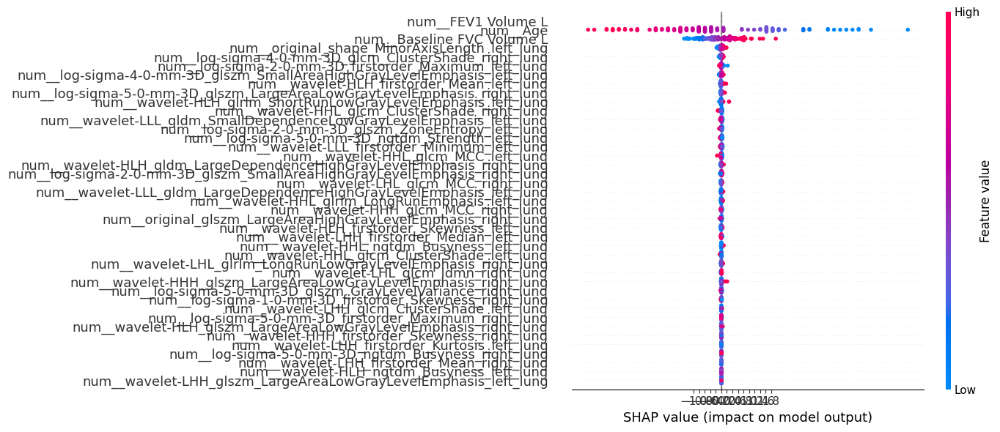

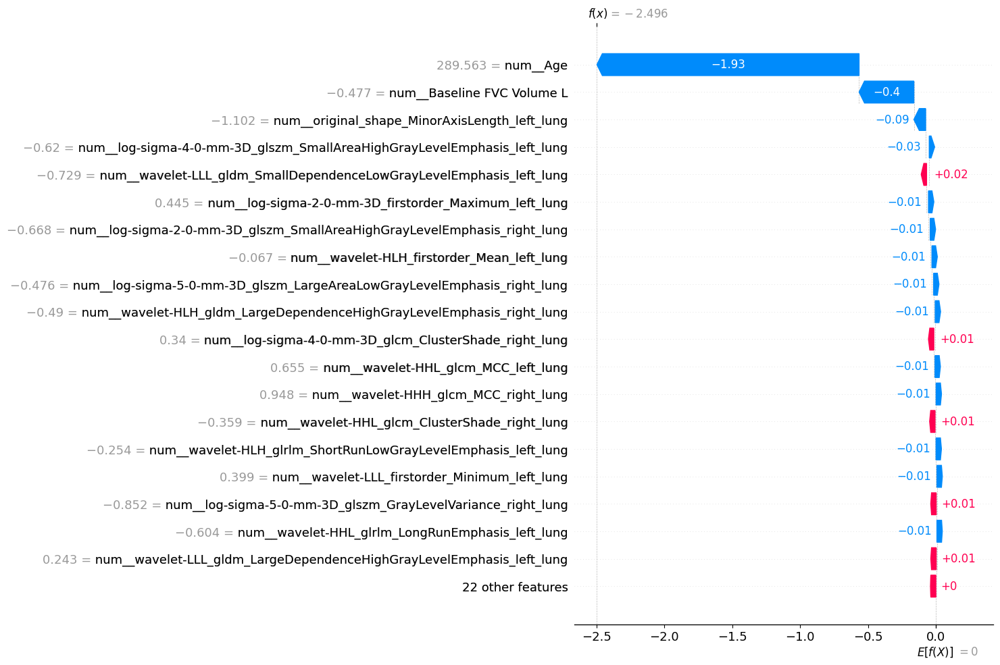

posx and posy should be finite values
posx and posy should be finite values


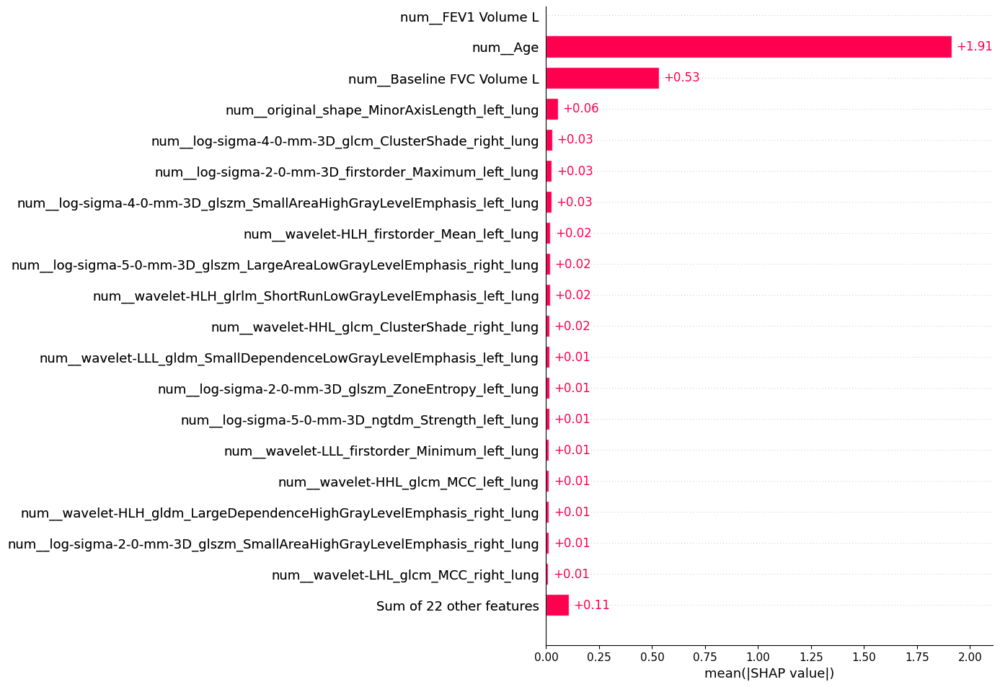

In [23]:
import joblib
import shap
import numpy as np

# Load model and data
model = joblib.load("/home/pansurya/OSIC_thesis/LASSO_model/LASSO_With_All_Clinical_Radiomics_with_harmonizationpycombat.pkl")
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_with_clinical_harmonization.pkl")

# Extract components
preprocessor = model.named_steps["scaler"]
en_model = model.named_steps["lasso"]

# Scale data
X_train_scaled = preprocessor.transform(X_train)
X_test_scaled = preprocessor.transform(X_test)
feature_names = preprocessor.get_feature_names_out()

# Get selected features
coef = en_model.coef_
selected_mask = coef != 0
selected_features = feature_names[selected_mask]
X_test_selected = X_test_scaled[:, selected_mask]

# SHAP explainer
explainer = shap.LinearExplainer(en_model, X_train_scaled, feature_perturbation="interventional")
shap_values = explainer.shap_values(X_test_scaled)
shap_values_selected = shap_values[:, selected_mask]

# ✅ SHAP summary plot (filtered)
import matplotlib.pyplot as plt
import numpy as np

# Draw SHAP summary plot without showing it immediately
shap.summary_plot(
    shap_values_selected,
    X_test_selected,
    feature_names=selected_features,
    max_display=50,
    show=False  # Let us customize before showing
)

# ✅ Make the plot wider for clarity
plt.gcf().set_size_inches(14, 6)  # Width = 14 inches, Height = 6 inches

# ✅ Add integer x-axis ticks (e.g., -5 to +5)
plt.xticks(np.arange(-1, 2, 0.2))  # Tick marks at every integer from -5 to +5

# Optional: Add vertical line at x=0 for reference
plt.axvline(x=0, color="gray", linestyle="--", linewidth=1)

# ✅ Show the customized plot
plt.tight_layout()
plt.show()

import numpy as np
import shap
import matplotlib.pyplot as plt

# ✅ Choose patient index
patient_index = 10

# ✅ Sanitize SHAP values and input data
safe_shap_values = np.nan_to_num(shap_values_selected[patient_index], nan=0.0, posinf=0.0, neginf=0.0)
safe_input_data = np.nan_to_num(X_test_selected[patient_index], nan=0.0, posinf=0.0, neginf=0.0)

# ✅ Sanitize base value
safe_base_value = np.nan_to_num(explainer.expected_value, nan=0.0, posinf=0.0, neginf=0.0)

# ✅ Check if everything is finite
if np.isfinite(safe_shap_values).all() and np.isfinite(safe_input_data).all() and np.isfinite(safe_base_value):
    explanation = shap.Explanation(
        values = safe_shap_values,
        base_values = safe_base_value,
        data = safe_input_data,
        feature_names = selected_features
    )

    plt.gcf().set_size_inches(10, 8)
    shap.plots.waterfall(explanation, max_display=20)
else:
    print("❌ Cannot plot: SHAP values or input data contain invalid entries.")

import shap
import matplotlib.pyplot as plt

# ✅ Build a SHAP Explanation object for the whole dataset
explanation = shap.Explanation(
    values = shap_values_selected,
    base_values = explainer.expected_value,
    data = X_test_selected,
    feature_names = selected_features
)

# ✅ Make the plot larger
plt.gcf().set_size_inches(10, 8)

# ✅ SHAP bar plot (mean absolute SHAP values)
shap.plots.bar(explanation, max_display=20)


In [3]:
import joblib
import pandas as pd

import pandas as pd

# One patient's data with all required features
new_patient_data = pd.DataFrame([{
    'wavelet-HLL_firstorder_Skewness_right_lung': 0.85,
    'DLCO_CAP': 55.2,
    'Primary Diagnosis_Exposure-related': 0,
    'Smoking History_Never Smoker': 0,
    'Primary Diagnosis_CTD-ILD': 0,
    'Smoking History_No Knowledge': 0,
    'Primary Diagnosis_Idiopathic OP': 0,
    'Primary Diagnosis_UILD': 0,
    'Primary Diagnosis_Fibrotic HP (FHP)': 0,
    'log-sigma-1-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung': 1.12,
    'original_shape_MinorAxisLength_right_lung': 92.3,
    'FEV1 Volume L': 2.1,
    'Sex_Male': 1,
    'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung': 0.76,
    'original_shape_SurfaceArea_left_lung': 1450.5,
    'original_shape_MinorAxisLength_left_lung': 88.7,
    'Primary Diagnosis_No information': 0,
    'Primary Diagnosis_Sarcoidosis': 0,
    'Primary Diagnosis_Occupational-related ILD': 0,
    'Baseline FVC Volume L': 2.95,
    'Primary Diagnosis_Miscellaneous': 0,
    'Primary Diagnosis_INSIP': 0,
    'Smoking History_Ex Smoker': 1,
    'Primary Diagnosis_IPF': 1,
    'Primary Diagnosis_Emphysema': 0,
    'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung': 0.43,
    'Primary Diagnosis_Idiopathic pleuroparenchymal fibroelastosis (IPPFE)': 0,
    'Primary Diagnosis_Smoking Related ILD (DIP / RB / RB-ILD)': 0,
    'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung': 1.34,
    'Age': 55, 'wavelet-LLL_ngtdm_Contrast_right_lung': 0.00435, 'original_glszm_LargeAreaLowGrayLevelEmphasis_right_lung': 0.5645, 'wavelet-HHL_glszm_LargeAreaHighGrayLevelEmphasis_right_lung': 0.00564
}])



# Load the saved Lasso pipeline
pipeline = joblib.load("/home/pansurya/OSIC_thesis/Linear_model/Hierarchical_ANOVA_VIF.pkl")
# Predict FVC
predicted_fvc = pipeline.predict(new_patient_data)[0]
print(f"Predicted FVC: {predicted_fvc:.2f} L")


Predicted FVC: 2.45 L
